#### Import Library

In [1]:
import pandas as pd
import numpy as np
import mplfinance as mpf
import matplotlib.pyplot as plt
import matplotlib.patches as patches

#### Load Historical Stock Data

We choose to use EURUSD forex data, with a 15-min interval, from 2021-06 - 2025-05

In [2]:
filename = "EURUSD_M15_modified.csv"
df = pd.read_csv(filename, sep=None, engine='python')
df["Datetime"] = pd.to_datetime(
    df["Date"] + " " + df["Time"],
    format="%Y-%m-%d %H:%M:%S"
)
df.drop(columns=['Volume', "Date", "Time"], inplace=True)
# Set as index and sort
df.set_index('Datetime', inplace=True)
df.sort_index(inplace=True)

print(df.head())

                        Open     High      Low    Close
Datetime                                               
2021-06-08 12:15:00  1.21813  1.21843  1.21796  1.21836
2021-06-08 12:30:00  1.21836  1.21882  1.21806  1.21807
2021-06-08 12:45:00  1.21809  1.21813  1.21724  1.21758
2021-06-08 13:00:00  1.21756  1.21835  1.21750  1.21819
2021-06-08 13:15:00  1.21820  1.21844  1.21770  1.21770


#### Data Cleaning & Feature Engineering

We only use 2025 data since it is most relevant to future performance prediction.

After that, we obtain EMA30 and EMA120.

No. of Data Points:  10912
Columns:  Index(['Open', 'High', 'Low', 'Close', 'EMA_30', 'EMA_120', 'trend', 'Green'], dtype='object')


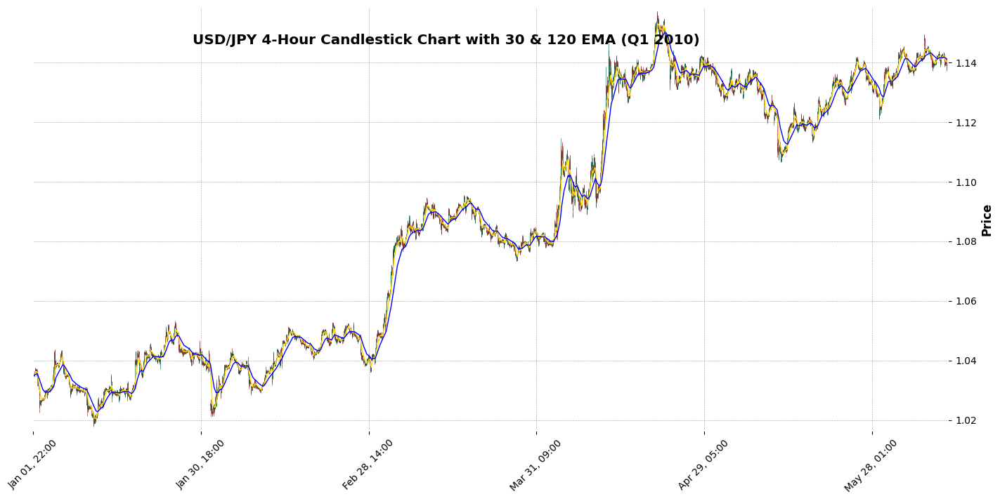

In [3]:
# Filter for the latest 2025  data  using datetime index
df = df[(df.index >= '2025-01-01') ].copy() # & (df.index <= '2010-05-29')

# Create a copy of the filtered DataFrame for analysis.
df_4h = df.copy()

# Calculate the 30-period and 120-period Exponential Moving Averages (EMAs).
# EMAs are used to identify trend direction by smoothing out price data.
# A shorter period EMA (30) reacts to price changes more quickly than a longer one (120).
df_4h['EMA_30'] = df_4h['Close'].ewm(span=30, adjust=False).mean()
df_4h['EMA_120'] = df_4h['Close'].ewm(span=120, adjust=False).mean()

# Determine the market trend based on the EMA crossover strategy.
# - 'bullish': When the short-term EMA (30) is above the long-term EMA (120).
# - 'bearish': When the short-term EMA is below the long-term EMA.
# - np.nan: When the EMAs are equal or cannot be calculated.
df_4h['trend'] = np.where(df_4h['EMA_30'] > df_4h['EMA_120'], 'bullish',
                          np.where(df_4h['EMA_30'] < df_4h['EMA_120'], 'bearish', np.nan))

# Identify if a candle is "green" (bullish) or "red" (bearish).
# A candle is green if the closing price is higher than the opening price.
# The result is stored as an object type to accommodate True, False, and NA values.
df_4h["Green"] = np.select(
    [df_4h["Close"] > df_4h["Open"], df_4h["Close"] < df_4h["Open"]],
    [True, False],
    default=pd.NA
).astype("object")


# --- Diagnostics ---
# Print the total number of data points and the column names of the
# processed DataFrame to verify the data preparation steps.
print("No. of Data Points: ", len(df_4h))
print("Columns: ", df_4h.columns)

# --- Visualization ---

# Define the additional plots (addplots) to overlay the EMAs on the main chart.
# This makes the main plot call cleaner and more readable.
add_plots = [
    mpf.make_addplot(df_4h['EMA_30'], color='gold', width=1),  # Short-term EMA in gold
    mpf.make_addplot(df_4h['EMA_120'], color='blue', width=1)   # Long-term EMA in blue
]

# Plot the candlestick chart using the mplfinance library.
# NOTE: The title is hardcoded to 'Q1 2010', which may not match the
# date range being filtered in the code ('2025-01-01' onwards).
mpf.plot(df_4h[['Open', 'High', 'Low', 'Close']],  # Selects the essential OHLC data
         warn_too_much_data=1000000,               # Increases the data warning limit
         type='candle',                            # Specifies a candlestick chart
         style='charles',                          # Sets the visual style of the chart
         title='USD/JPY 4-Hour Candlestick Chart with 30 & 120 EMA (Q1 2010)',
         ylabel='Price',                           # Sets the label for the y-axis
         volume=False,                             # Hides the volume subplot
         figsize=(15, 7),                          # Sets the figure size for better readability
         tight_layout=True,                        # Adjusts plot to fit within the figure area
         addplot=add_plots                         # Adds the previously defined EMA plots
         )

In [7]:
# ----------  Helper Function  ----------

def _valid(series_like) -> bool:
    """
    Checks if a series-like object (list, NumPy array, or Pandas Series)
    contains at least one valid, non-NaN value.

    Returns:
        bool: True if at least one finite value exists, False otherwise.
    """
    # Convert input to a Pandas Series and check if any value is not null.
    return pd.Series(series_like).notna().any()

# ----------  Main Plotting Function  ----------

def plot_fibonacci_candlestick(
    df,
    start_idx,
    end_idx,
    levels=None,
    trend="bearish",
    entry_signal=None,
    engulfing_candle=None,
    R=None,
    atr_period=21,
    atr_multiplier=1.0,
    plot_until_idx=None
):
    """
    Generates a candlestick chart with Fibonacci retracement levels, EMAs,
    an optional entry signal, and a risk/reward box based on ATR.

    Args:
        df (pd.DataFrame): DataFrame containing OHLC, EMA_30, and EMA_120 columns.
        start_idx (int): The starting index for the Fibonacci calculation window.
        end_idx (int): The ending index for the Fibonacci calculation window.
        levels (list, optional): Fibonacci levels to plot. Defaults to a standard set.
        trend (str, optional): "bearish" or "bullish". Determines Fib calculation direction.
        entry_signal (int, optional): Index of the candle to mark as the trade entry.
        engulfing_candle (int, optional): Index of the candle used for SL/TP calculation.
        R (float, optional): The risk-to-reward ratio for the trade.
        atr_period (int, optional): The period for ATR calculation.
        atr_multiplier (float, optional): Multiplier for ATR to determine stop-loss distance.
        plot_until_idx (int, optional): The index where the trade ends, used for drawing the reward box width.
    """

    # --- 0. Pre-computation Checks ---

    # Ensure the 'label' column exists to prevent errors during annotation.
    # If it's not present, initialize it as an empty column of type 'object'.
    if 'label' not in df.columns:
        df["label"] = None
        df["label"] = df["label"].astype(object)

    # --- 1. Fibonacci Retracement Calculation ---

    # Use default Fibonacci levels if none are provided.
    if levels is None:
        levels = [0, 0.236, 0.382, 0.5, 0.618, 0.786, 1]

    # Define the window for finding the min/max price for Fibonacci levels.
    window = df.iloc[start_idx:end_idx + 1].copy()
    min_price = window['Low'].min()
    max_price = window['High'].max()

    fib_lines = []
    fib_labels = []

    # Calculate the price for each Fibonacci level based on the trend.
    for level in levels:
        if trend == "bearish":
            # In a bearish trend, levels are measured up from the low.
            y = min_price + (max_price - min_price) * level
        else:
            # In a bullish trend, levels are measured down from the high.
            y = max_price - (max_price - min_price) * level

        # Create a plottable series for the Fibonacci line.
        line_data = [np.nan] * len(df)
        line_data[start_idx:end_idx + 1] = [y] * (end_idx - start_idx + 1)

        # Add the line to the plot only if it contains valid data.
        if _valid(line_data):
            fib_lines.append(
                mpf.make_addplot(line_data, color="gray", linestyle="--", width=0.7)
            )
            fib_labels.append((level, y))

    # --- 2. Prepare Additional Plots (EMAs and Entry Signal) ---

    # Create plot objects for the 30 and 120-period EMAs.
    ema_30_plot = mpf.make_addplot(df['EMA_30'], color='gold', width=1.2, panel=0)
    ema_120_plot = mpf.make_addplot(df['EMA_120'], color='blue', width=1.2, panel=0)

    all_addplots = fib_lines + [ema_30_plot, ema_120_plot]

    # If an entry signal is provided, create a scatter plot marker for it.
    if entry_signal is not None and 0 <= entry_signal < len(df):
        entry_price = df['Close'].iloc[entry_signal]
        marker = '^' if trend == "bullish" else 'v'
        color = 'green' if trend == "bullish" else 'red'
        signal_plot = mpf.make_addplot(
            [entry_price if i == entry_signal else np.nan for i in range(len(df))],
            type='scatter',
            markersize=100,
            marker=marker,
            color=color
        )
        all_addplots.append(signal_plot)

    # --- 3. ATR, Stop Loss, and Take Profit Calculation ---
    stop_loss_price = None
    take_profit_price = None

    # This block executes only if parameters for a trade are defined.
    if R is not None and engulfing_candle is not None:
        # Slice the DataFrame to get the necessary window for ATR calculation.
        df_slices = df.iloc[engulfing_candle - (atr_period + 1):engulfing_candle + 1].copy()

        # Calculate True Range (TR).
        df_slices['H-L'] = df_slices['High'] - df_slices['Low']
        df_slices['H-PC'] = abs(df_slices['High'] - df_slices['Close'].shift(1))
        df_slices['L-PC'] = abs(df_slices['Low'] - df_slices['Close'].shift(1))
        df_slices['TR'] = df_slices[['H-L', 'H-PC', 'L-PC']].max(axis=1)

        # Calculate the Average True Range (ATR).
        df_slices['ATR'] = df_slices['TR'].rolling(window=atr_period).mean()

        # Get the ATR value at the specific engulfing candle.
        atr_value = df_slices['ATR'].iloc[-1]
        pip_size = atr_multiplier * atr_value

        # Calculate Stop Loss and Take Profit levels.
        close_price = df['Close'].iloc[engulfing_candle]
        if trend == "bearish":
            stop_loss_price = close_price + pip_size
            take_profit_price = close_price - R * pip_size
        else:  # bullish
            stop_loss_price = close_price - pip_size
            take_profit_price = close_price + R * pip_size

    # --- 4. Chart Visualization ---

    # Determine the plotting range to "zoom in" on the relevant area.
    plot_buffer = 30  # Number of candles to show before the start index.
    extra_right = 20  # Number of candles to show after the trade exit.

    plot_start = max(0, start_idx - plot_buffer)
    if plot_until_idx is not None:
        plot_end = min(len(df) - 1, plot_until_idx + extra_right)
    else:
        plot_end = min(len(df) - 1, end_idx + plot_buffer + 20)

    # Create the main candlestick plot, returning the figure and axes for customization.
    fig, axlist = mpf.plot(df,
                           warn_too_much_data=1000000,
                           type='candle',
                           style='yahoo',
                           addplot=all_addplots,
                           title='Fibonacci Retracement with EMA and Reward Box',
                           ylabel='Price',
                           volume=False,
                           returnfig=True)

    ax = axlist[0]  # Main price panel.

    # Set the X-axis (time) and Y-axis (price) limits to the zoomed-in region.
    ax.set_xlim(plot_start, plot_end)

    df_slice_plot = df.iloc[plot_start:plot_end + 1]
    local_min = df_slice_plot['Low'].min()
    local_max = df_slice_plot['High'].max()
    
    # Adjust Y-axis to ensure the risk/reward box is fully visible.
    if R is not None and engulfing_candle is not None:
        local_min = min(local_min, stop_loss_price, take_profit_price)
        local_max = max(local_max, stop_loss_price, take_profit_price)

    price_padding = 0.1 * (local_max - local_min)
    ax.set_ylim(local_min - price_padding, local_max + price_padding)

    # --- 5. Draw Risk/Reward Box ---

    # Draw the colored boxes for risk (red) and reward (green) if a trade is defined.
    if R is not None and engulfing_candle is not None:
        close_price = df['Close'].iloc[engulfing_candle]

        # Determine the width of the box in terms of candle indices.
        if plot_until_idx is not None and plot_until_idx > engulfing_candle:
            box_left = engulfing_candle
            box_right = plot_until_idx
        else:
            box_left = engulfing_candle
            box_right = engulfing_candle + 10  # Fallback width.

        width = box_right - box_left

        if trend == "bearish":
            # Red Box (Risk): From entry price up to stop loss.
            red_box = patches.Rectangle(
                (box_left, close_price), width, pip_size,
                linewidth=0, facecolor='red', alpha=0.3, zorder=0
            )
            ax.add_patch(red_box)

            # Green Box (Reward): From entry price down to take profit.
            green_box = patches.Rectangle(
                (box_left, take_profit_price), width, R * pip_size,
                linewidth=0, facecolor='green', alpha=0.3, zorder=0
            )
            ax.add_patch(green_box)

        else:  # trend == "bullish"
            # Red Box (Risk): From entry price down to stop loss.
            red_box = patches.Rectangle(
                (box_left, stop_loss_price), width, pip_size,
                linewidth=0, facecolor='red', alpha=0.3, zorder=0
            )
            ax.add_patch(red_box)

            # Green Box (Reward): From entry price up to take profit.
            green_box = patches.Rectangle(
                (box_left, close_price), width, R * pip_size,
                linewidth=0, facecolor='green', alpha=0.3, zorder=0
            )
            ax.add_patch(green_box)

    # --- 6. Annotations ---

    # Annotate Fib levels
    for level, y in fib_labels:
        label_text = f"{level:.3f}"
        ax.annotate(label_text,
                    xy=(end_idx, y),
                    xytext=(5, 0),
                    textcoords='offset points',
                    ha='left',
                    va='center',
                    fontsize=8,
                    color='gray')

    # Annotate any labels from the df['label'] column with variable heights.
    for i in range(plot_start, plot_end + 1):
        label_info = df['label'].iloc[i]
        # Check if there is any label information at this index.
        if pd.notna(label_info):
            # Default values for backward compatibility or simple string labels.
            label_text = str(label_info)
            height_multiplier = 0.5  # Default height multiplier.

            # If the label is a tuple, unpack the text and height multiplier.
            if isinstance(label_info, tuple) and len(label_info) == 2:
                label_text, height_multiplier = label_info
            
            # Proceed with annotation only if the label text is not empty.
            if str(label_text).strip() != "":
                # Default anchor point and vertical alignment
                y_anchor = df['High'].iloc[i]
                y_offset_direction = 1  # Above the anchor
                va = 'bottom'

                # --- Special handling for 'Entry' label to avoid overlap ---
                if label_text == 'Entry':
                    if trend == 'bullish':
                        # For bullish entry, place the label BELOW the candle's low
                        y_anchor = df['Low'].iloc[i]
                        y_offset_direction = -1 # Below the anchor
                        va = 'top'
                    else: # bearish
                        # For bearish entry, place it even HIGHER above the candle's high
                        height_multiplier += 0.7 # Increase multiplier to push it higher

                # Calculate the final y-position
                y_position = y_anchor + (y_offset_direction * height_multiplier * price_padding)

                ax.annotate(str(label_text),
                            xy=(i, y_position),
                            xytext=(0, 3 * y_offset_direction), # Small pixel offset
                            textcoords='offset points',
                            ha='center',
                            va=va,
                            fontsize=8,
                            color='black',
                            rotation=0)


    # Display the final plot.
    plt.show()

    # Return the calculated trade levels.
    return stop_loss_price, take_profit_price, fib_labels


<>:84: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
<>:84: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
C:\Users\user\AppData\Local\Temp\ipykernel_29004\4104683621.py:84: SyntaxWarning: "is not" with 'str' literal. Did you mean "!="?
  if (current_trend == "bearish" and self.enter_market_trade_side is not "bullish"):


[2025-01-01 23:15:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-01-02 01:30:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


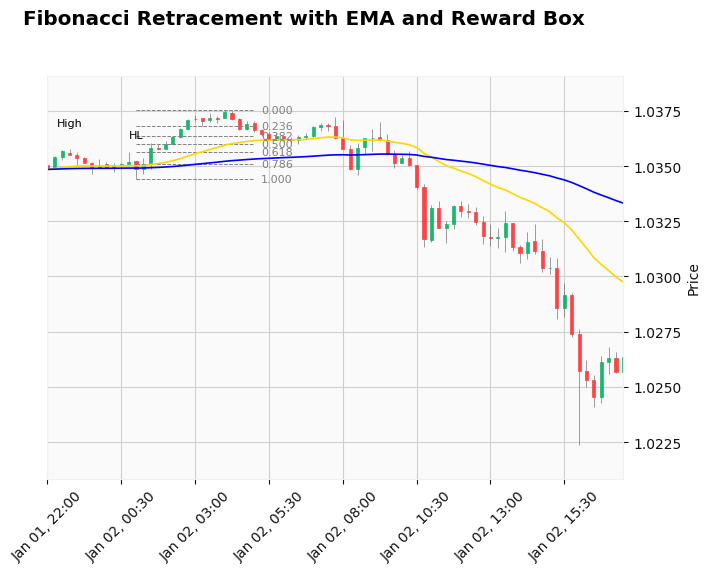

[2025-01-02 05:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


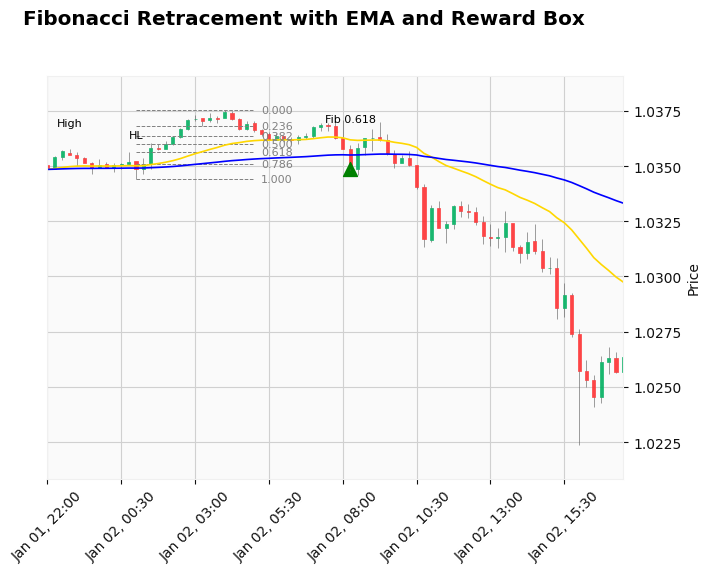

[2025-01-02 08:15:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


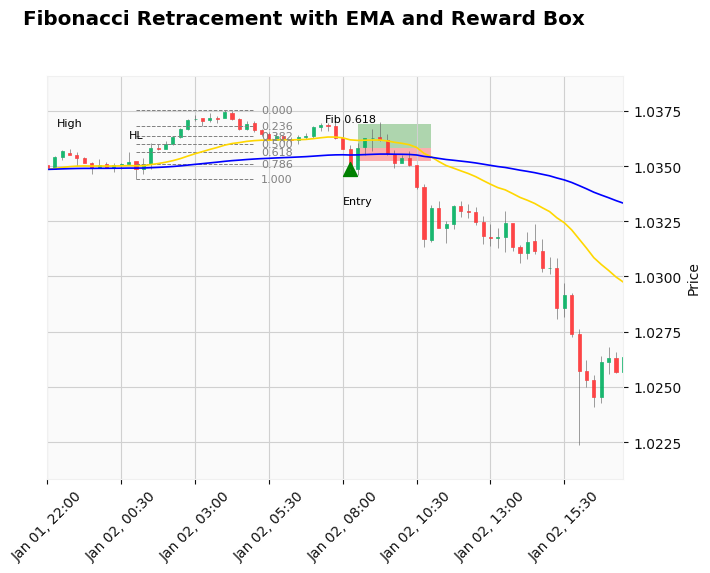

[2025-01-02 08:30:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


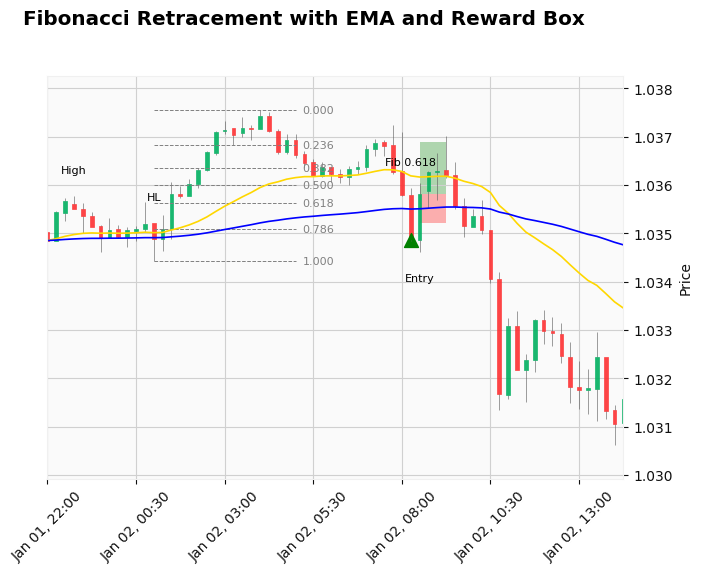

[2025-01-02 09:15:00] TAKE PROFIT triggered.
[2025-01-02 09:15:00] ENTER_MARKET completed – FSM reset (bull)
[2025-01-02 09:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 53
[2025-01-02 11:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-01-02 21:30:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 178
[2025-01-03 18:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-01-06 10:30:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-01-06 11:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


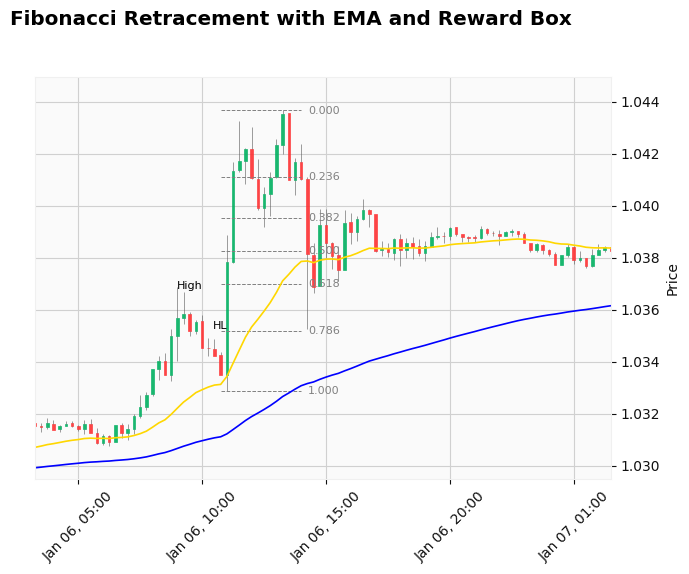

[2025-01-06 14:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


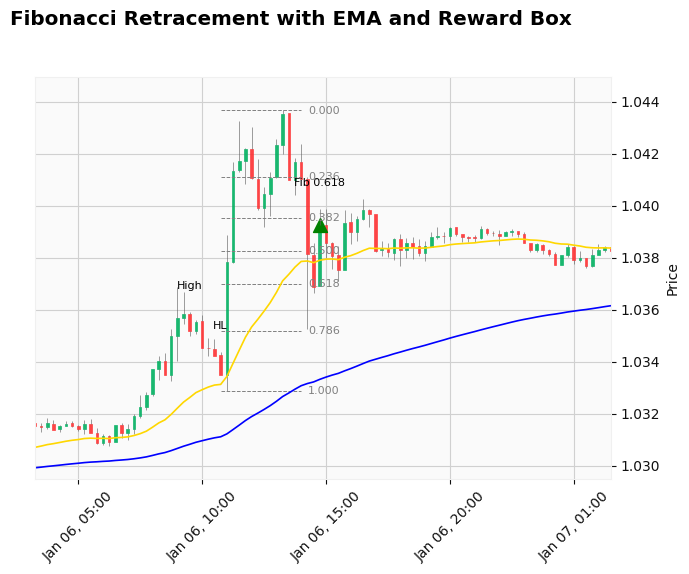

[2025-01-06 14:45:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


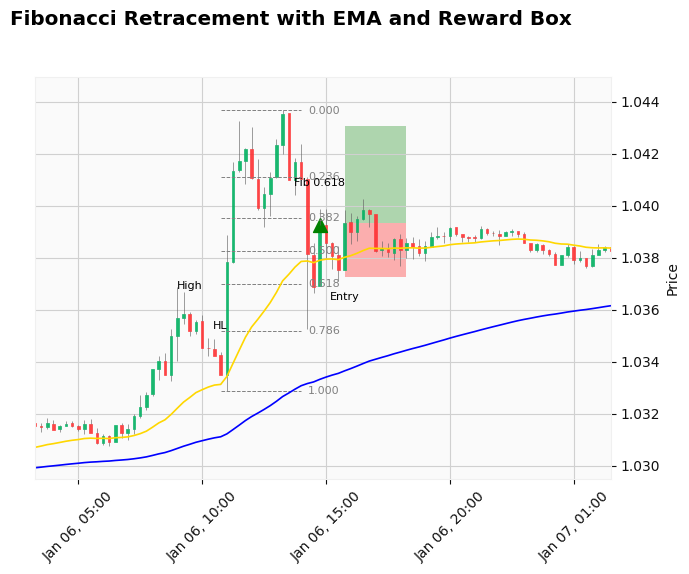

[2025-01-06 15:45:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


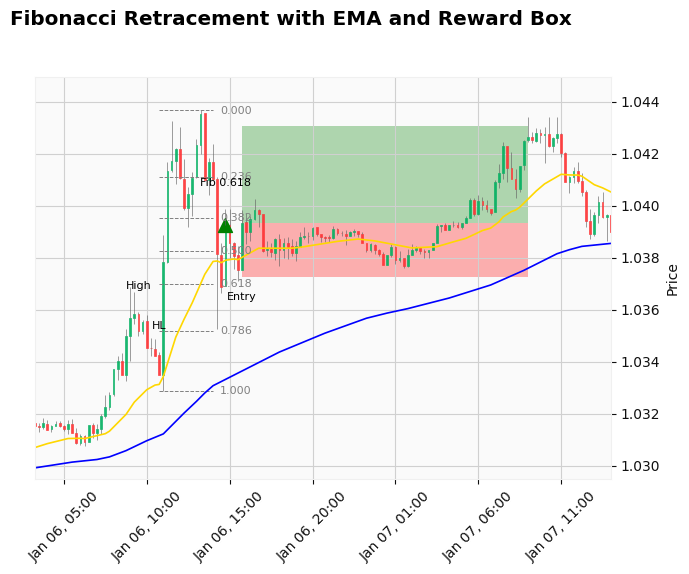

[2025-01-07 09:00:00] TAKE PROFIT triggered.
[2025-01-07 09:00:00] ENTER_MARKET completed – FSM reset (bull)
[2025-01-07 12:30:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 368
[2025-01-07 18:00:00] Trend changed from bullish to bearish, FSM RESET
[2025-01-07 22:30:00] State changed: IDLE → PULLBACK_DETECTED
[2025-01-08 07:30:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


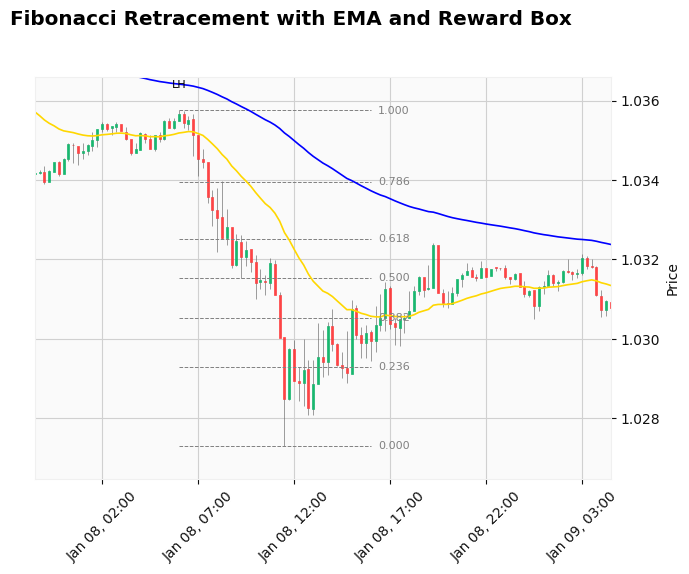

[2025-01-08 16:45:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-01-10 13:30:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


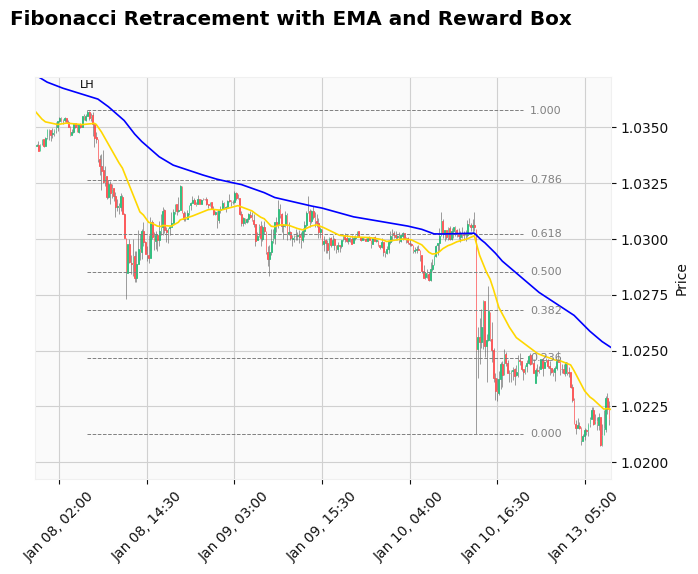

[2025-01-10 21:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-01-13 04:30:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


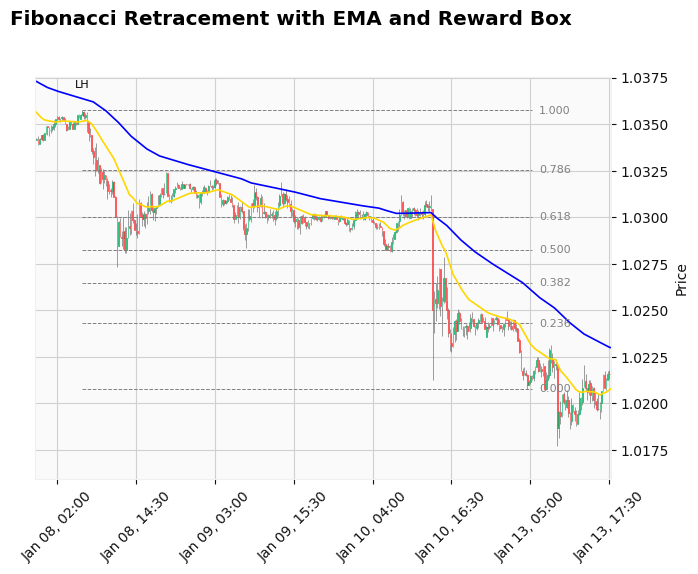

[2025-01-13 06:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-01-13 09:15:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


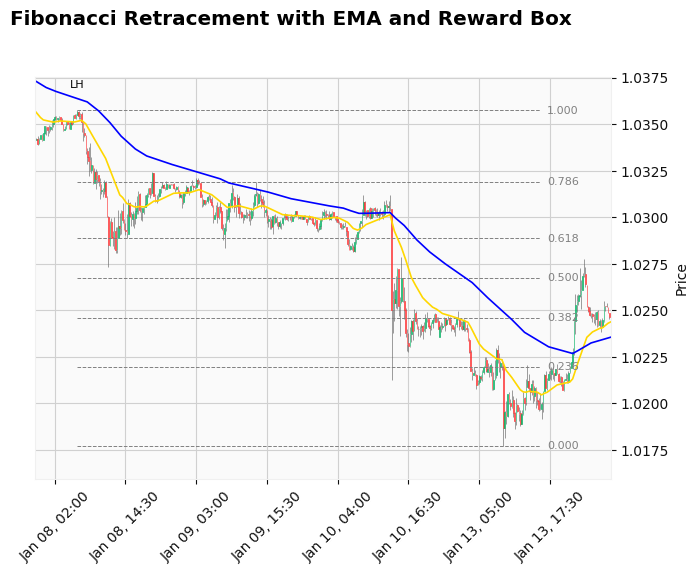

[2025-01-13 16:30:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
self.trend_changing_idx 774
[2025-01-13 23:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-01-14 00:15:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-01-14 15:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


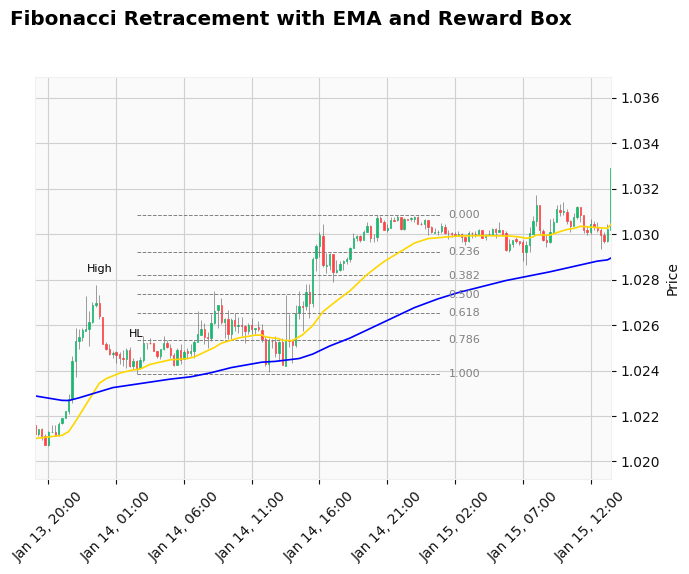

[2025-01-15 01:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-01-15 08:00:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


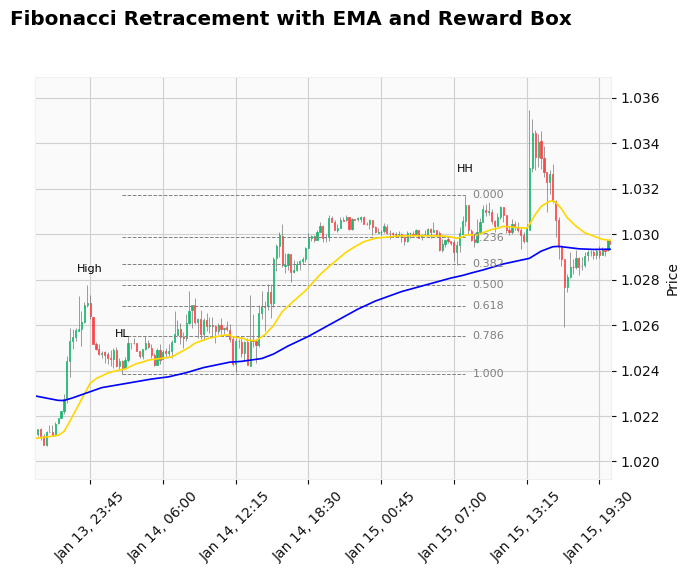

[2025-01-15 08:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-01-15 13:30:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


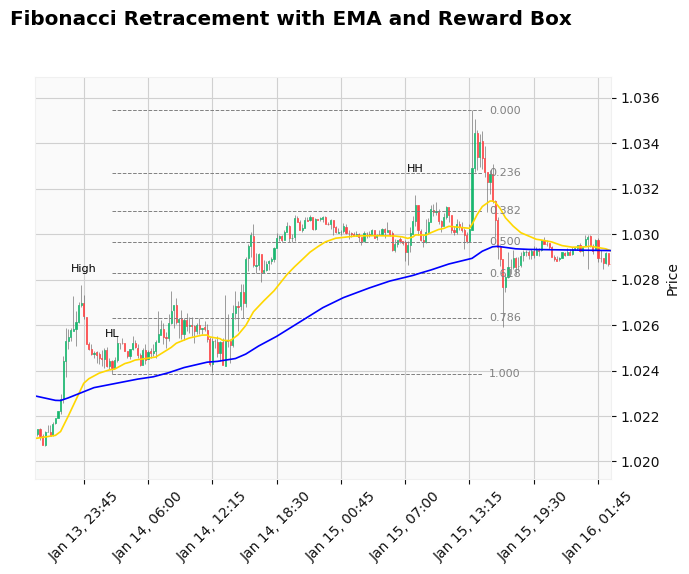

[2025-01-15 15:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


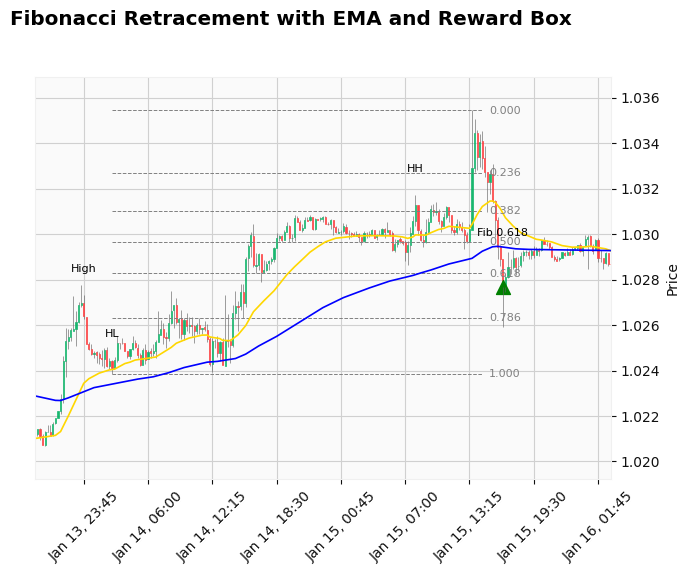

[2025-01-15 16:30:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


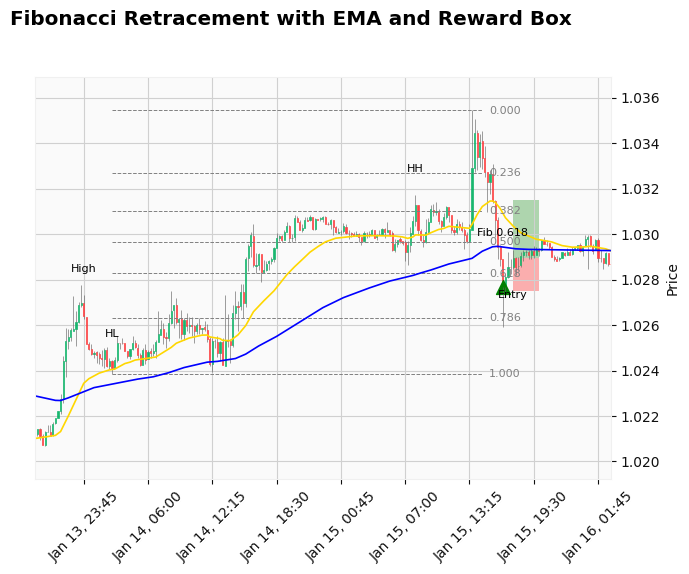

[2025-01-15 17:30:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)
self.trend_changing_idx 980
[2025-01-16 03:00:00] Trend changed from bullish to bearish during active trade.
self.trend_changing_idx 1036
[2025-01-16 17:00:00] Trend changed from bearish to bullish during active trade.


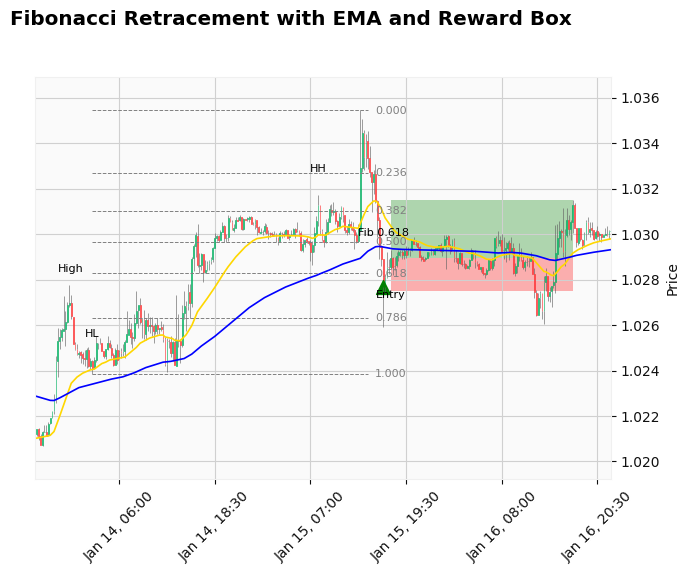

[2025-01-16 17:15:00] TAKE PROFIT triggered.
[2025-01-16 17:15:00] ENTER_MARKET completed – FSM reset (bull)
[2025-01-17 02:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 1093
[2025-01-17 07:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-01-17 08:00:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 1105
[2025-01-17 10:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-01-17 12:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 1120
[2025-01-17 14:00:00] Trend changed from bullish to bearish, FSM RESET
[2025-01-17 14:45:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 1124
[2025-01-17 15:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-01-17 16:00:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 1133
[2025-01-17 17:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-01-20 00:00:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_id

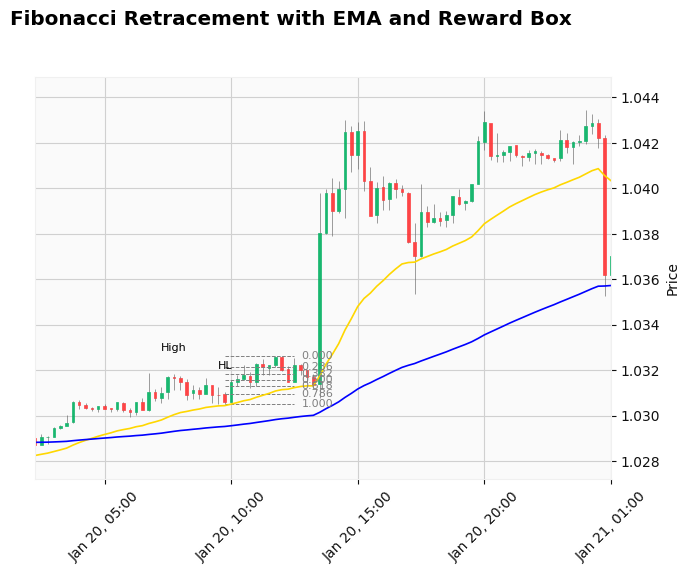

[2025-01-20 13:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


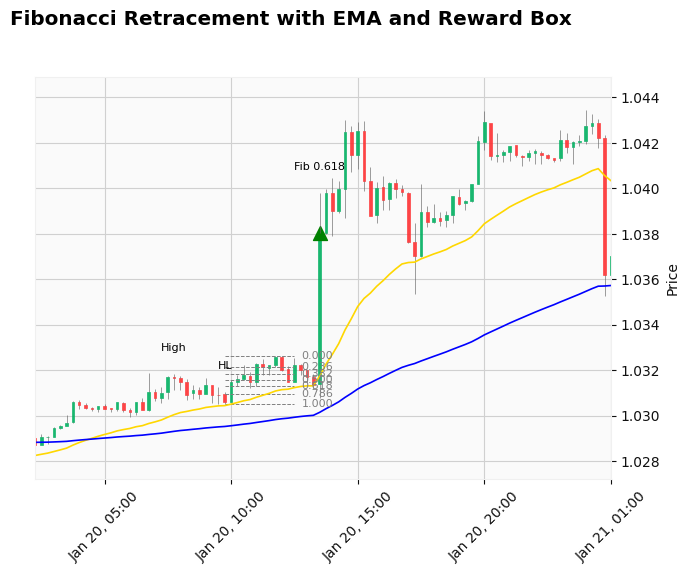

[2025-01-20 13:30:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)
[2025-01-20 13:45:00] State: ENTRY_SIGNAL → BREAK_OF_STRUCTURE (bull, Invalidated)


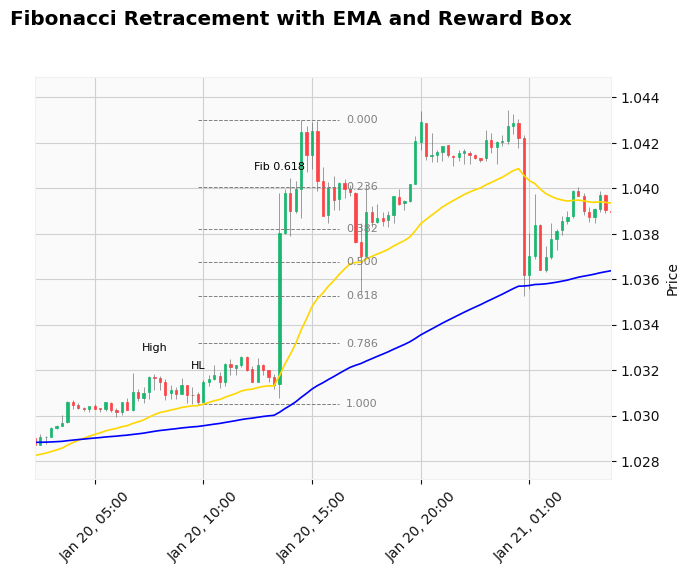

[2025-01-20 17:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


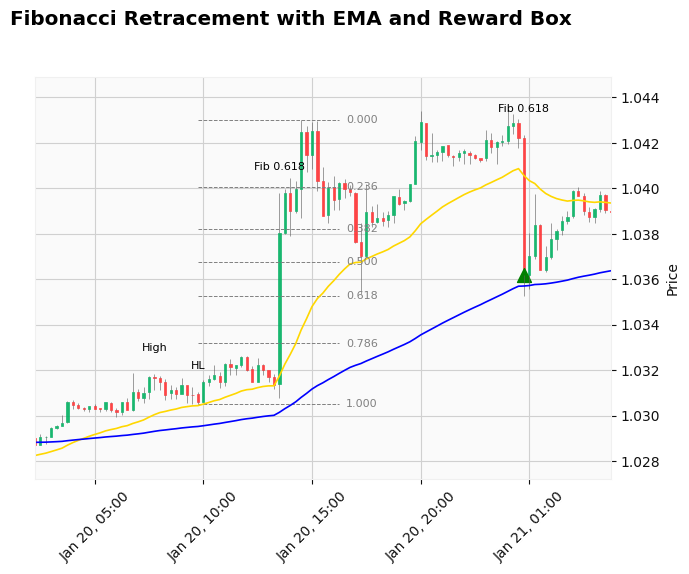

[2025-01-21 00:45:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


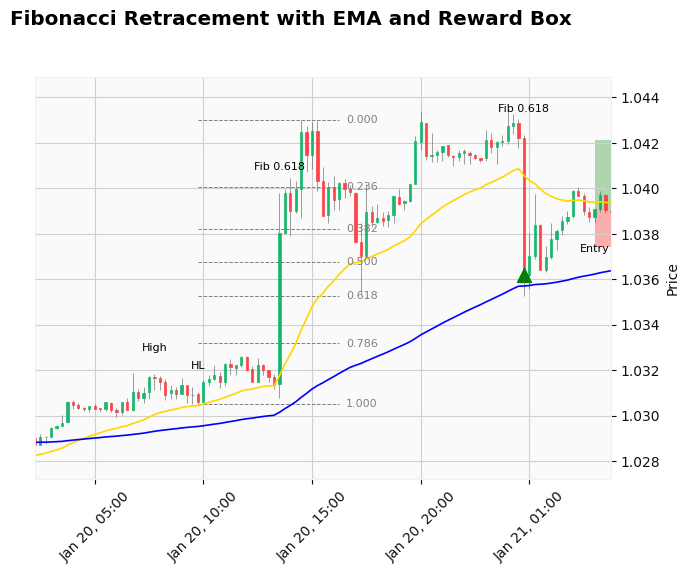

[2025-01-21 04:00:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


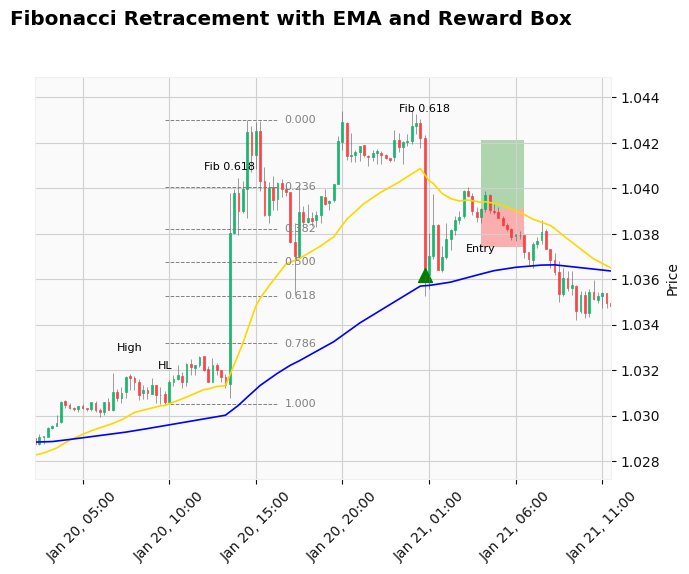

[2025-01-21 06:30:00] STOP LOSS triggered.
[2025-01-21 06:30:00] ENTER_MARKET completed – FSM reset (bull)
[2025-01-21 06:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 1304
[2025-01-21 12:00:00] Trend changed from bullish to bearish, FSM RESET
[2025-01-21 13:30:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 1311
[2025-01-21 13:45:00] Trend changed from bearish to bullish, FSM RESET
[2025-01-21 19:15:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-01-22 09:30:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


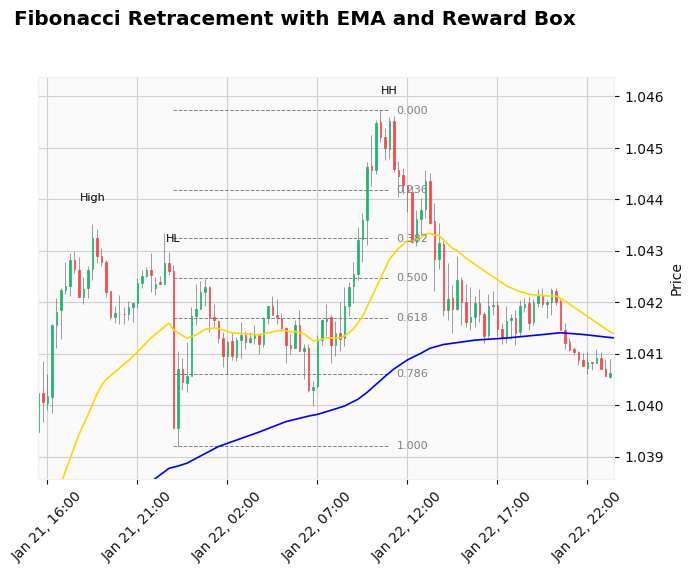

[2025-01-22 11:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


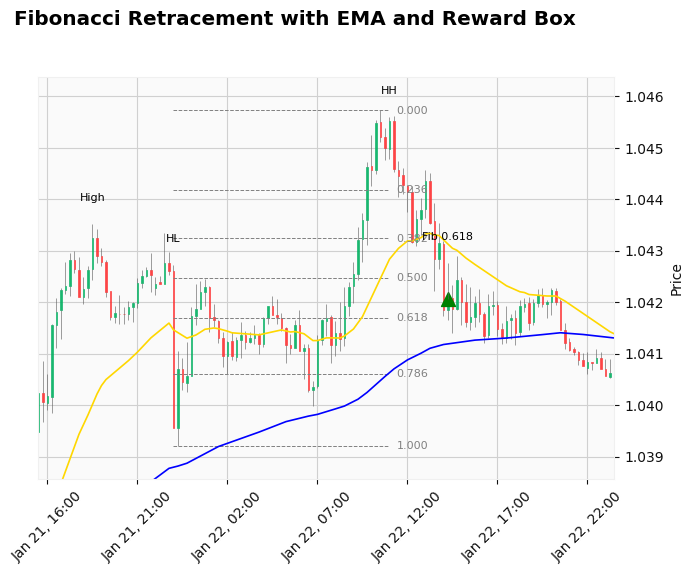

[2025-01-22 14:15:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


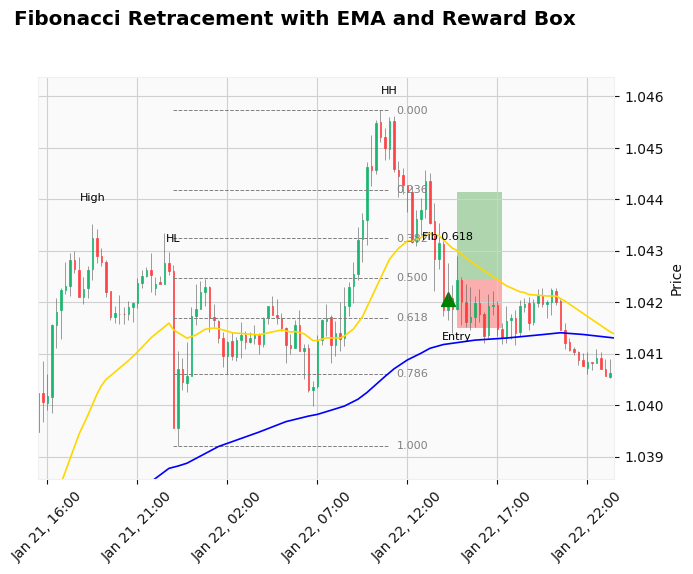

[2025-01-22 14:45:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


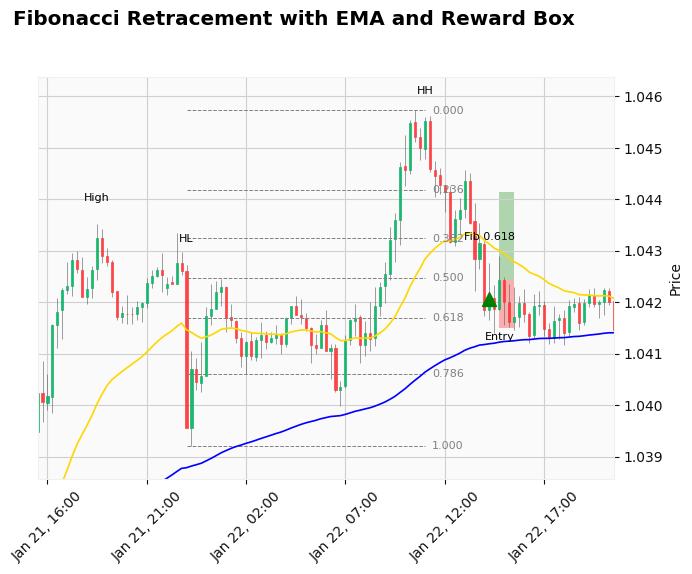

[2025-01-22 15:30:00] STOP LOSS triggered.
[2025-01-22 15:30:00] ENTER_MARKET completed – FSM reset (bull)
[2025-01-22 20:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 1450
[2025-01-23 00:30:00] Trend changed from bullish to bearish, FSM RESET
[2025-01-23 01:00:00] State changed: IDLE → PULLBACK_DETECTED
[2025-01-23 01:15:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


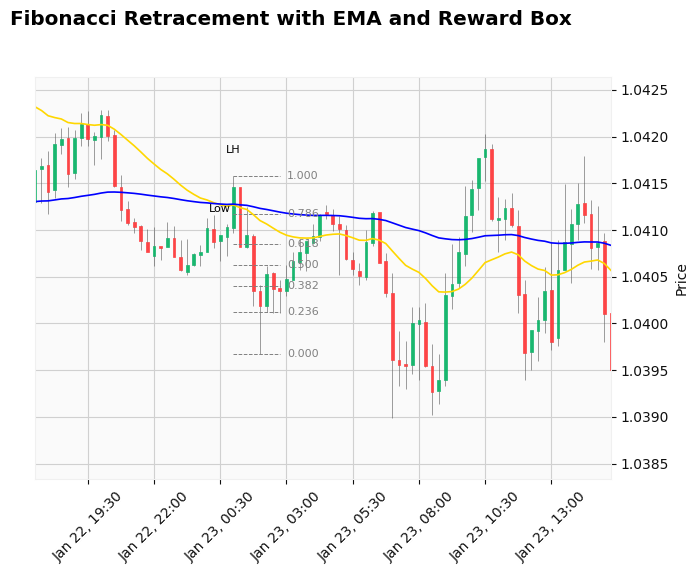

[2025-01-23 03:30:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


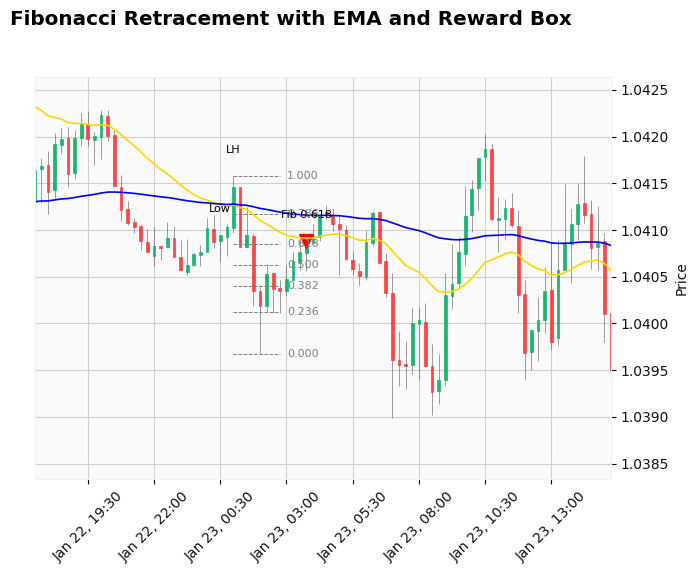

[2025-01-23 03:45:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL


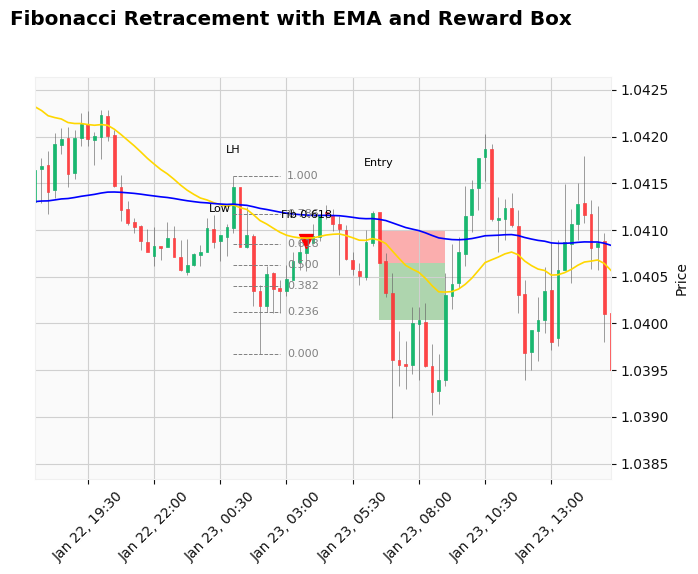

[2025-01-23 06:30:00] State changed: ENTRY_SIGNAL → ENTER_MARKET


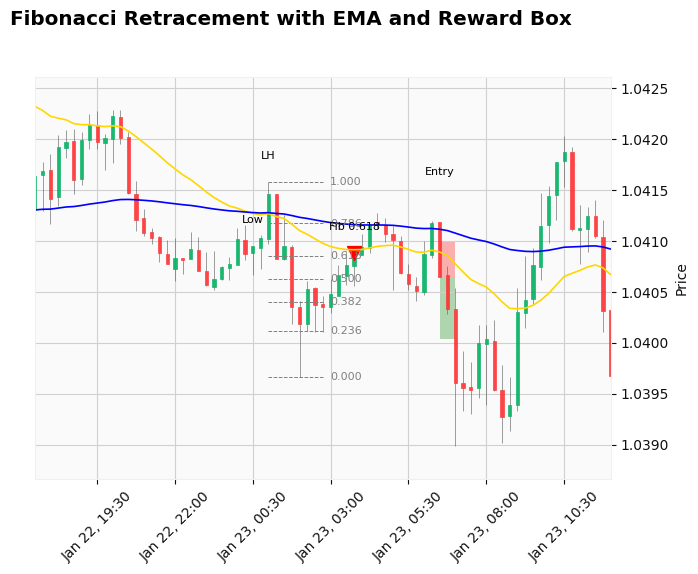

[2025-01-23 07:00:00] TAKE PROFIT triggered.
[2025-01-23 07:00:00] Exited ENTER_MARKET — resetting FSM to IDLE
[2025-01-23 09:15:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 1518
[2025-01-23 17:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-01-23 18:30:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-01-24 02:15:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


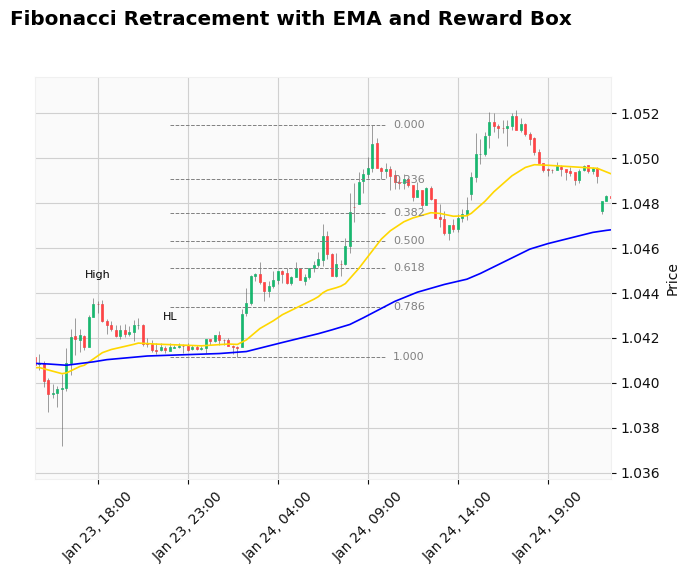

[2025-01-24 10:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-01-24 15:45:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


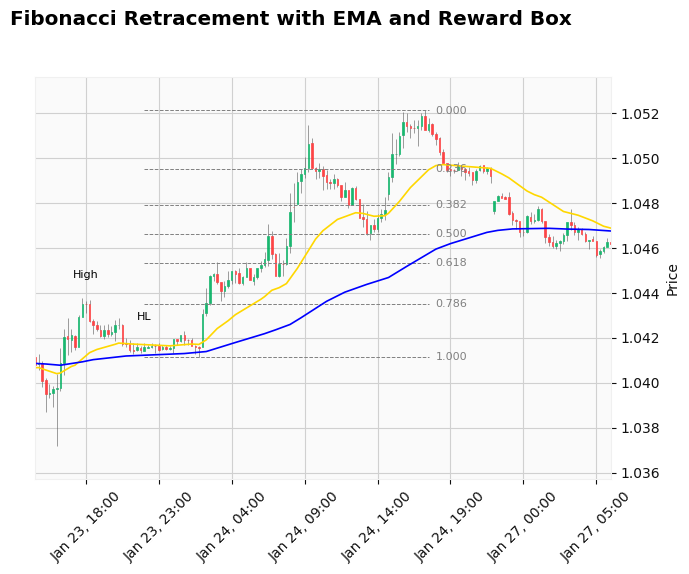

[2025-01-24 18:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
self.trend_changing_idx 1668
[2025-01-27 07:00:00] Trend changed from bullish to bearish, FSM RESET
self.trend_changing_idx 1674
[2025-01-27 08:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-01-27 14:30:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 1735
[2025-01-27 23:45:00] Trend changed from bullish to bearish, FSM RESET
[2025-01-28 00:30:00] State changed: IDLE → PULLBACK_DETECTED
[2025-01-28 02:00:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


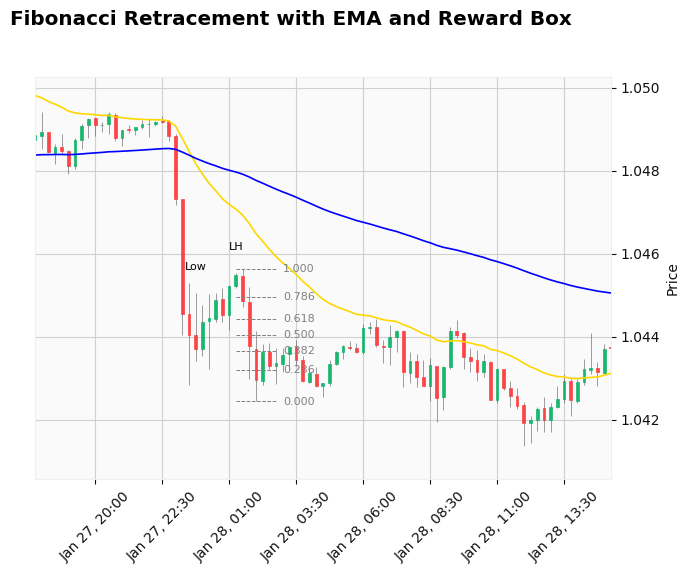

[2025-01-28 03:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


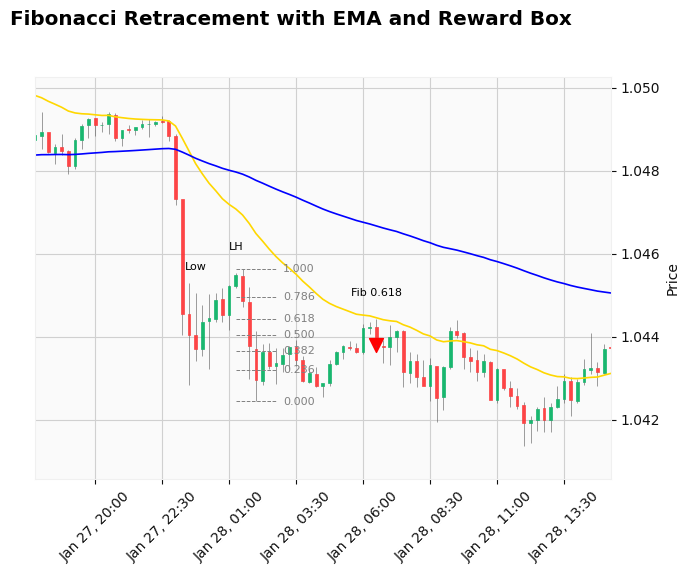

[2025-01-28 06:30:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL


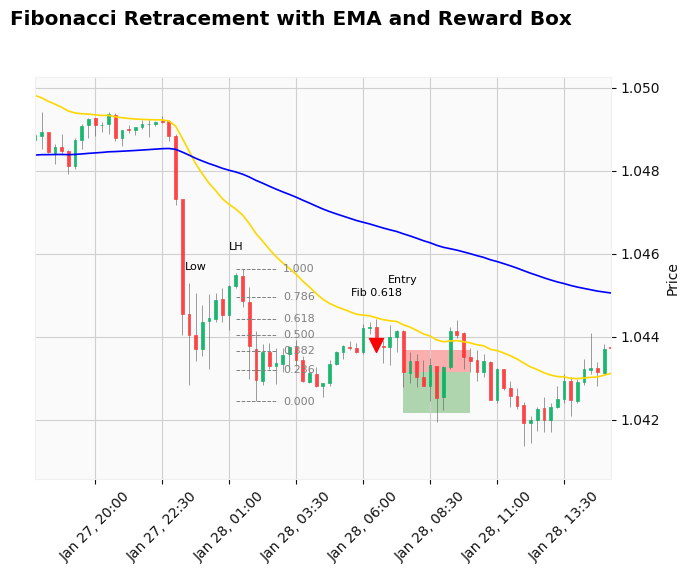

[2025-01-28 07:30:00] State changed: ENTRY_SIGNAL → ENTER_MARKET


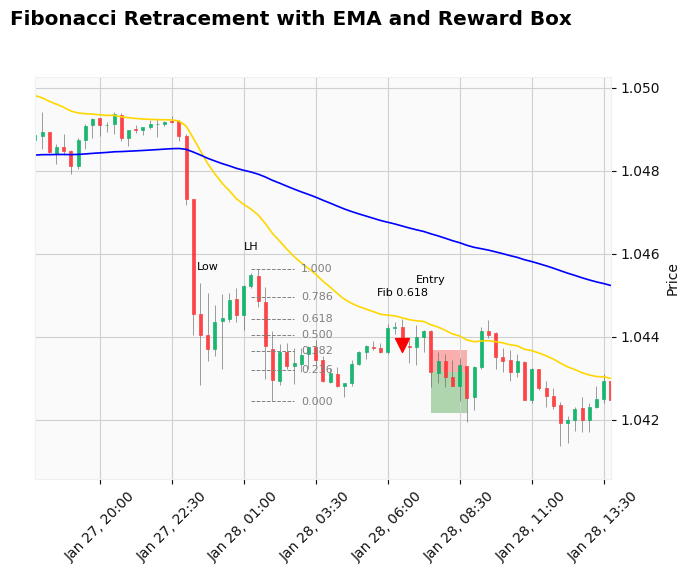

[2025-01-28 08:45:00] TAKE PROFIT triggered.
[2025-01-28 08:45:00] Exited ENTER_MARKET — resetting FSM to IDLE
[2025-01-28 13:30:00] State changed: IDLE → PULLBACK_DETECTED
[2025-01-29 07:30:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


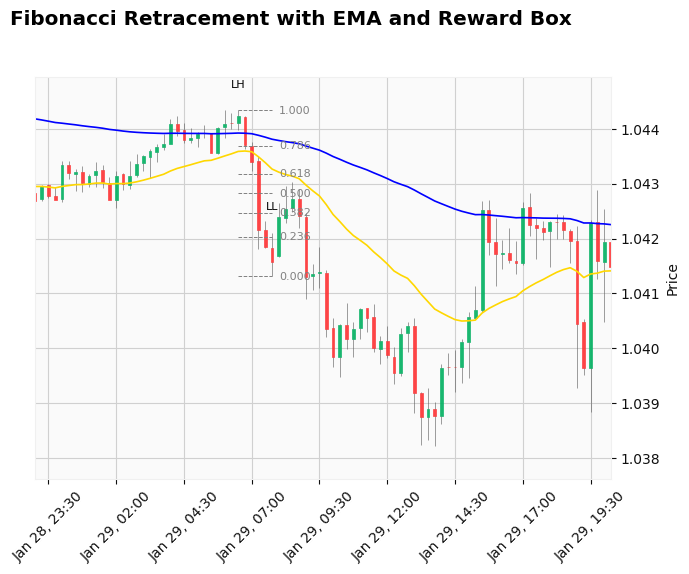

[2025-01-29 08:30:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-01-29 09:00:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


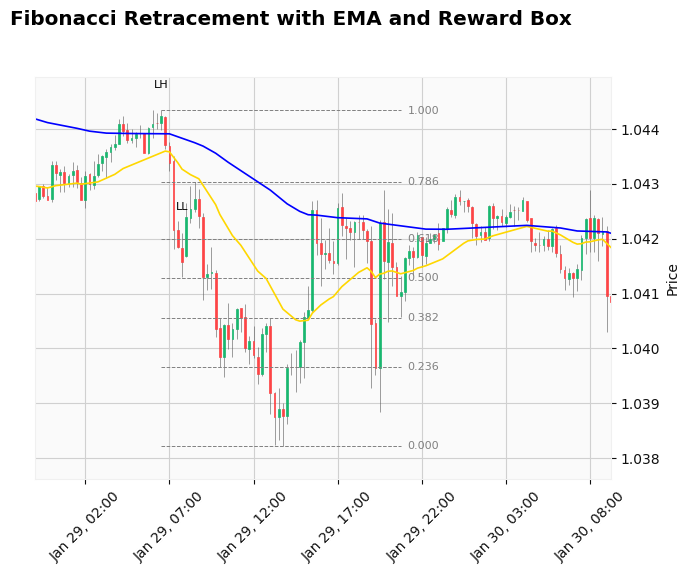

[2025-01-29 21:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


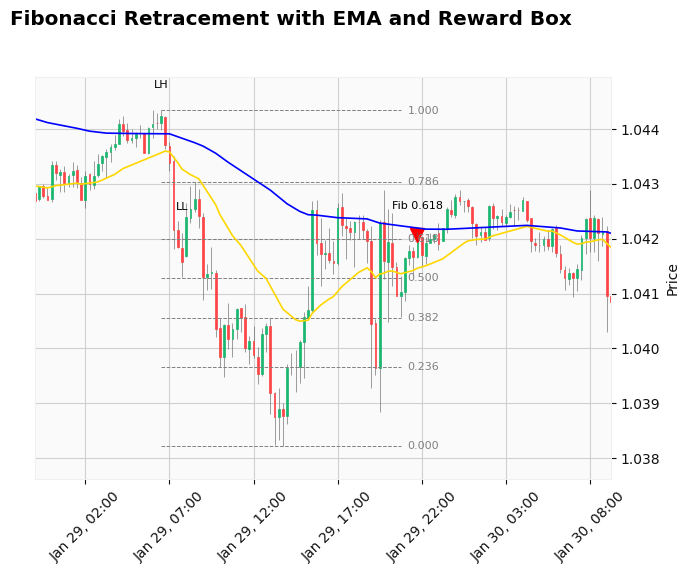

[2025-01-29 21:45:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL


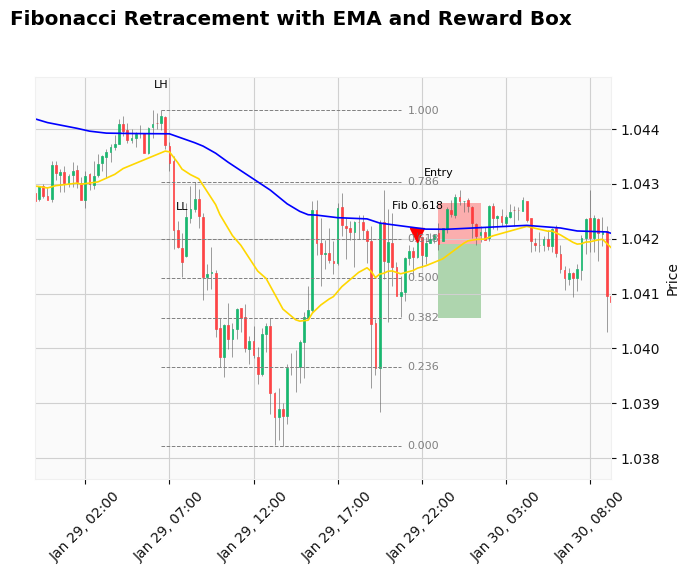

[2025-01-29 23:00:00] State changed: ENTRY_SIGNAL → ENTER_MARKET


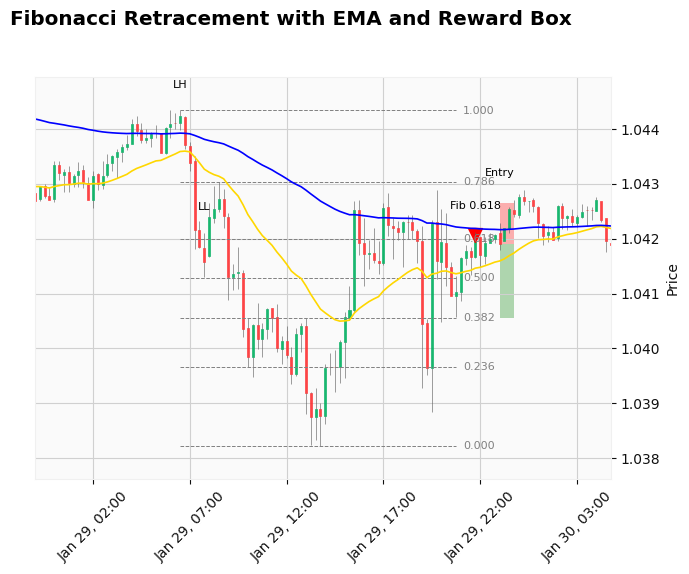

[2025-01-29 23:45:00] STOP LOSS triggered.
[2025-01-29 23:45:00] Exited ENTER_MARKET — resetting FSM to IDLE
[2025-01-30 07:45:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 1990
[2025-01-30 15:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-01-30 16:15:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 2012
[2025-01-30 21:00:00] Trend changed from bullish to bearish, FSM RESET
[2025-01-30 23:45:00] State changed: IDLE → PULLBACK_DETECTED
[2025-01-31 01:15:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


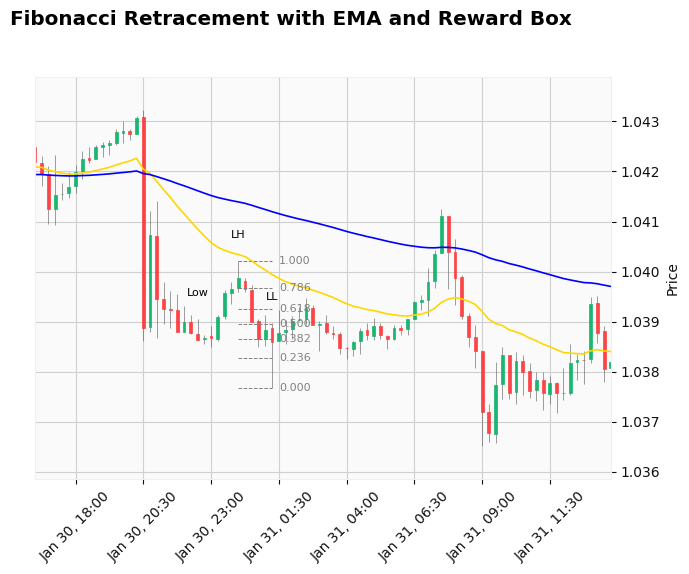

[2025-01-31 02:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


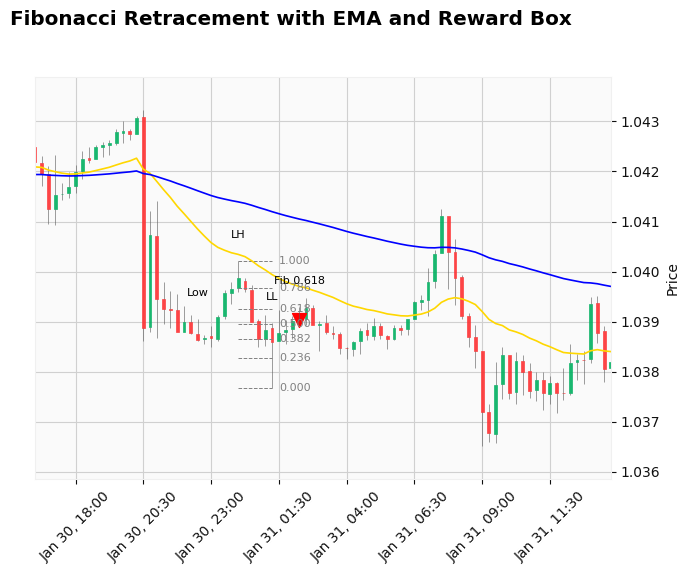

[2025-01-31 02:15:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL


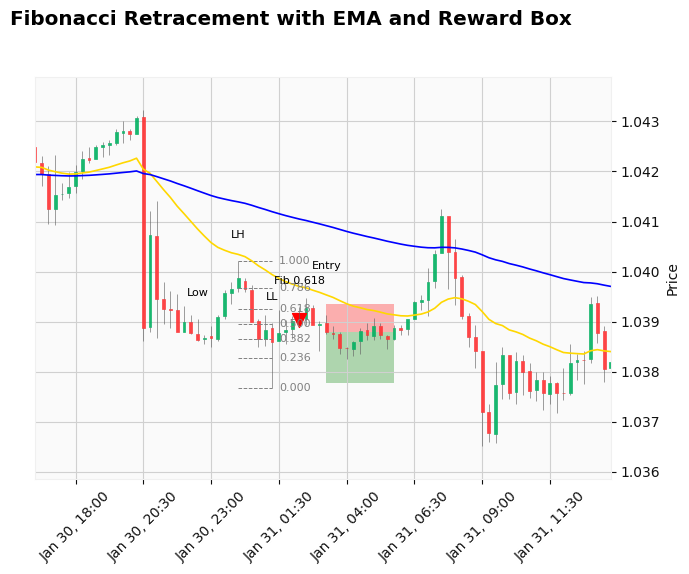

[2025-01-31 03:15:00] State changed: ENTRY_SIGNAL → ENTER_MARKET


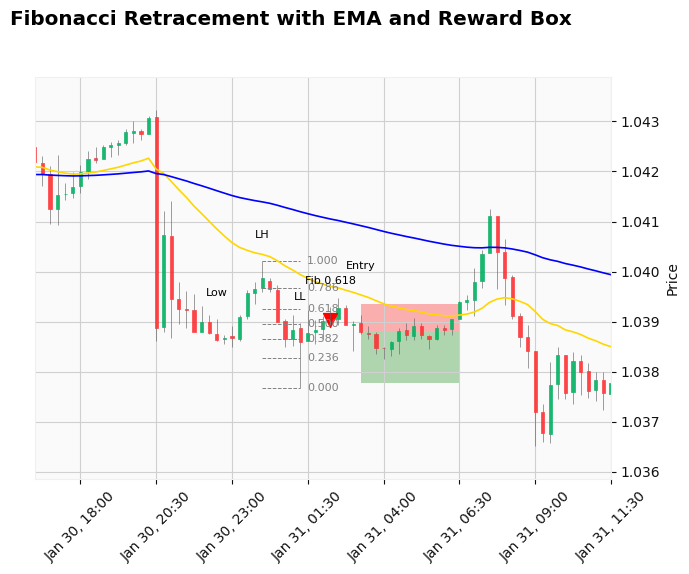

[2025-01-31 06:30:00] STOP LOSS triggered.
[2025-01-31 06:30:00] Exited ENTER_MARKET — resetting FSM to IDLE
[2025-01-31 06:45:00] State changed: IDLE → PULLBACK_DETECTED
[2025-01-31 08:45:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


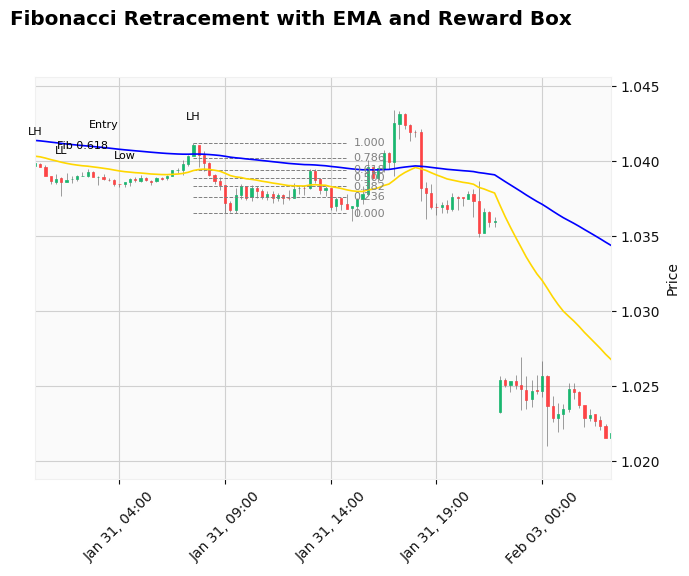

[2025-01-31 15:30:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


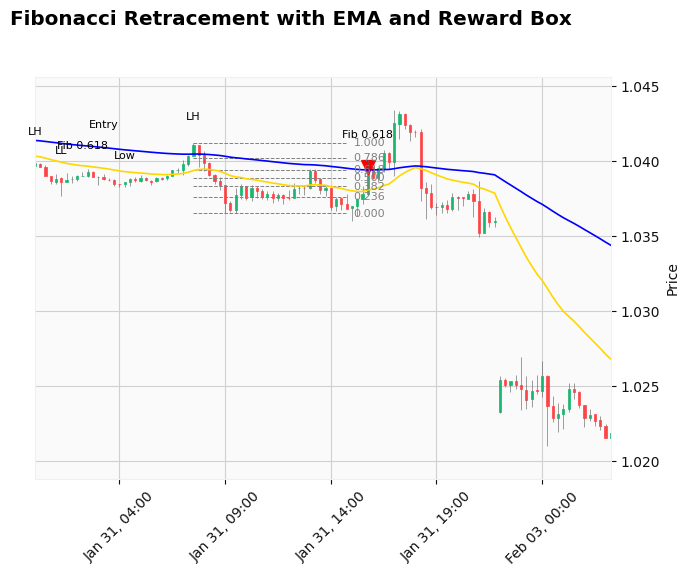

[2025-01-31 15:45:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-01-31 17:00:00] State changed: ENTRY_SIGNAL → PULLBACK_DETECTED (Invalidated)
[2025-01-31 19:30:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


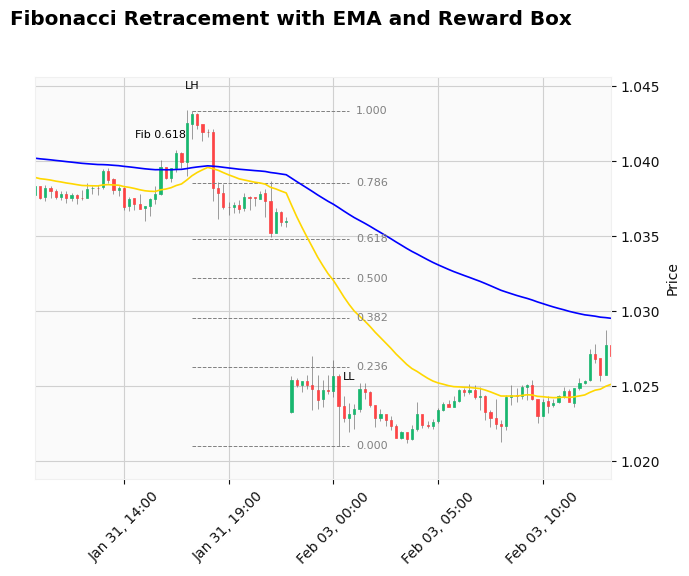

[2025-02-03 01:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


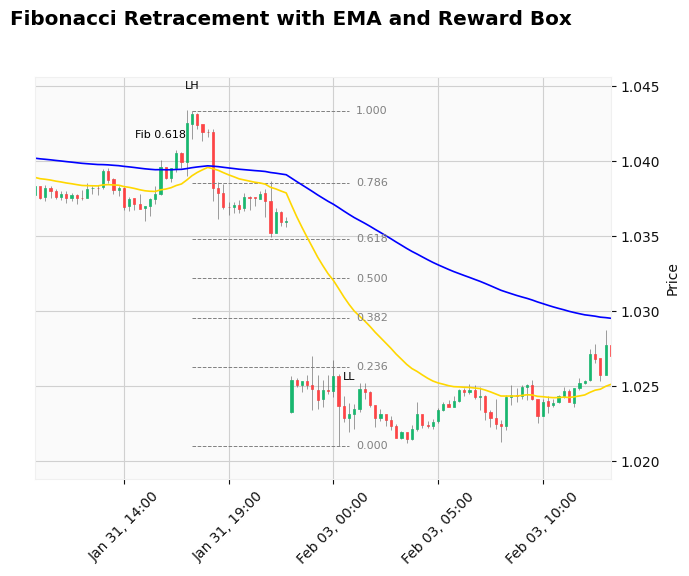

[2025-02-03 21:30:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
self.trend_changing_idx 2208
[2025-02-03 22:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-02-03 23:45:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-02-04 09:15:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


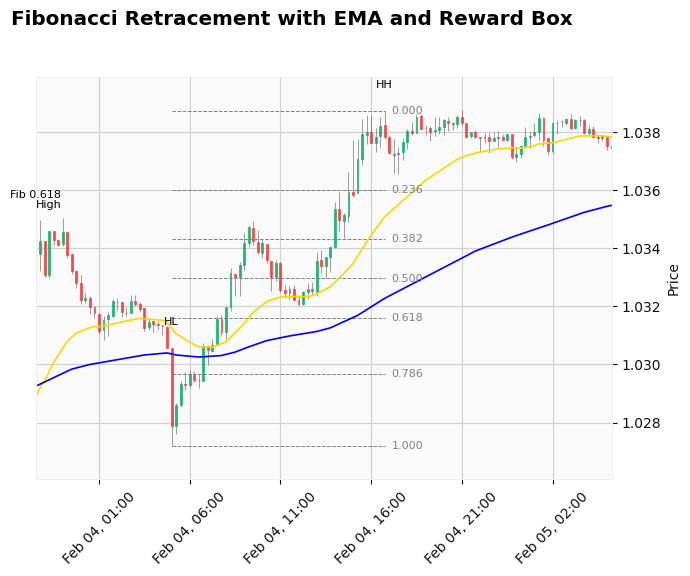

[2025-02-04 17:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-02-05 06:15:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


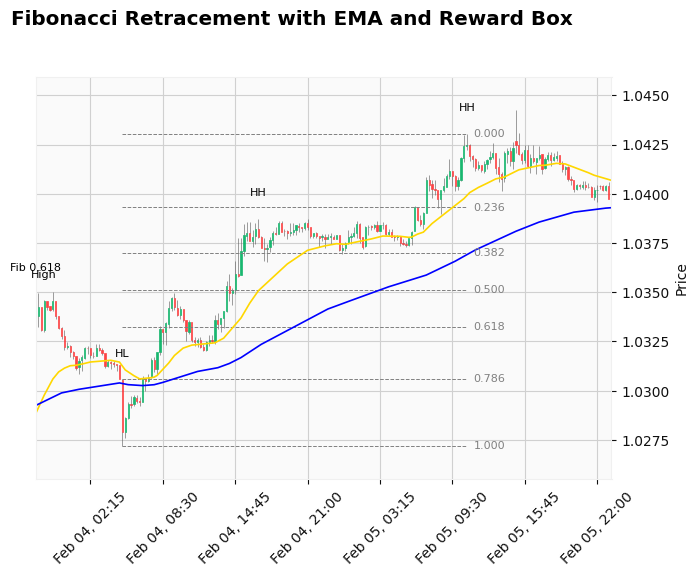

[2025-02-05 11:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
self.trend_changing_idx 2437
[2025-02-06 07:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-02-06 14:30:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 2500
[2025-02-06 23:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-02-07 00:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 2509
[2025-02-07 01:15:00] Trend changed from bullish to bearish, FSM RESET
self.trend_changing_idx 2512
[2025-02-07 02:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-02-07 03:30:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 2520
[2025-02-07 04:00:00] Trend changed from bullish to bearish, FSM RESET
[2025-02-07 04:45:00] State changed: IDLE → PULLBACK_DETECTED
[2025-02-07 05:30:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE
[2025-02-07 07:15:00] State changed: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (Invalidated)
self.trend_changi

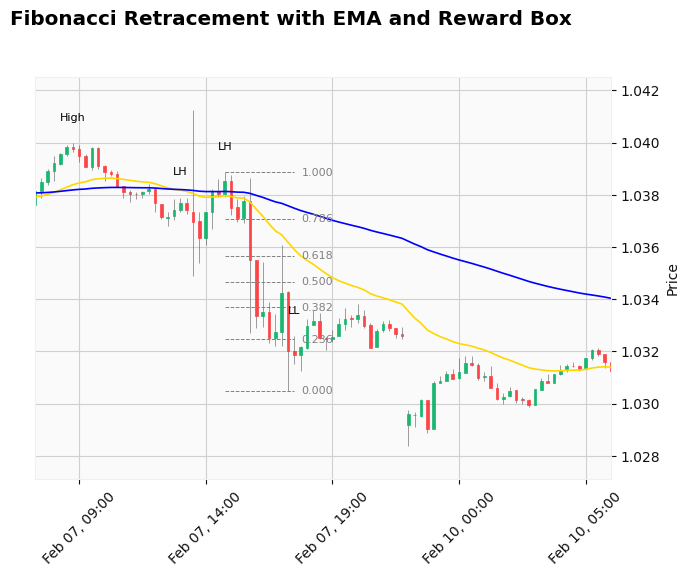

[2025-02-07 18:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-02-09 22:00:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


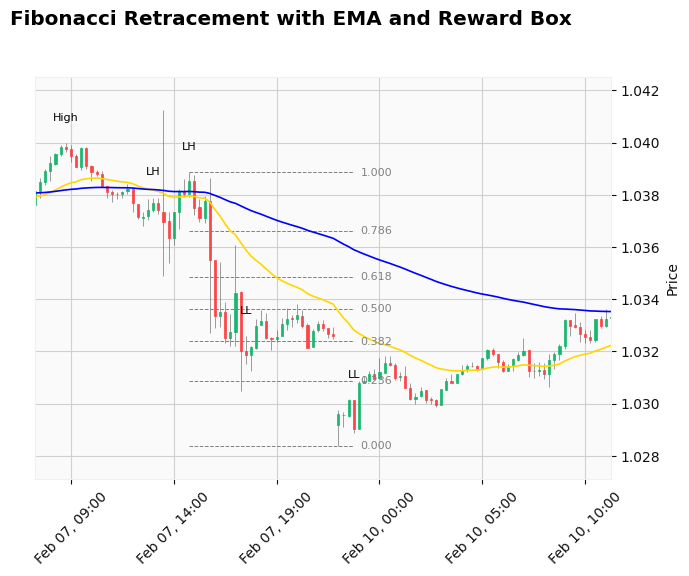

[2025-02-09 23:30:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
self.trend_changing_idx 2746
[2025-02-11 12:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-02-11 17:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-02-11 19:30:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


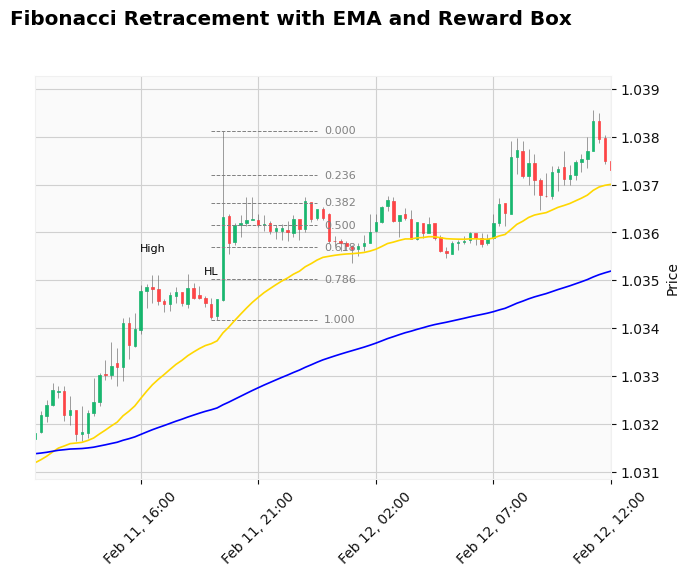

[2025-02-12 00:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


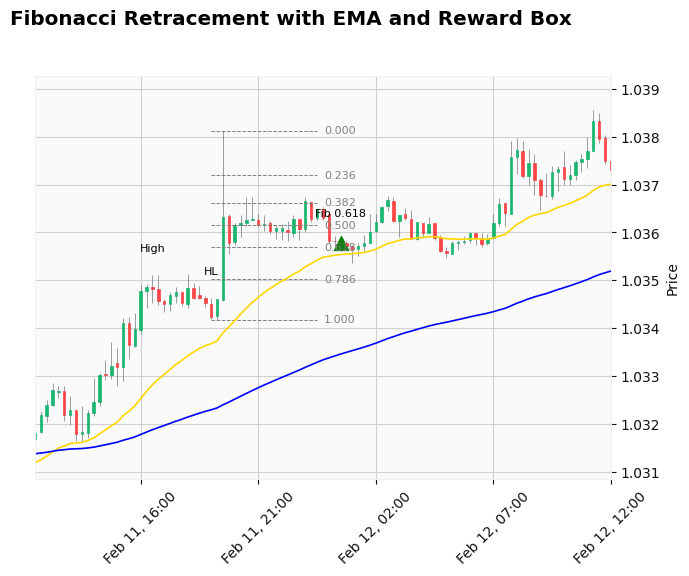

[2025-02-12 00:30:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


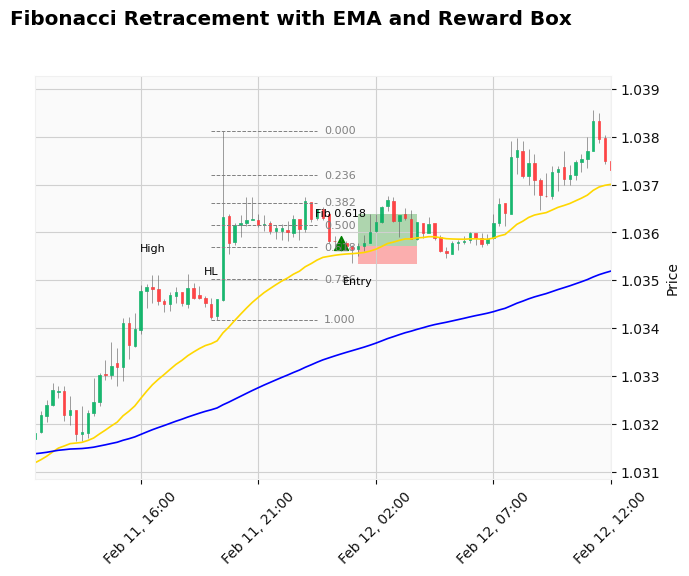

[2025-02-12 01:15:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


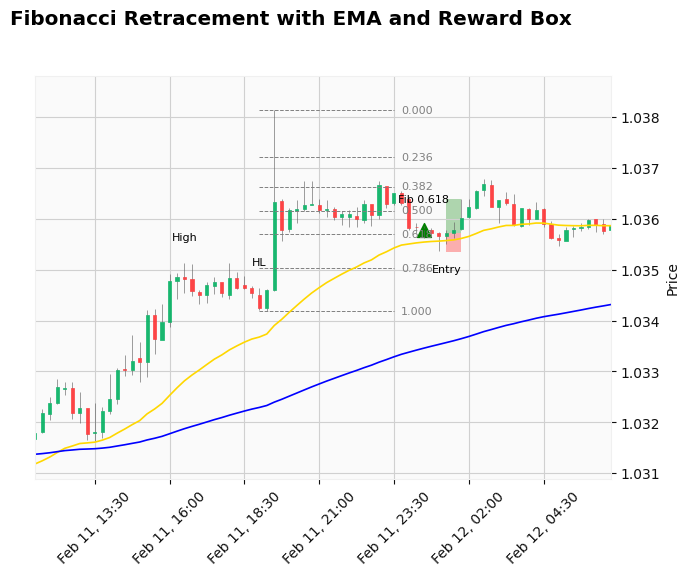

[2025-02-12 01:45:00] TAKE PROFIT triggered.
[2025-02-12 01:45:00] ENTER_MARKET completed – FSM reset (bull)
[2025-02-12 05:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-02-12 07:45:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


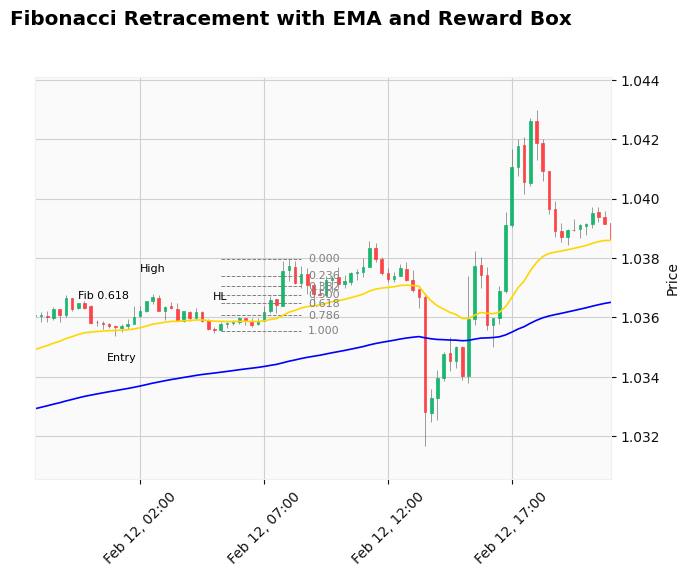

[2025-02-12 09:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-02-12 11:15:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


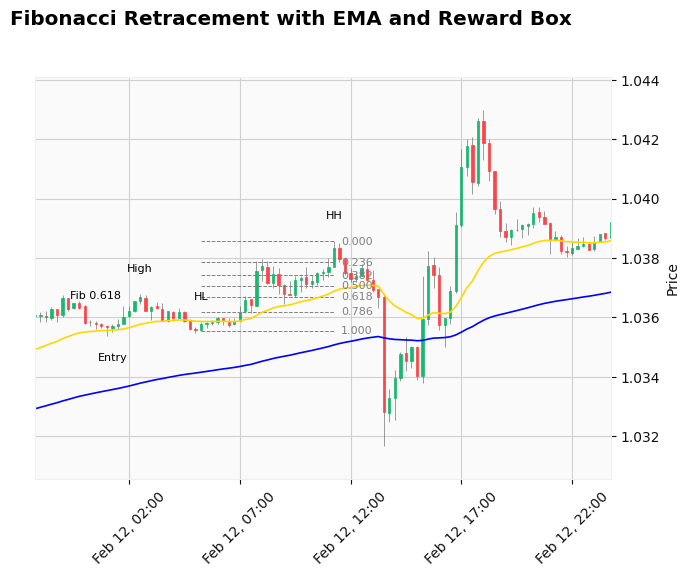

[2025-02-12 12:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


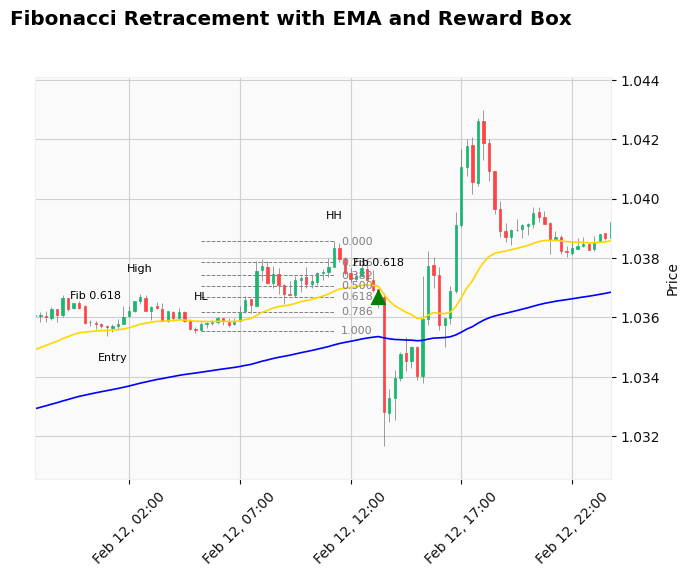

[2025-02-12 13:15:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)
[2025-02-12 13:30:00] State: ENTRY_SIGNAL → PULLBACK_DETECTED (bull, Invalidated)
[2025-02-12 16:45:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


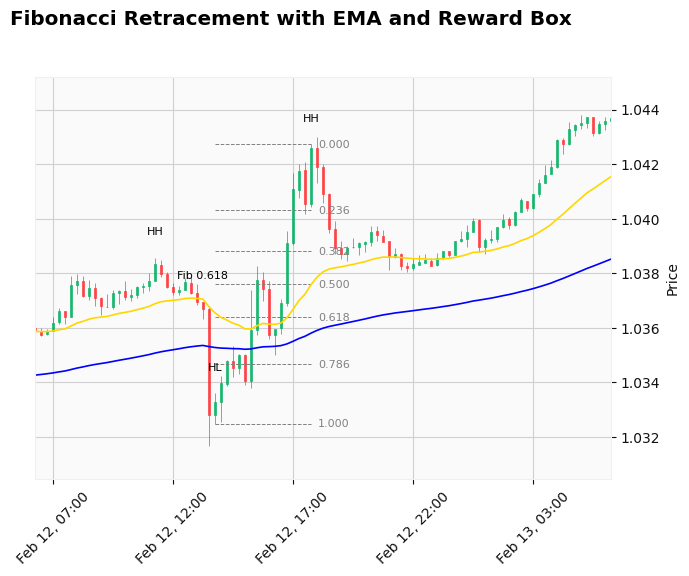

[2025-02-12 18:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-02-13 04:00:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


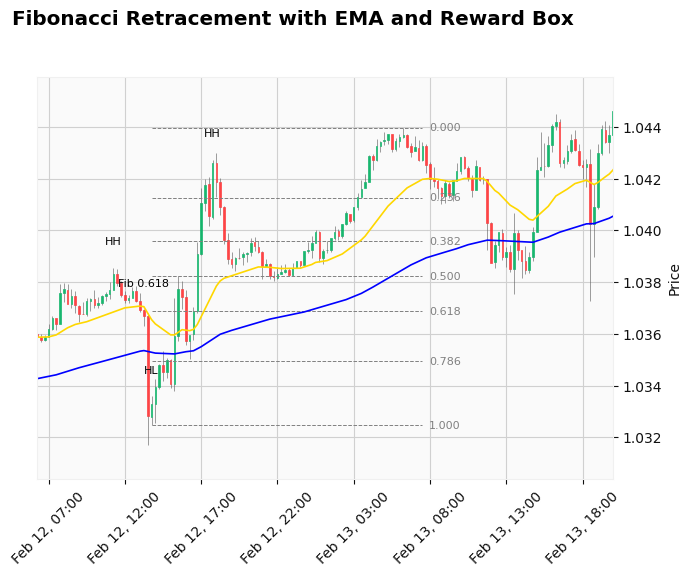

[2025-02-13 08:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-02-13 16:00:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


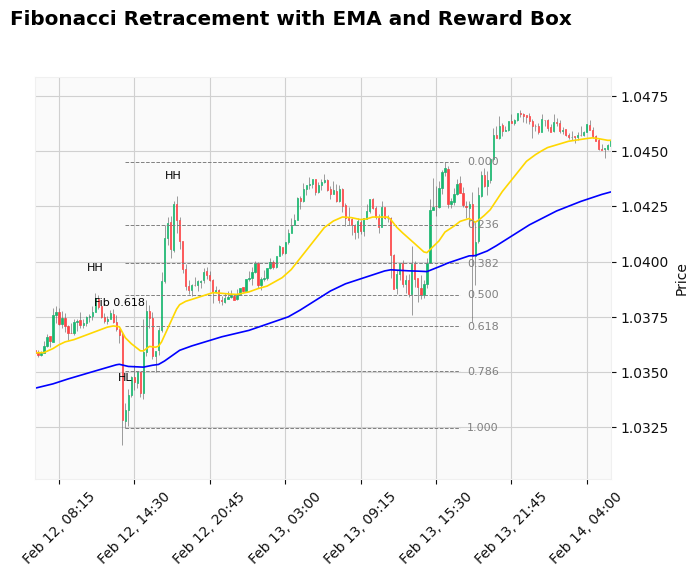

[2025-02-13 18:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-02-13 20:00:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


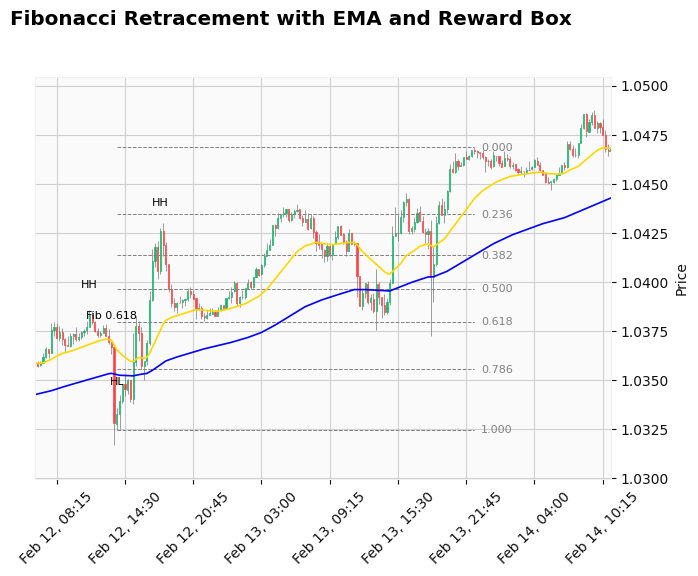

[2025-02-13 23:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-02-14 07:00:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


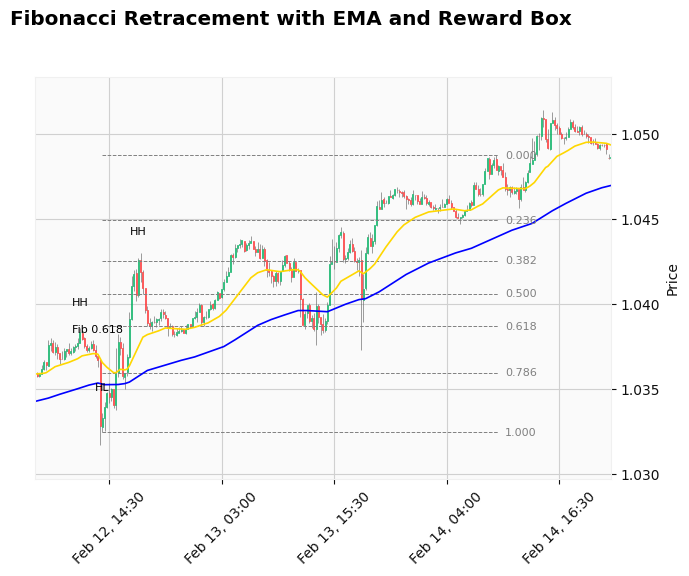

[2025-02-14 10:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-02-14 13:45:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


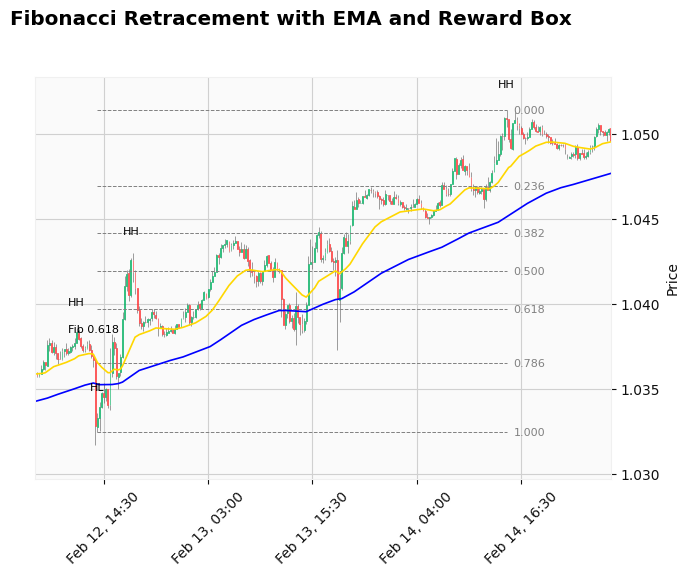

[2025-02-14 15:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
self.trend_changing_idx 3136
[2025-02-17 14:00:00] Trend changed from bullish to bearish, FSM RESET
[2025-02-17 15:00:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 3149
[2025-02-17 17:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-02-18 00:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 3181
[2025-02-18 01:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-02-18 06:15:00] State changed: IDLE → PULLBACK_DETECTED
[2025-02-18 13:00:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


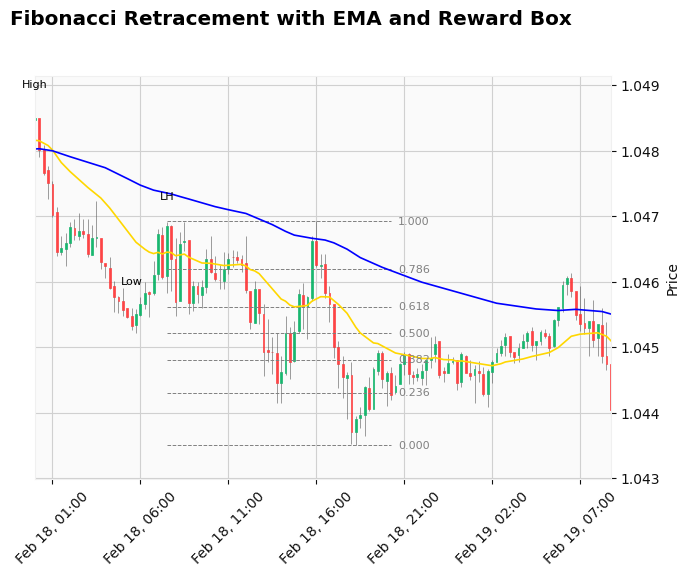

[2025-02-18 21:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


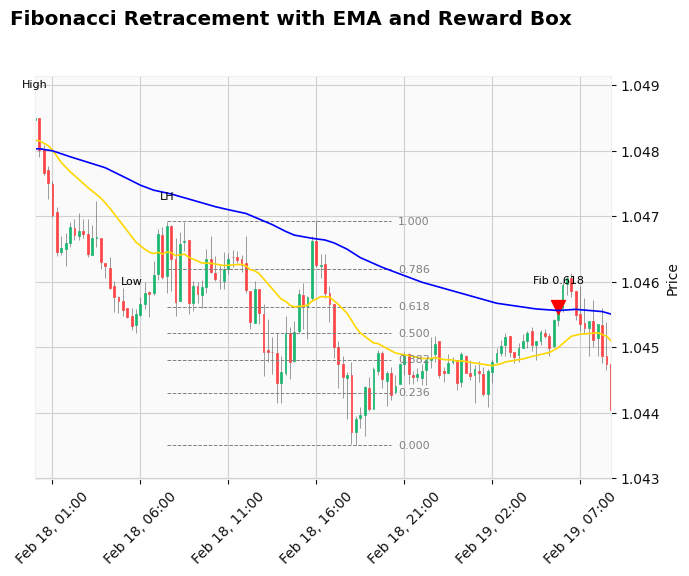

[2025-02-19 05:45:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-02-19 09:30:00] State changed: ENTRY_SIGNAL → BREAK_OF_STRUCTURE (Invalidated)


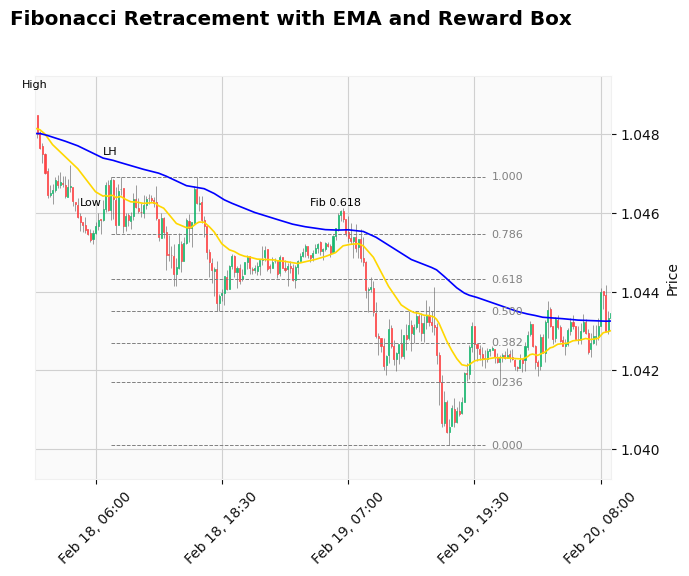

[2025-02-19 21:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
self.trend_changing_idx 3411
[2025-02-20 10:45:00] Trend changed from bearish to bullish, FSM RESET
[2025-02-20 22:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-02-20 23:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)
[2025-02-21 00:15:00] State: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (bull, Invalidated)
self.trend_changing_idx 3525
[2025-02-21 15:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-02-21 17:45:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 3561
[2025-02-24 00:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-02-24 03:15:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 3609
[2025-02-24 12:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-02-24 13:15:00] State changed: IDLE → PULLBACK_DETECTED
[2025-02-24 14:30:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE
[2025-02-24 16:30:00] State changed: BREAK_

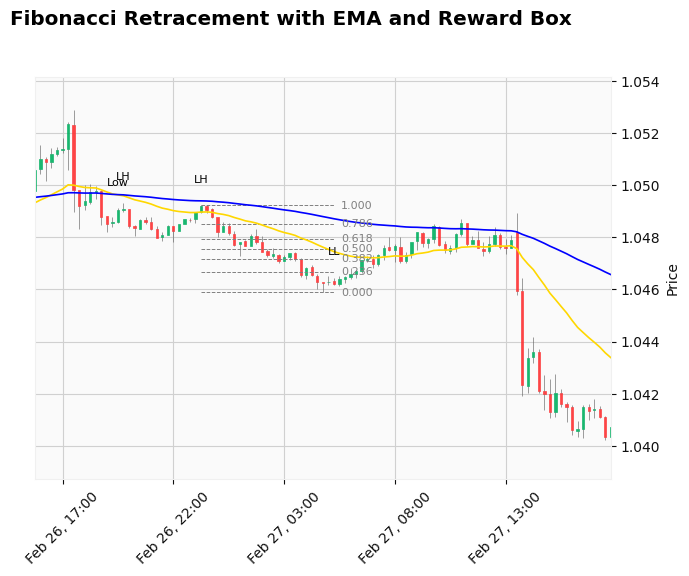

[2025-02-27 06:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


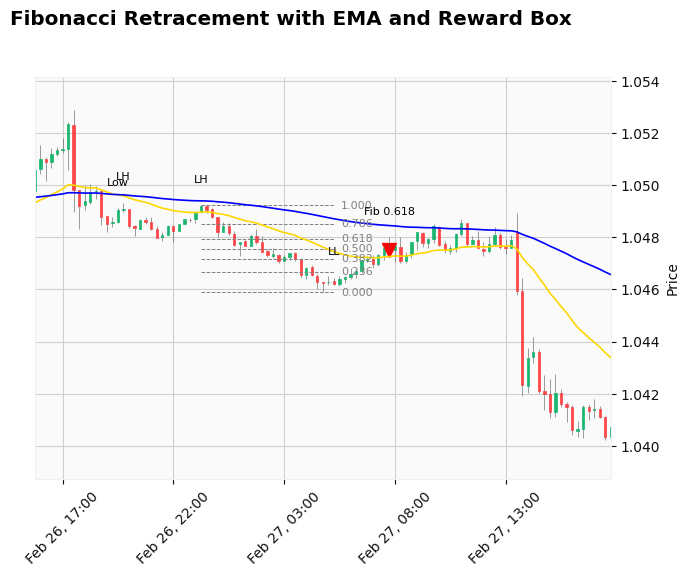

[2025-02-27 07:45:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL


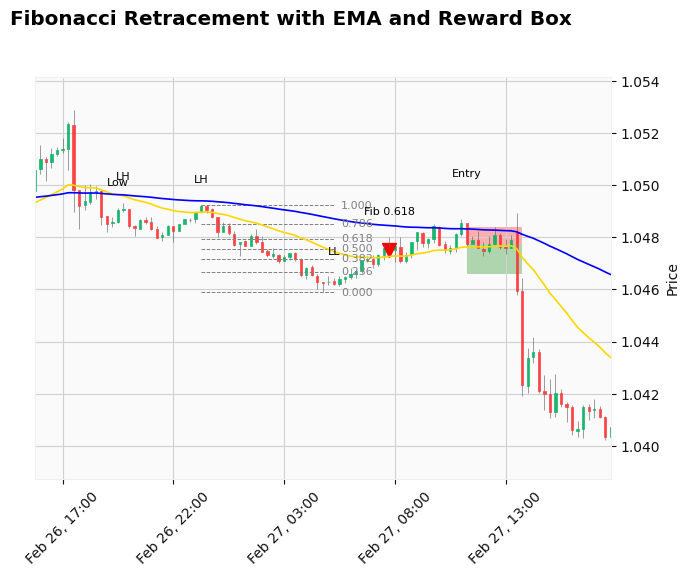

[2025-02-27 11:15:00] State changed: ENTRY_SIGNAL → ENTER_MARKET


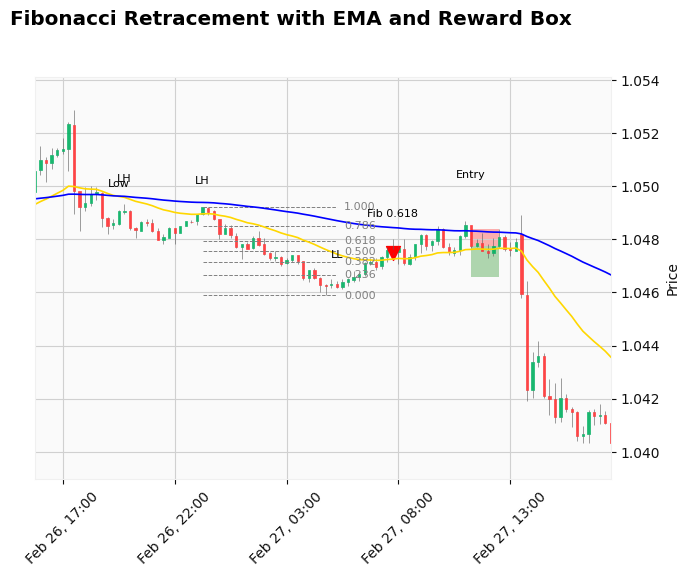

[2025-02-27 12:30:00] STOP LOSS triggered.
[2025-02-27 12:30:00] Exited ENTER_MARKET — resetting FSM to IDLE
[2025-02-27 18:15:00] State changed: IDLE → PULLBACK_DETECTED
[2025-02-27 20:15:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


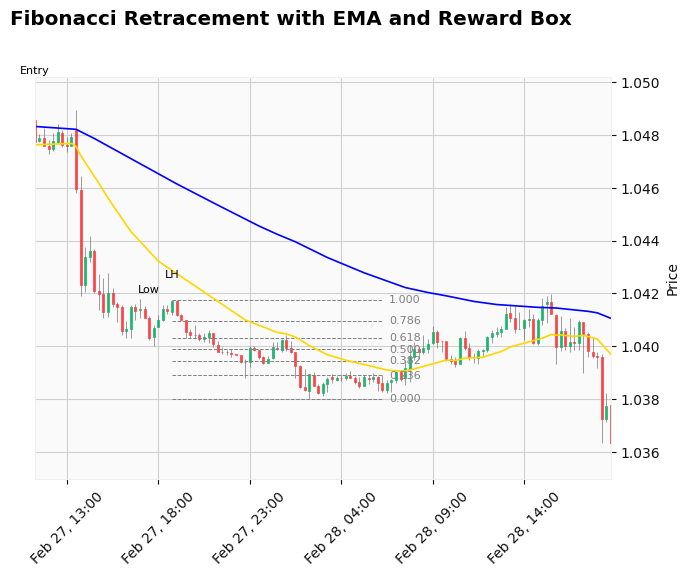

[2025-02-28 07:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


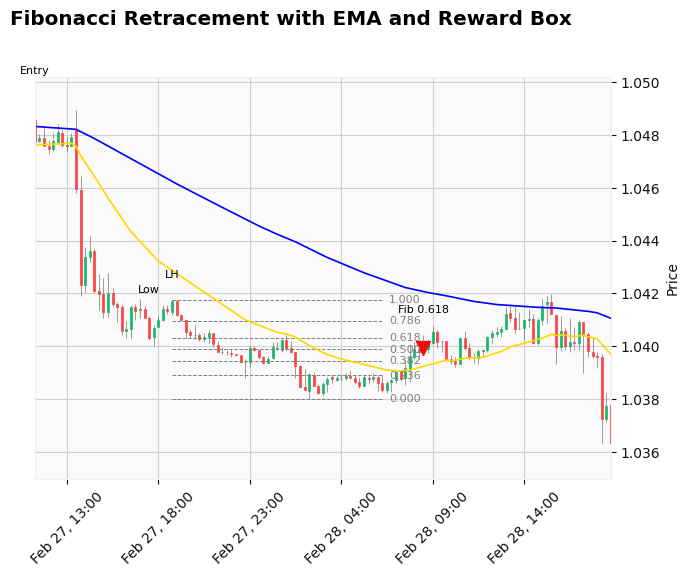

[2025-02-28 08:30:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL


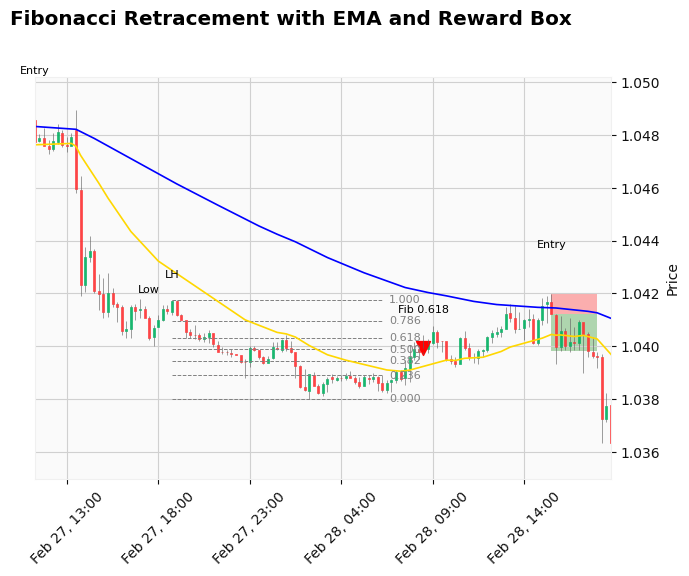

[2025-02-28 15:30:00] State changed: ENTRY_SIGNAL → ENTER_MARKET


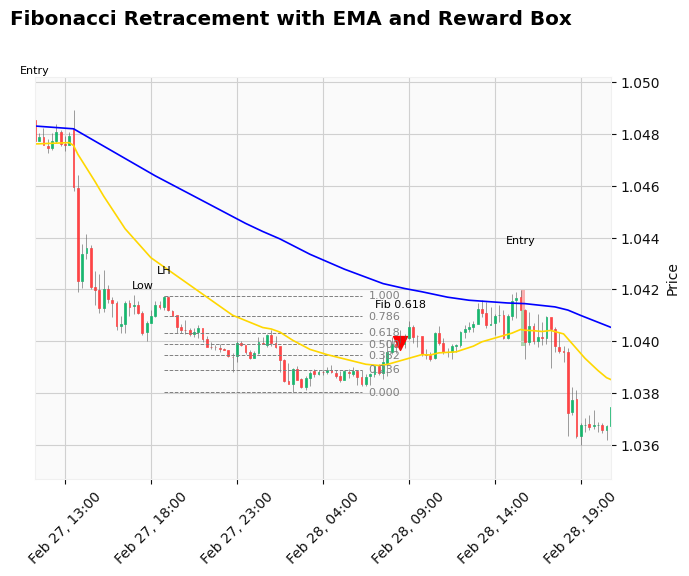

[2025-02-28 15:45:00] TAKE PROFIT triggered.
[2025-02-28 15:45:00] Exited ENTER_MARKET — resetting FSM to IDLE
self.trend_changing_idx 4051
[2025-03-03 02:45:00] Trend changed from bearish to bullish, FSM RESET
[2025-03-03 05:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-03-03 09:45:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


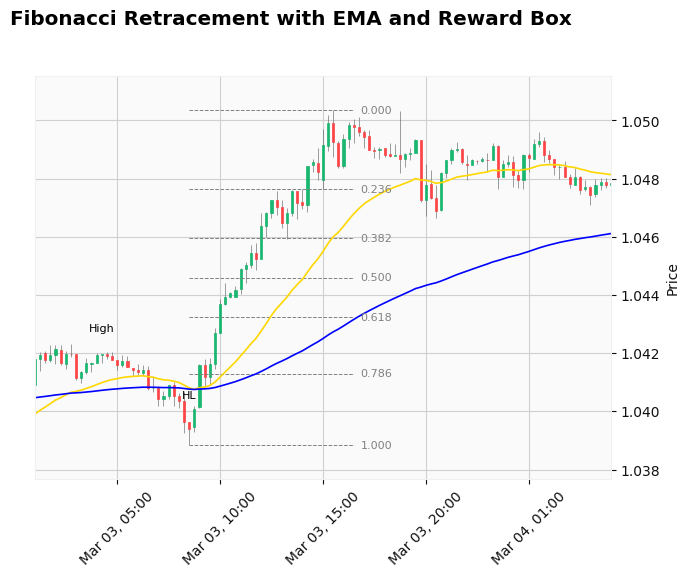

[2025-03-03 17:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-03-04 08:15:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


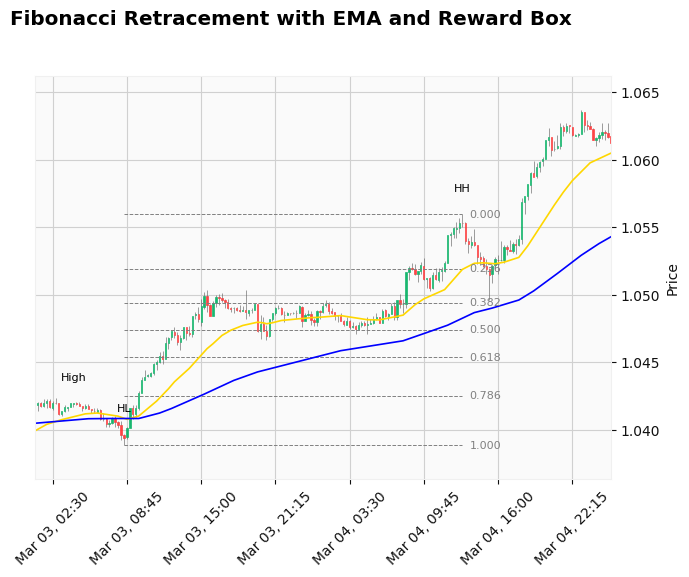

[2025-03-04 13:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-03-04 18:00:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


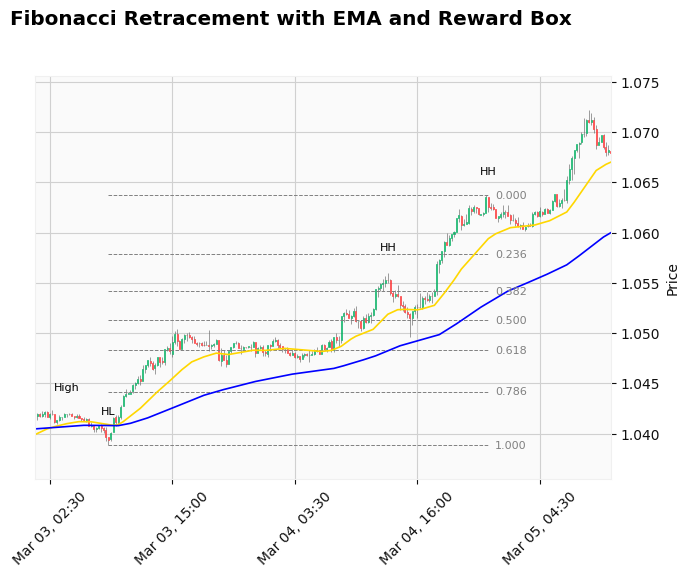

[2025-03-05 00:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-03-05 06:00:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


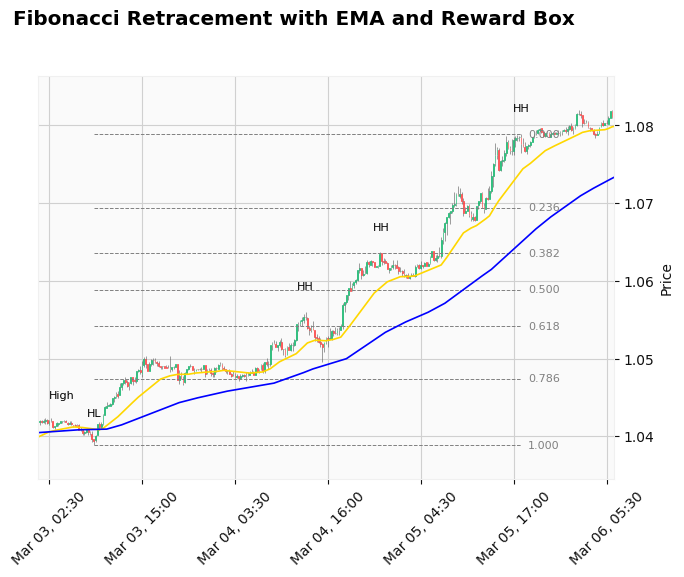

[2025-03-05 18:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-03-05 19:45:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


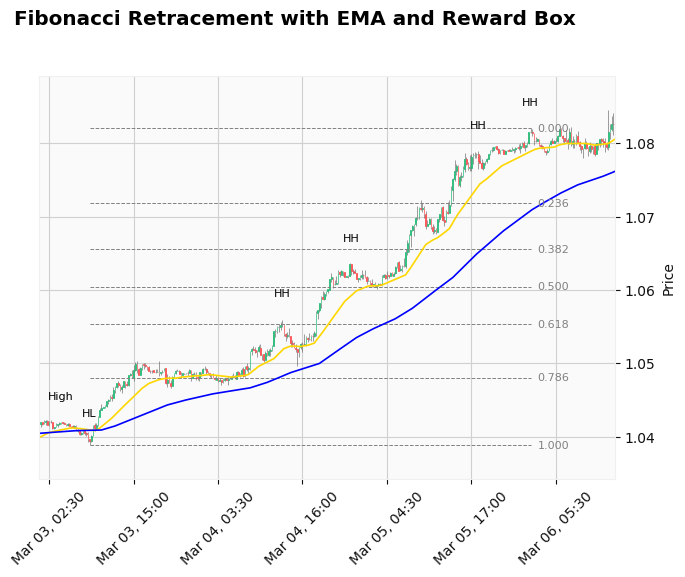

[2025-03-06 02:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-03-06 13:45:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


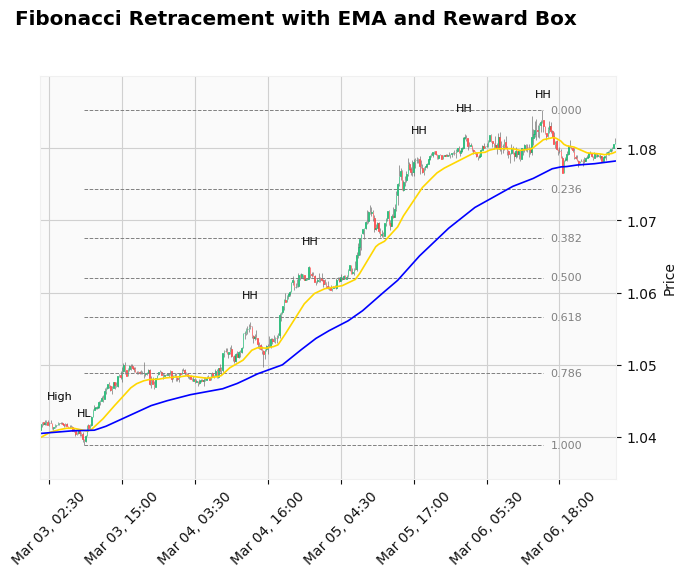

[2025-03-06 15:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-03-07 09:00:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


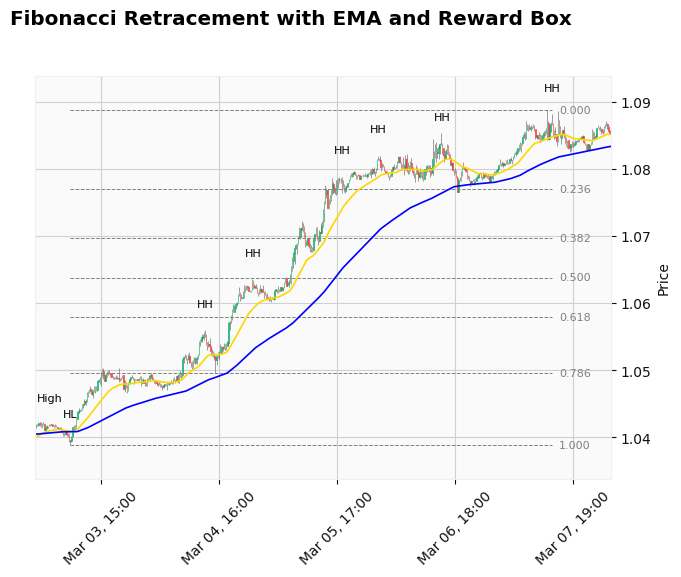

[2025-03-07 15:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
self.trend_changing_idx 4559
[2025-03-10 08:45:00] Trend changed from bullish to bearish, FSM RESET
[2025-03-10 09:30:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 4563
[2025-03-10 09:45:00] Trend changed from bearish to bullish, FSM RESET
[2025-03-10 13:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 4597
[2025-03-10 18:15:00] Trend changed from bullish to bearish, FSM RESET
self.trend_changing_idx 4620
[2025-03-11 00:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-03-11 05:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-03-11 06:15:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


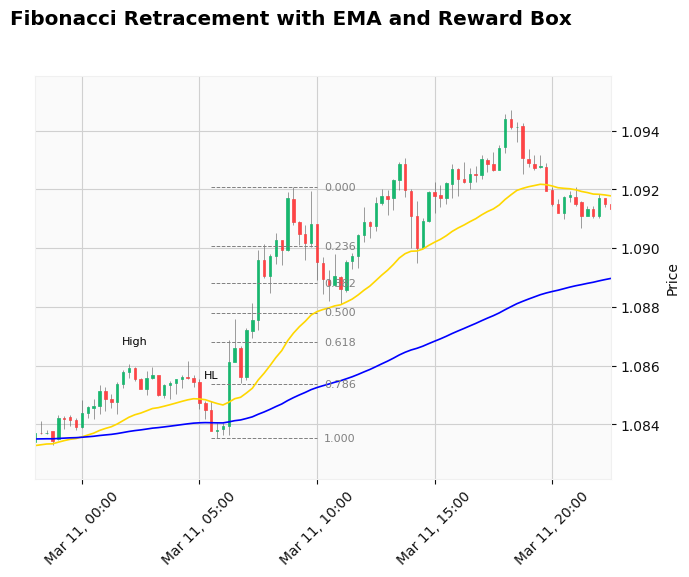

[2025-03-11 10:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-03-11 13:15:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


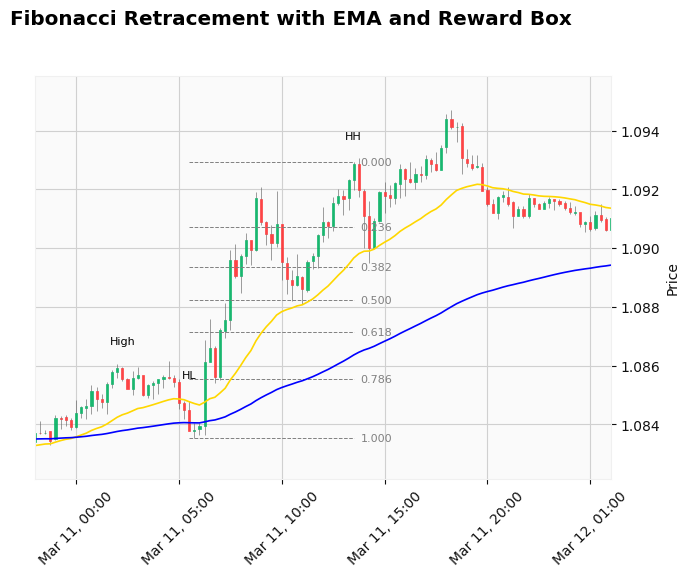

[2025-03-11 14:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-03-11 17:00:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


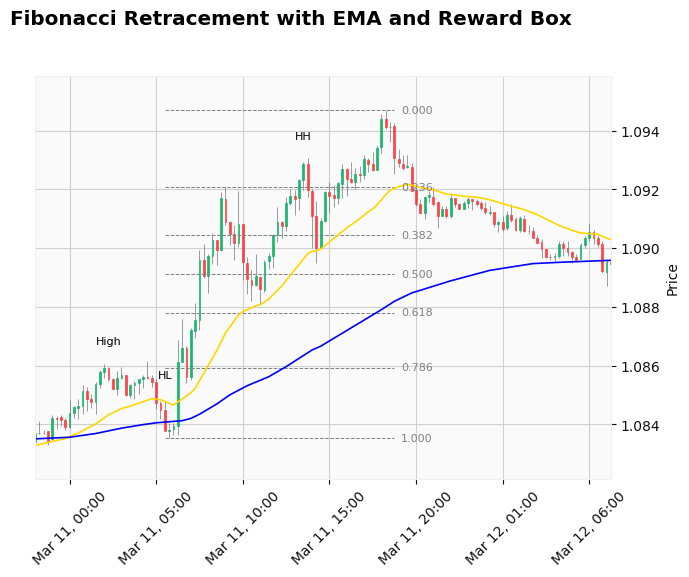

[2025-03-11 19:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


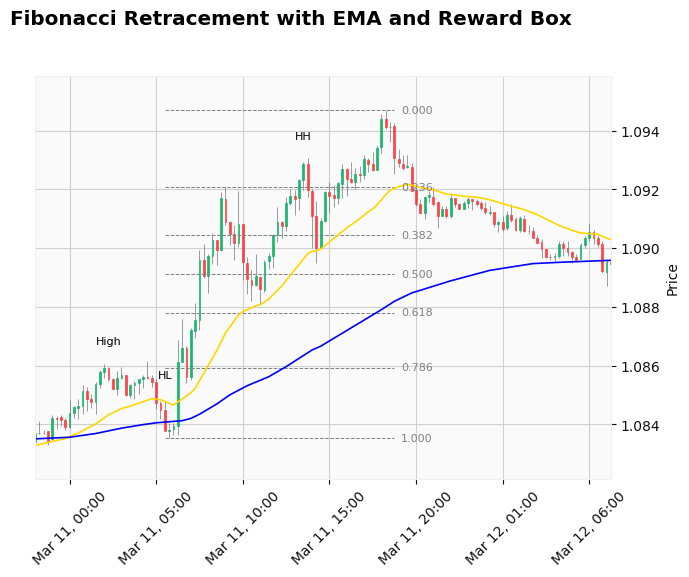

[2025-03-12 12:30:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


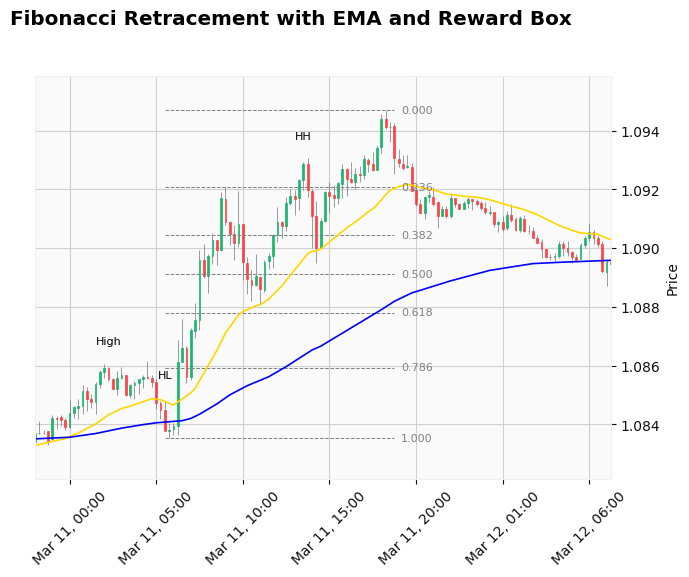

[2025-03-12 13:00:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


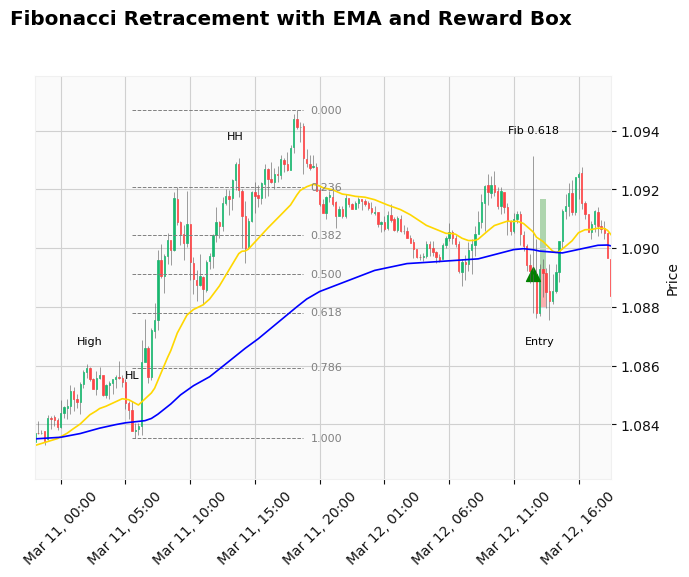

[2025-03-12 13:30:00] STOP LOSS triggered.
[2025-03-12 13:30:00] ENTER_MARKET completed – FSM reset (bull)
[2025-03-12 16:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 4796
[2025-03-12 20:00:00] Trend changed from bullish to bearish, FSM RESET
[2025-03-13 00:45:00] State changed: IDLE → PULLBACK_DETECTED
[2025-03-13 05:15:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


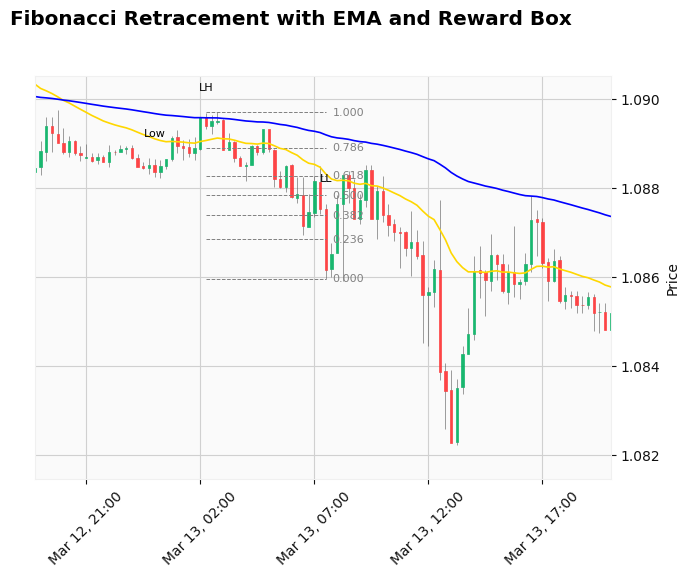

[2025-03-13 08:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


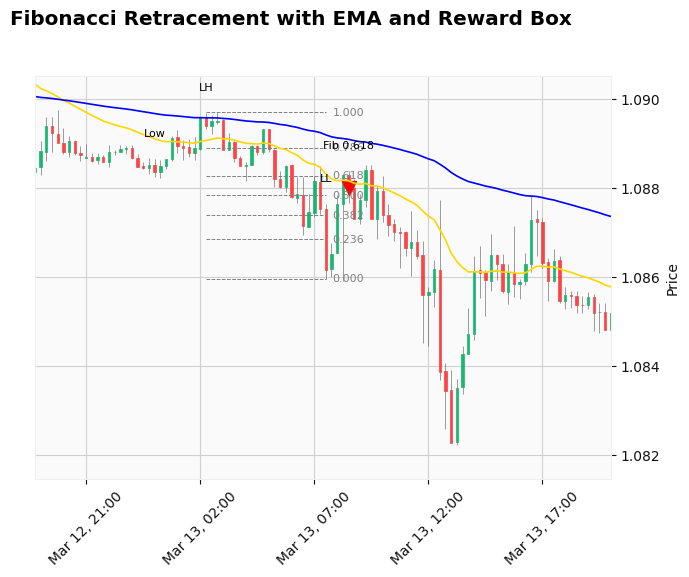

[2025-03-13 08:30:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-03-13 11:45:00] State changed: ENTRY_SIGNAL → BREAK_OF_STRUCTURE (Invalidated)


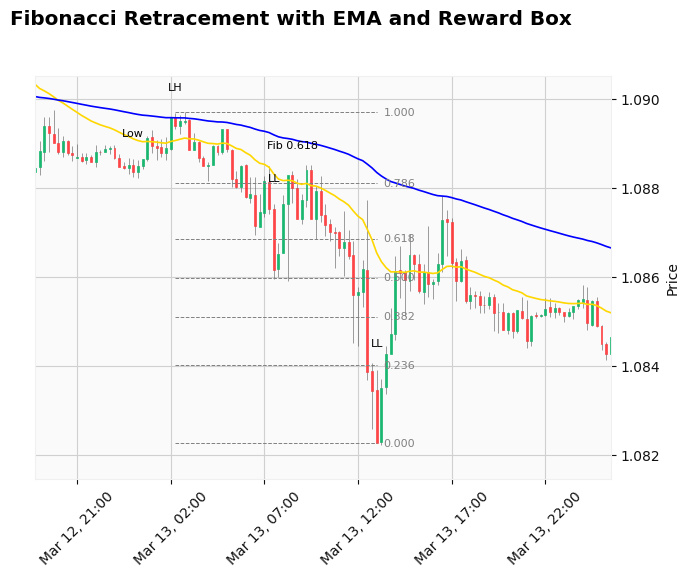

[2025-03-13 13:45:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


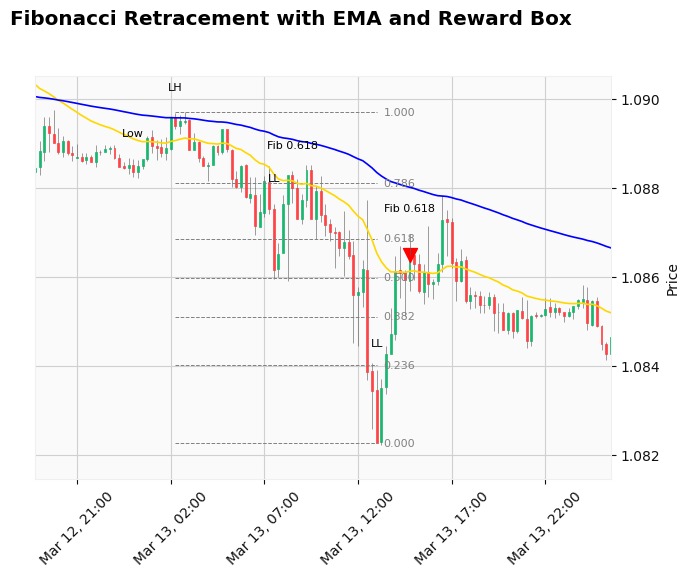

[2025-03-13 14:45:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL


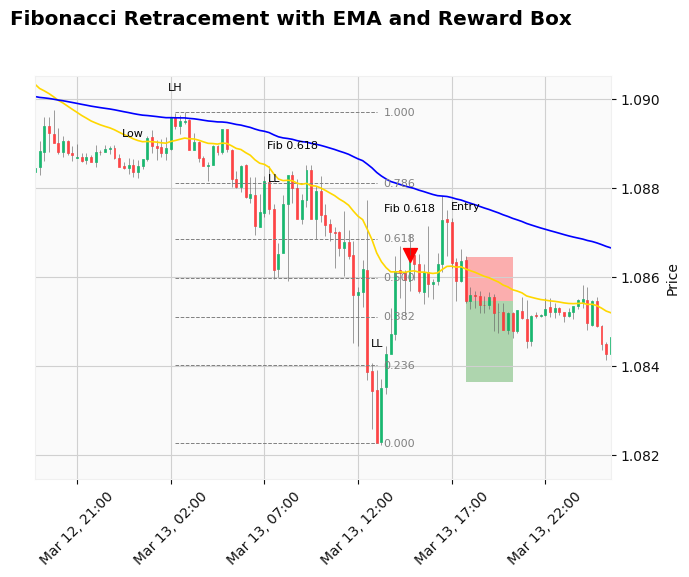

[2025-03-13 17:45:00] State changed: ENTRY_SIGNAL → ENTER_MARKET


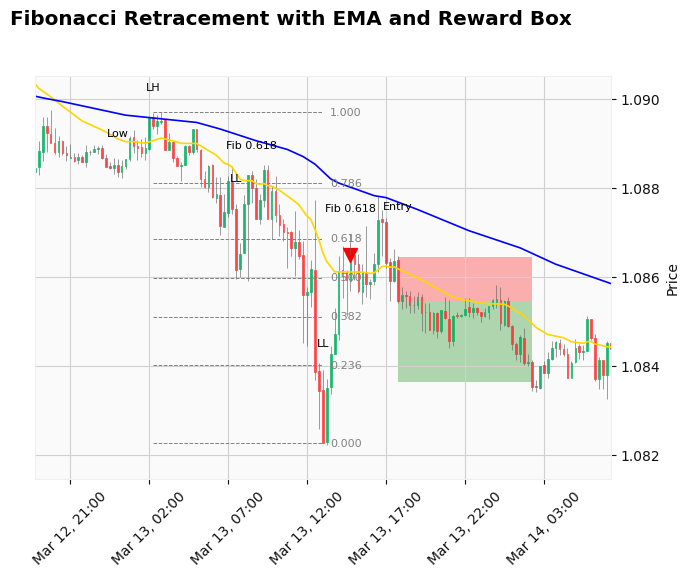

[2025-03-14 02:15:00] TAKE PROFIT triggered.
[2025-03-14 02:15:00] Exited ENTER_MARKET — resetting FSM to IDLE
[2025-03-14 03:45:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 4953
[2025-03-14 11:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-03-14 13:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-03-17 14:15:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


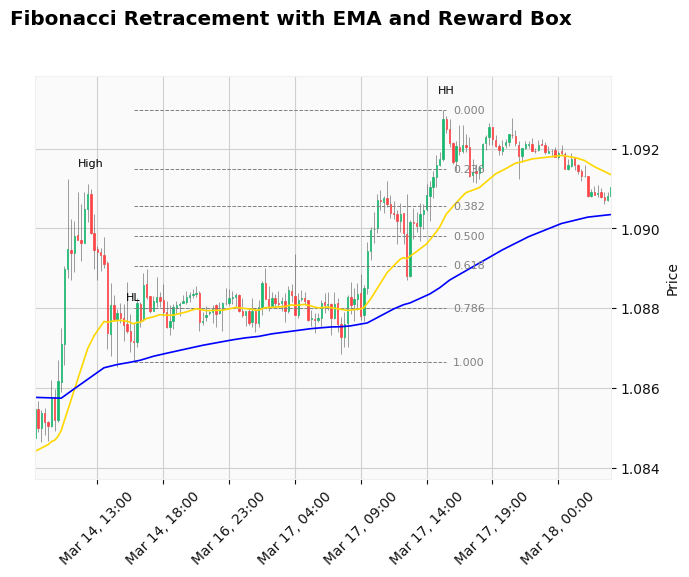

[2025-03-17 16:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-03-18 07:45:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


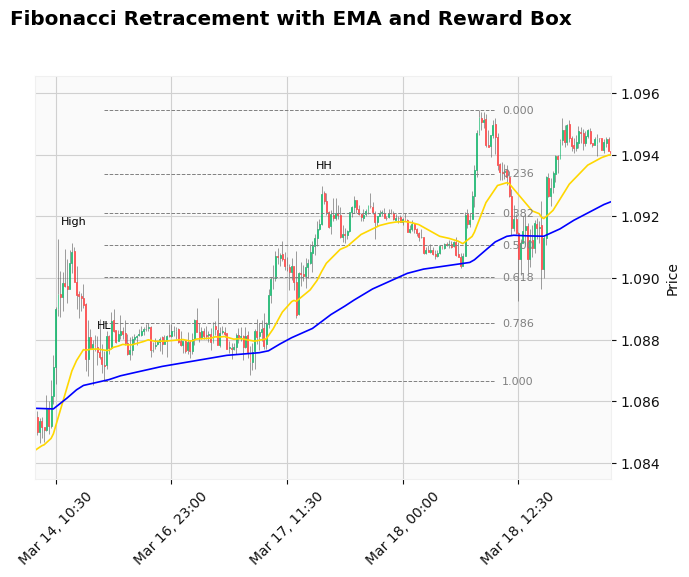

[2025-03-18 10:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


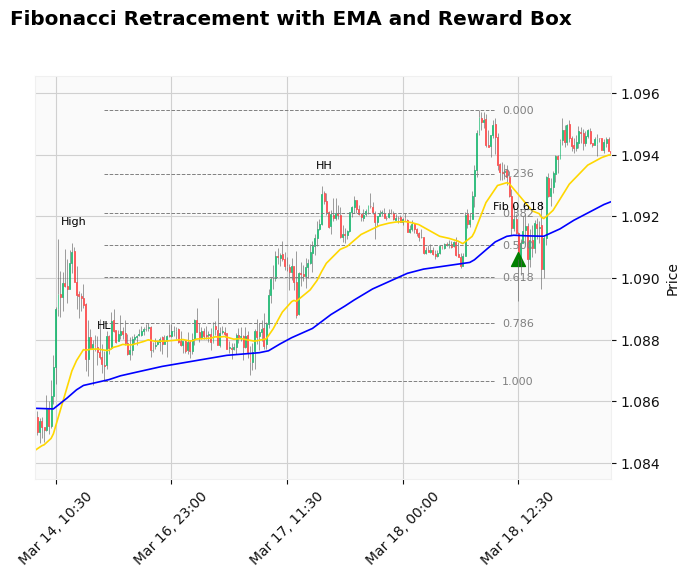

[2025-03-18 12:30:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


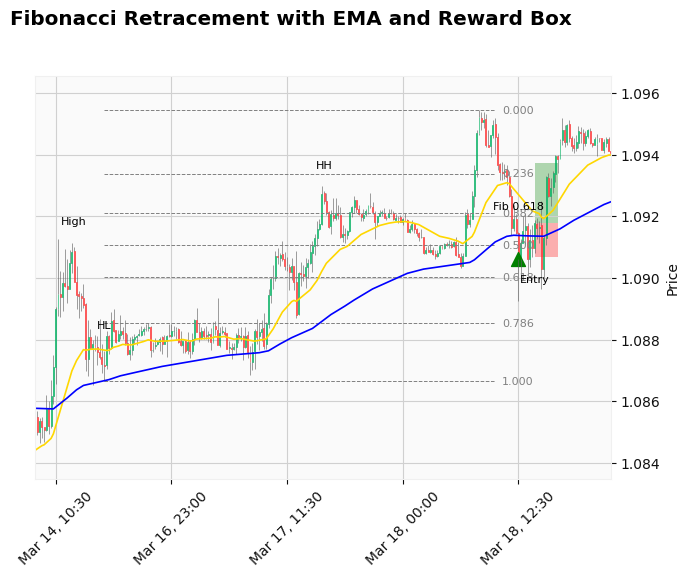

[2025-03-18 14:15:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


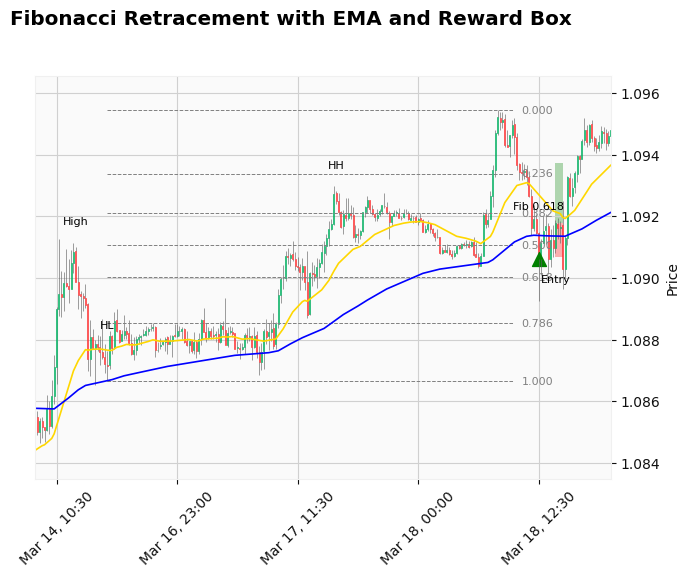

[2025-03-18 15:00:00] STOP LOSS triggered.
[2025-03-18 15:00:00] ENTER_MARKET completed – FSM reset (bull)
[2025-03-18 18:30:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 5226
[2025-03-19 07:30:00] Trend changed from bullish to bearish, FSM RESET
[2025-03-19 18:15:00] State changed: IDLE → PULLBACK_DETECTED
[2025-03-20 08:30:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


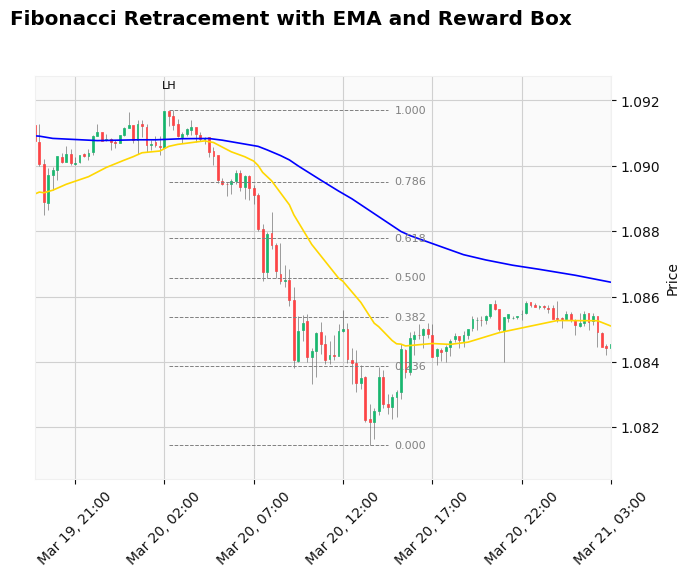

[2025-03-20 15:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-03-21 15:45:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


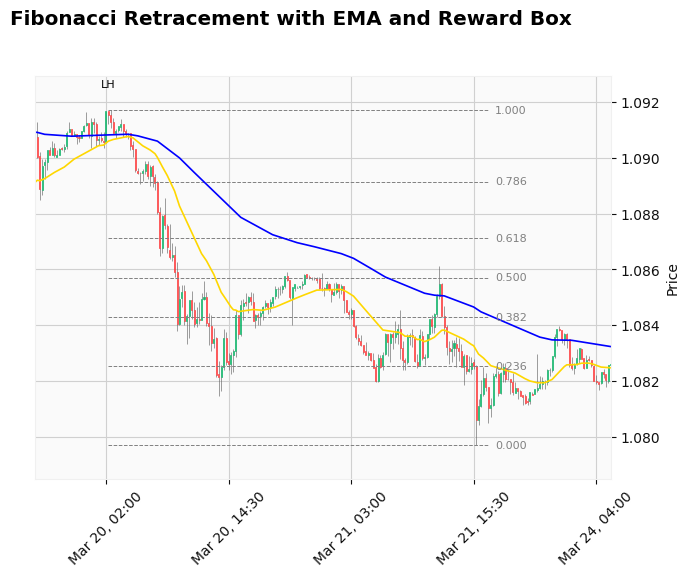

[2025-03-21 17:45:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
self.trend_changing_idx 5518
[2025-03-24 08:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-03-24 09:00:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 5537
[2025-03-24 13:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-03-24 18:30:00] State changed: IDLE → PULLBACK_DETECTED
[2025-03-25 07:30:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


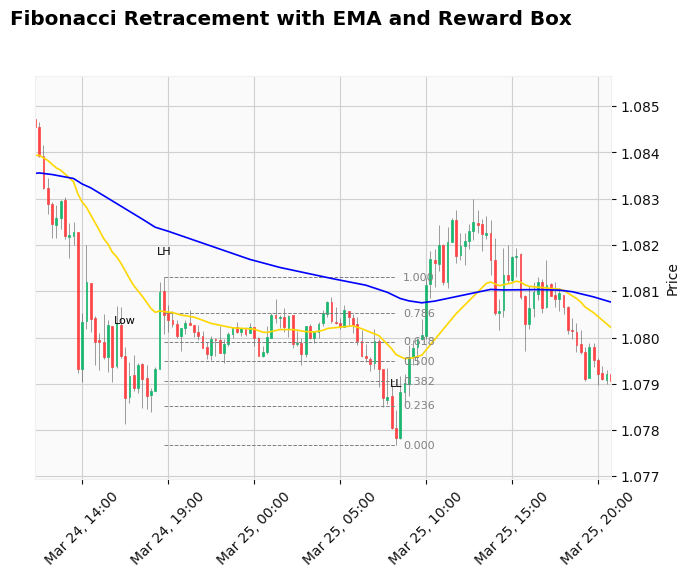

[2025-03-25 09:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


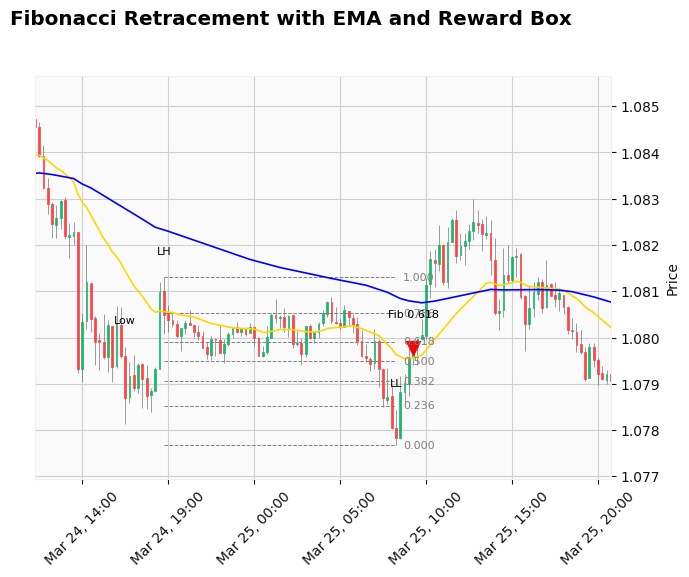

[2025-03-25 09:15:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-03-25 10:15:00] State changed: ENTRY_SIGNAL → PULLBACK_DETECTED (Invalidated)
self.trend_changing_idx 5632
[2025-03-25 13:00:00] Trend changed from bearish to bullish, FSM RESET
self.trend_changing_idx 5653
[2025-03-25 18:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-03-25 22:00:00] State changed: IDLE → PULLBACK_DETECTED
[2025-03-25 22:30:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE
[2025-03-26 01:45:00] State changed: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (Invalidated)
[2025-03-26 04:30:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


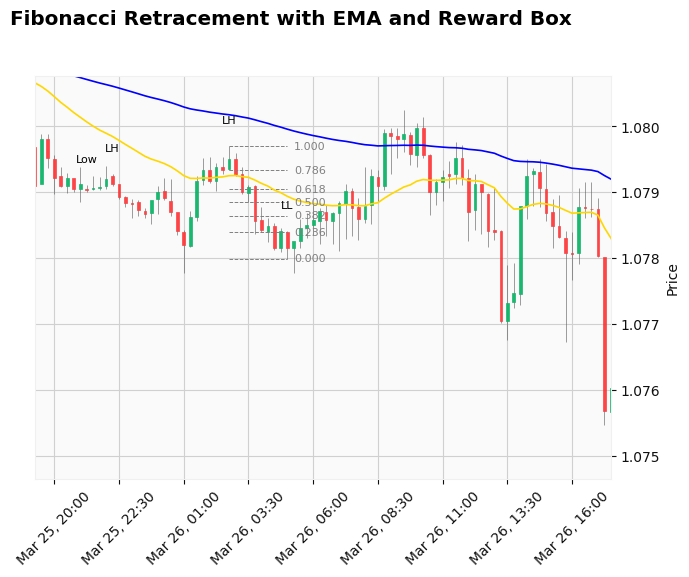

[2025-03-26 05:45:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


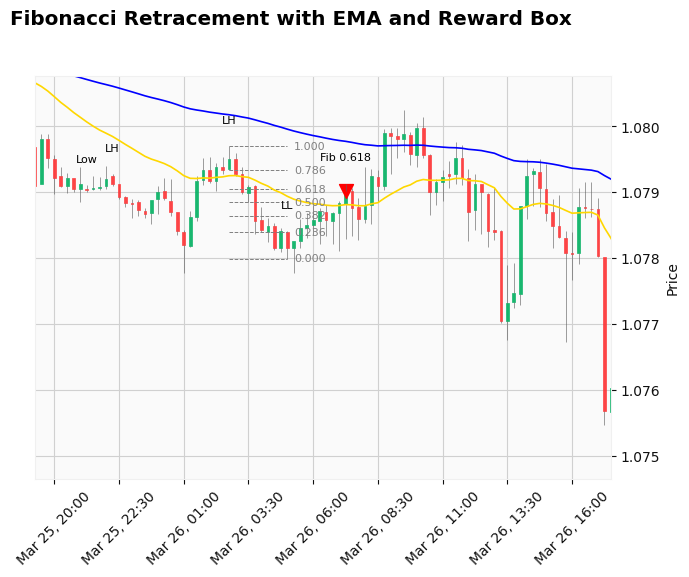

[2025-03-26 07:15:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-03-26 08:45:00] State changed: ENTRY_SIGNAL → PULLBACK_DETECTED (Invalidated)
[2025-03-26 13:15:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


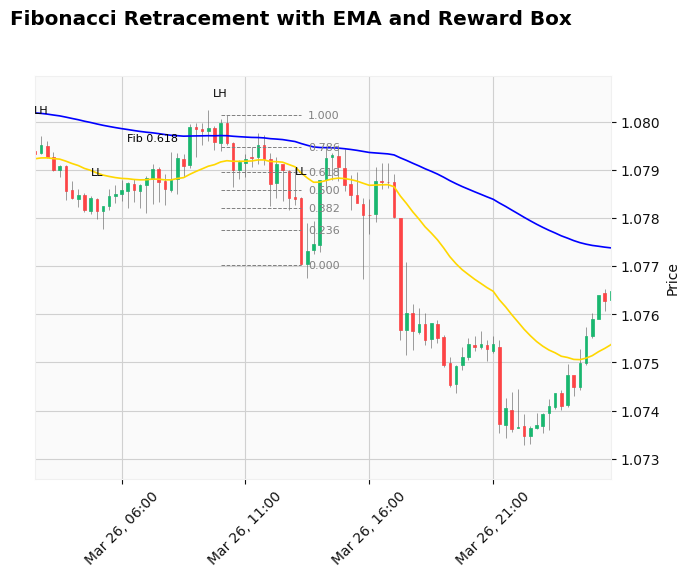

[2025-03-26 14:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


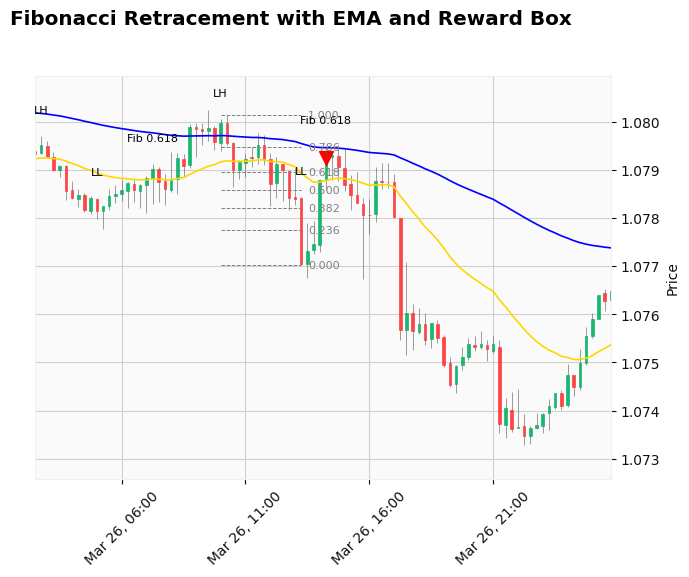

[2025-03-26 14:15:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-03-26 17:15:00] State changed: ENTRY_SIGNAL → BREAK_OF_STRUCTURE (Invalidated)


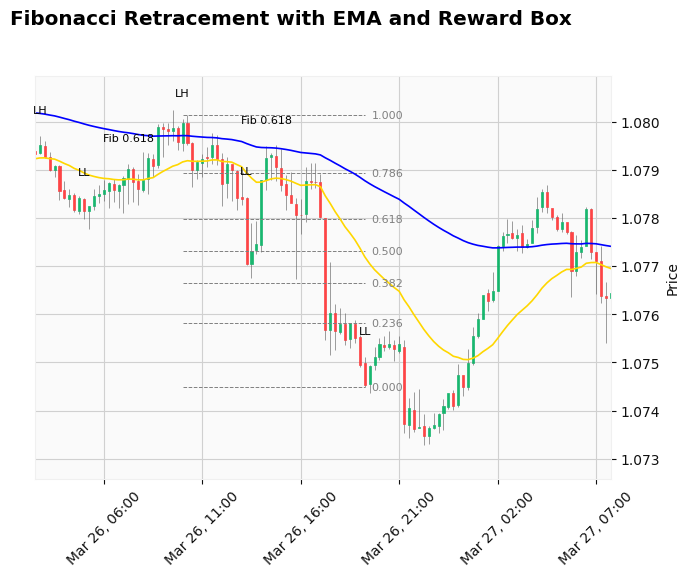

[2025-03-26 20:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-03-26 21:15:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


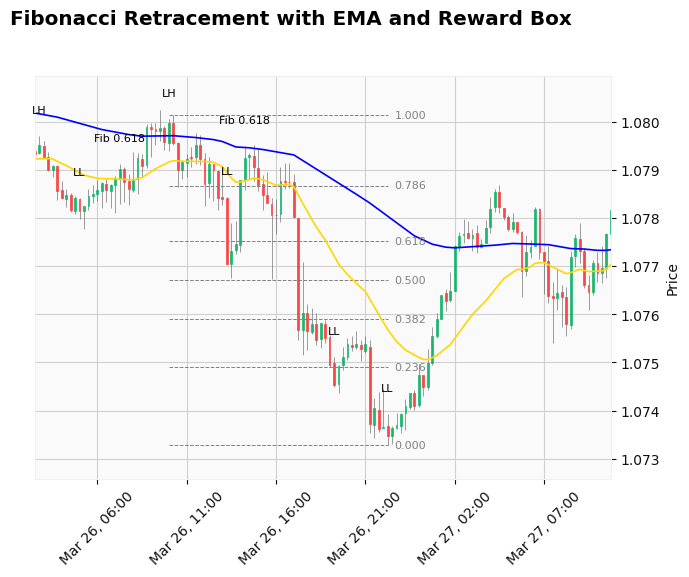

[2025-03-26 23:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


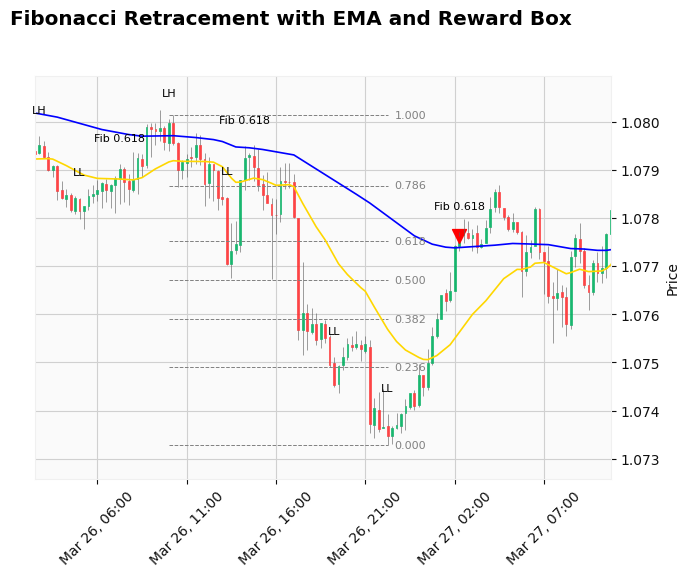

[2025-03-27 02:15:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL


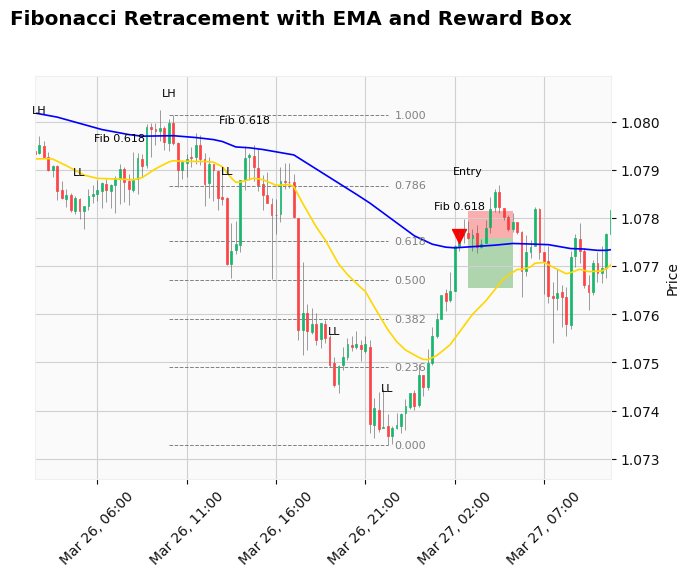

[2025-03-27 02:45:00] State changed: ENTRY_SIGNAL → ENTER_MARKET


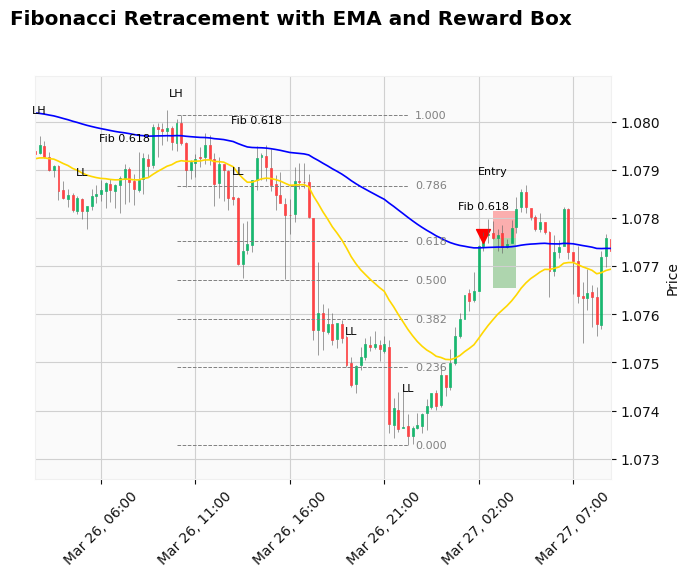

[2025-03-27 04:00:00] STOP LOSS triggered.
[2025-03-27 04:00:00] Exited ENTER_MARKET — resetting FSM to IDLE
[2025-03-27 04:15:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 5820
[2025-03-27 12:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-03-27 13:15:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-03-27 15:15:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


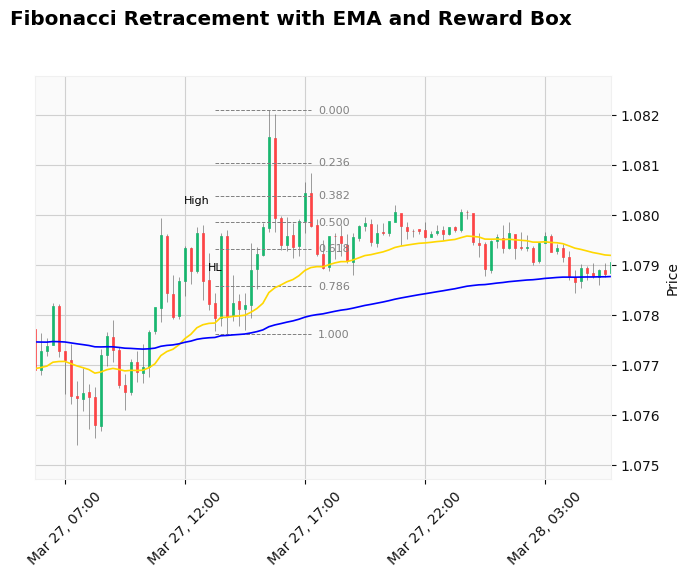

[2025-03-27 17:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


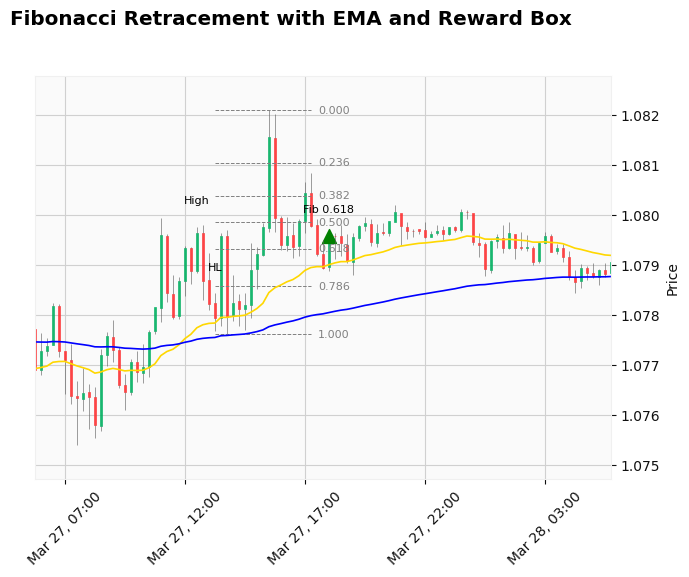

[2025-03-27 18:00:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


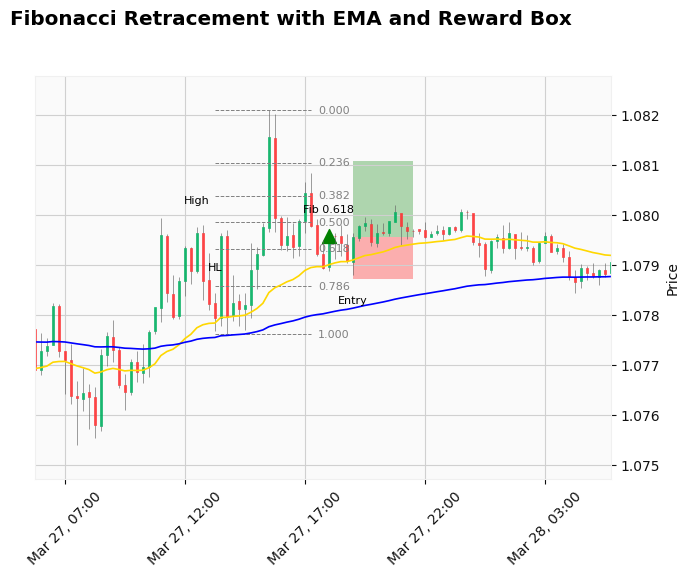

[2025-03-27 19:00:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


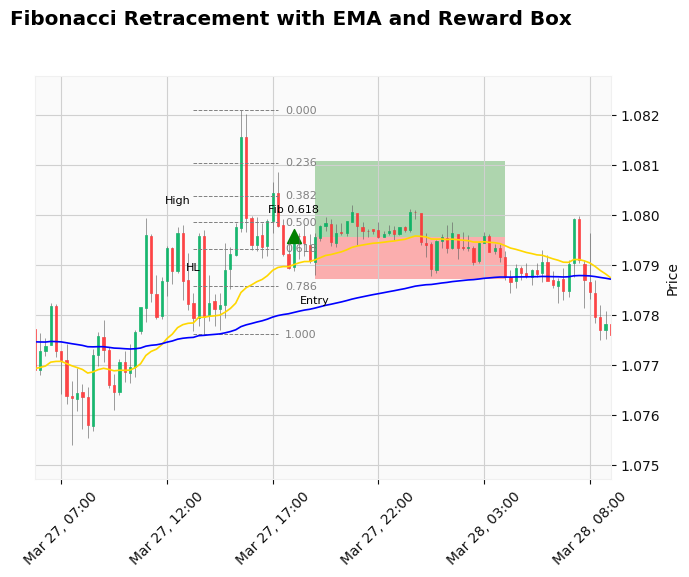

[2025-03-28 04:00:00] STOP LOSS triggered.
[2025-03-28 04:00:00] ENTER_MARKET completed – FSM reset (bull)
[2025-03-28 04:15:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 5905
[2025-03-28 09:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-03-28 13:00:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 5924
[2025-03-28 14:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-03-28 16:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-03-31 00:45:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)
[2025-03-31 10:00:00] State: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (bull, Invalidated)
self.trend_changing_idx 6022
[2025-03-31 14:30:00] Trend changed from bullish to bearish, FSM RESET
[2025-03-31 16:30:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 6052
[2025-03-31 22:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-01 03:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-04-01 03:45:00] S

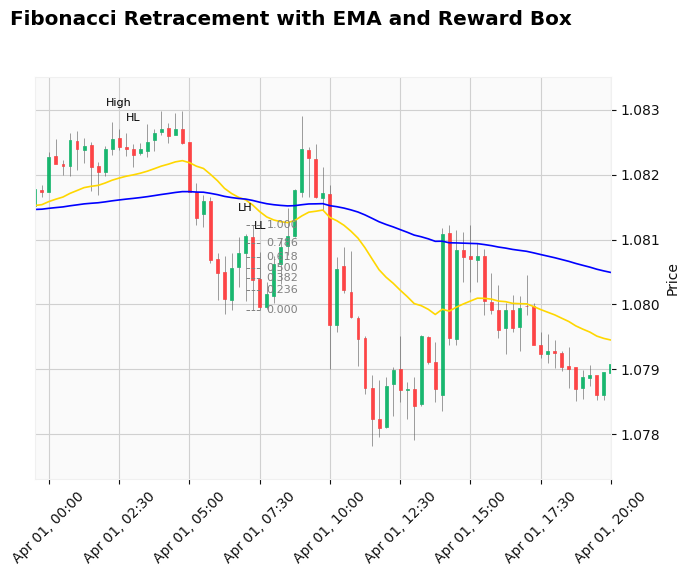

[2025-04-01 08:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


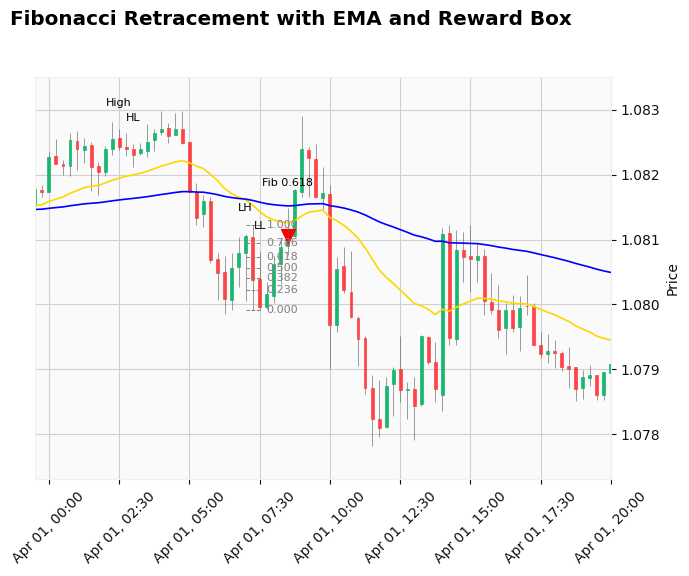

[2025-04-01 08:30:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-04-01 08:45:00] State changed: ENTRY_SIGNAL → PULLBACK_DETECTED (Invalidated)
[2025-04-01 10:00:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


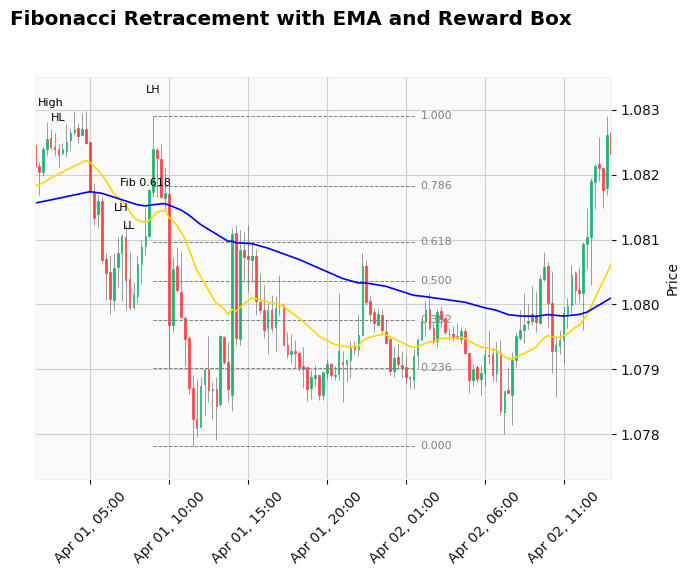

[2025-04-02 02:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


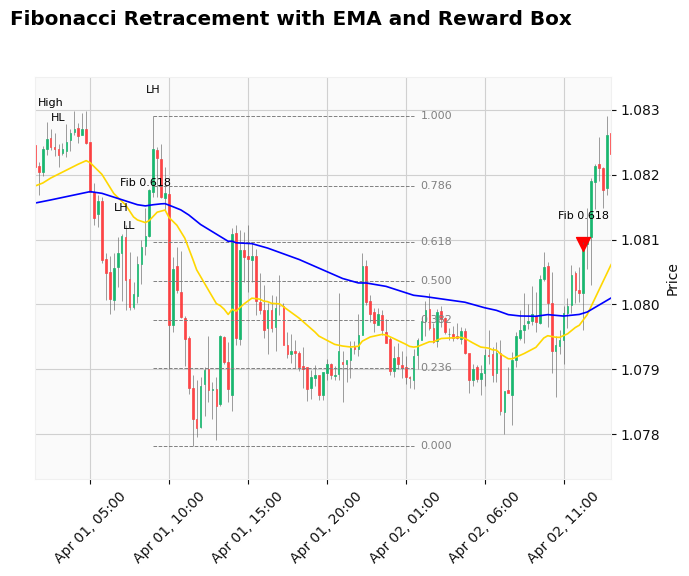

[2025-04-02 12:15:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
self.trend_changing_idx 6207
[2025-04-02 12:45:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-02 16:30:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-04-02 20:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)
[2025-04-02 20:30:00] State: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (bull, Invalidated)
[2025-04-02 23:15:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


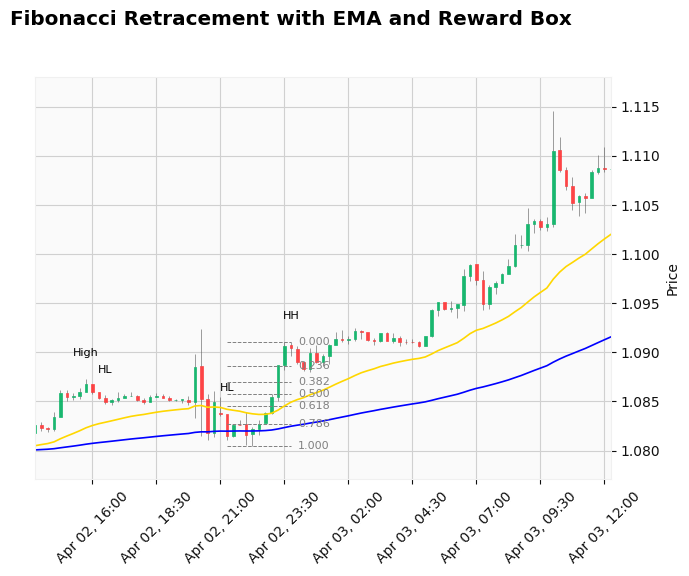

[2025-04-03 00:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-04-03 01:30:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


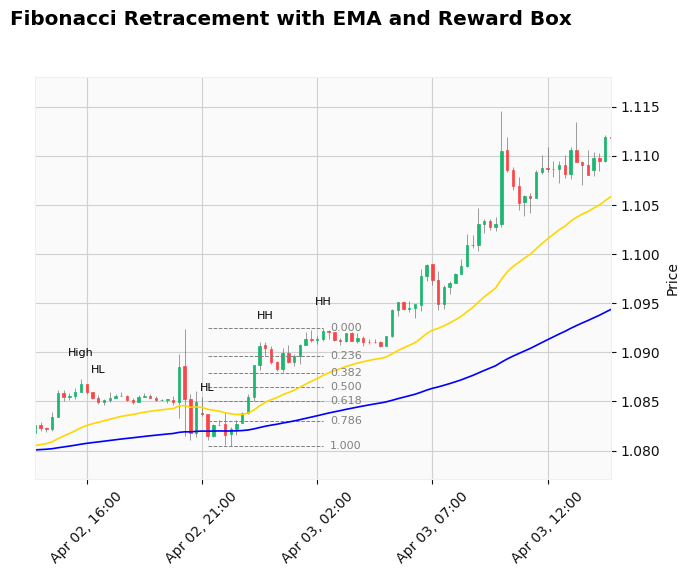

[2025-04-03 03:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-04-03 05:15:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


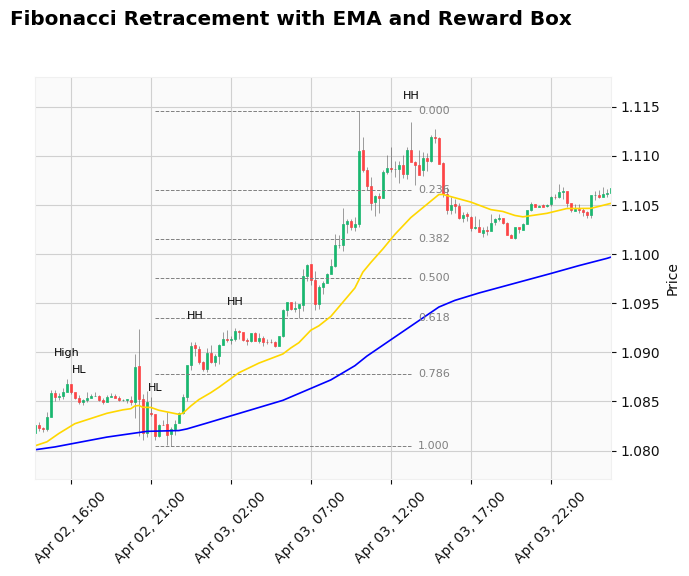

[2025-04-03 13:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
self.trend_changing_idx 6410
[2025-04-04 15:30:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-04 18:00:00] State changed: IDLE → PULLBACK_DETECTED
[2025-04-06 21:00:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


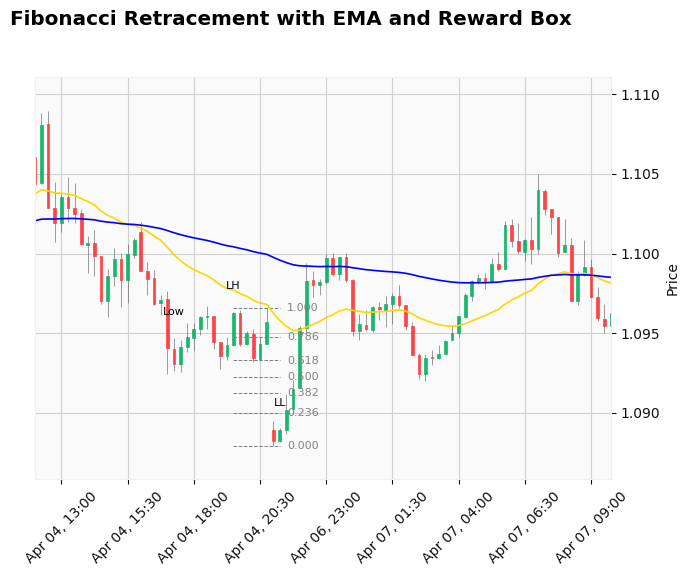

[2025-04-06 21:45:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


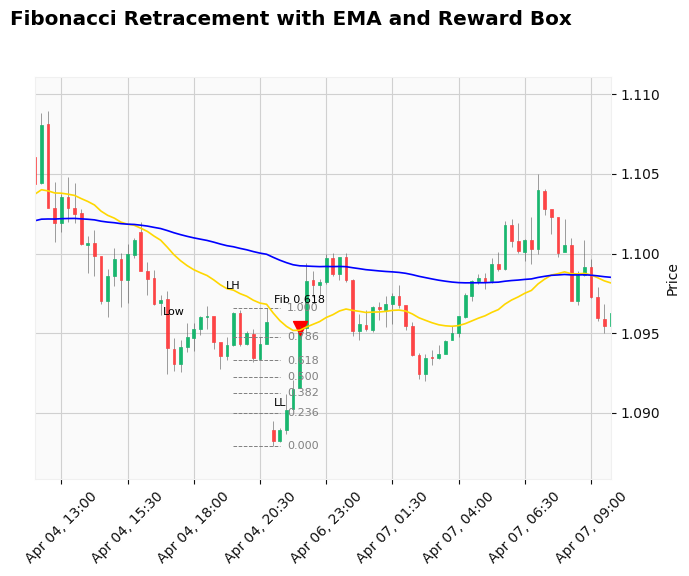

[2025-04-06 22:00:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-04-06 22:15:00] State changed: ENTRY_SIGNAL → PULLBACK_DETECTED (Invalidated)
self.trend_changing_idx 6474
[2025-04-07 07:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-07 07:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 6481
[2025-04-07 09:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-07 10:15:00] State changed: IDLE → PULLBACK_DETECTED
[2025-04-07 11:00:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


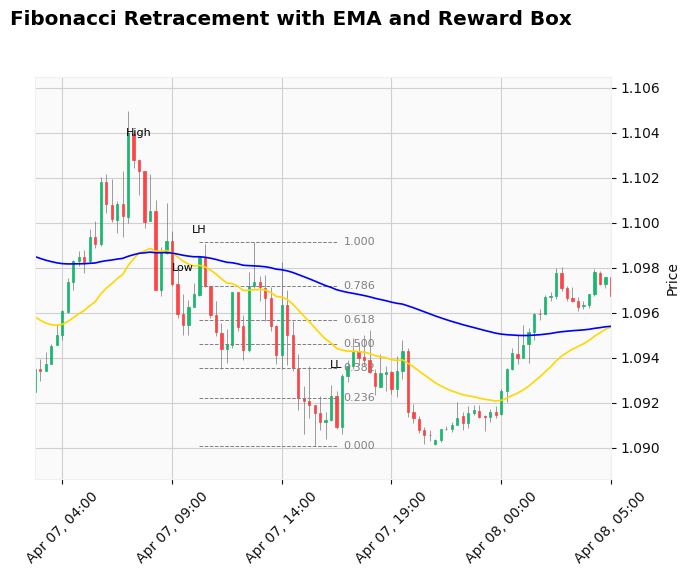

[2025-04-07 17:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


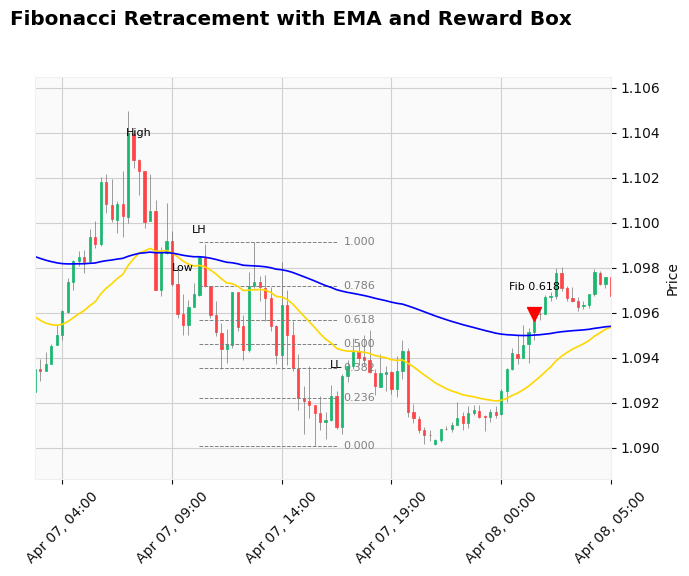

[2025-04-08 01:30:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
self.trend_changing_idx 6561
[2025-04-08 05:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-08 05:30:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-04-08 05:45:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


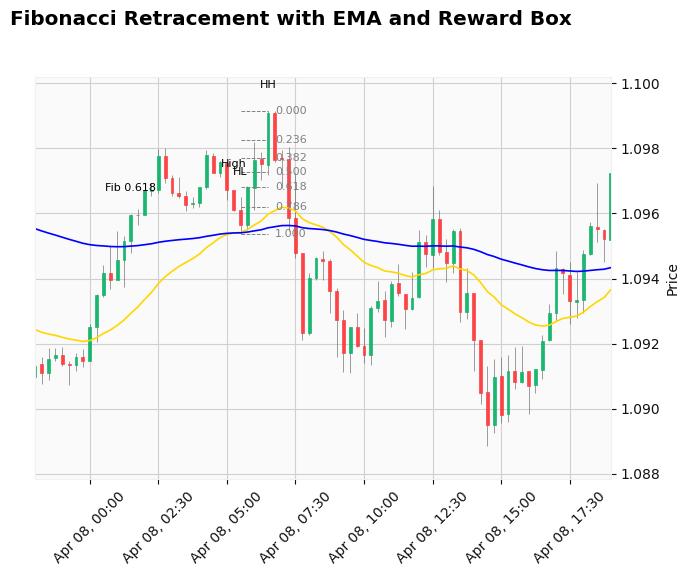

[2025-04-08 07:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


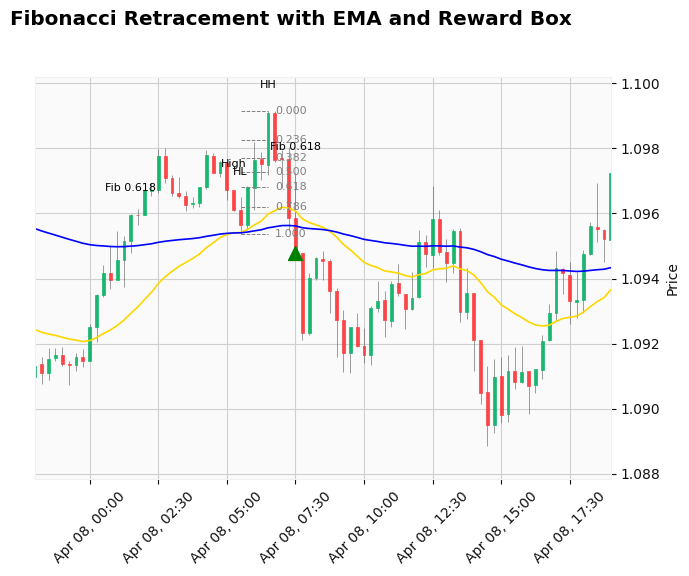

[2025-04-08 07:30:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)
[2025-04-08 07:45:00] State: ENTRY_SIGNAL → PULLBACK_DETECTED (bull, Invalidated)
self.trend_changing_idx 6575
[2025-04-08 08:45:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-08 16:45:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 6627
[2025-04-08 21:45:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-09 07:30:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-04-09 12:15:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


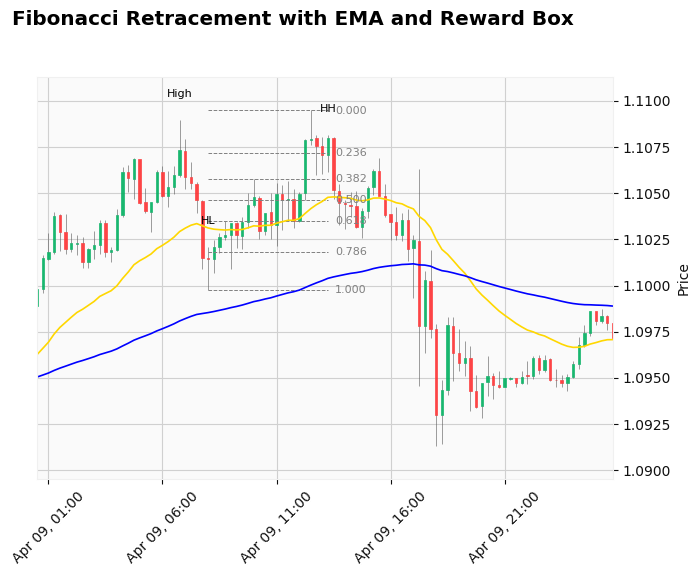

[2025-04-09 14:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


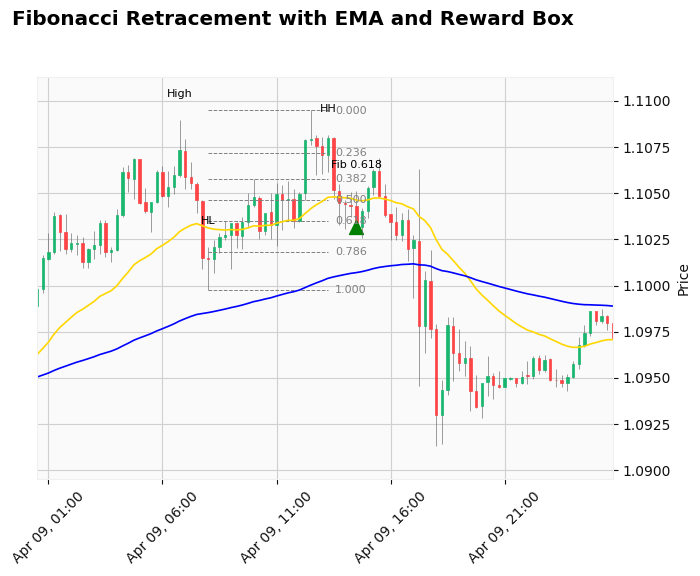

[2025-04-09 14:30:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


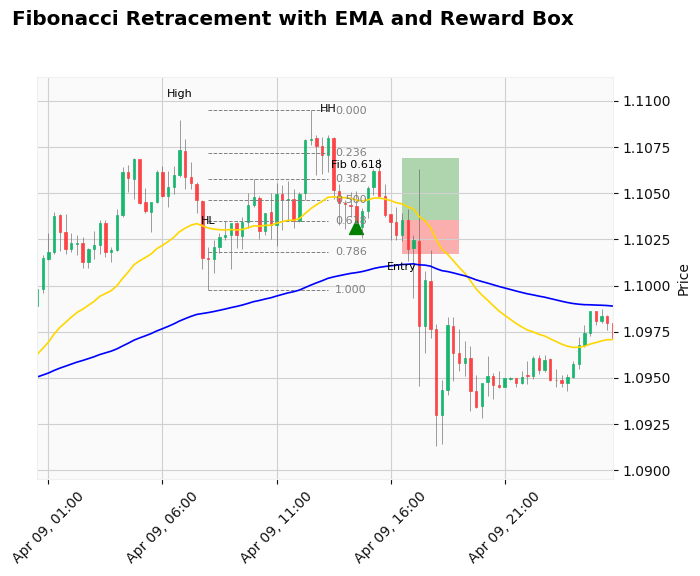

[2025-04-09 16:30:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


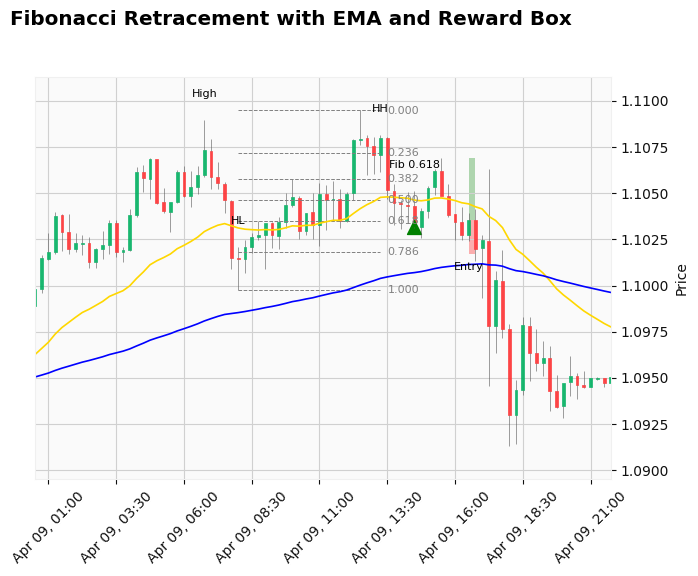

[2025-04-09 16:45:00] STOP LOSS triggered.
[2025-04-09 16:45:00] ENTER_MARKET completed – FSM reset (bull)
self.trend_changing_idx 6714
[2025-04-09 19:30:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-10 00:15:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 6765
[2025-04-10 08:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-10 11:45:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-04-10 12:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


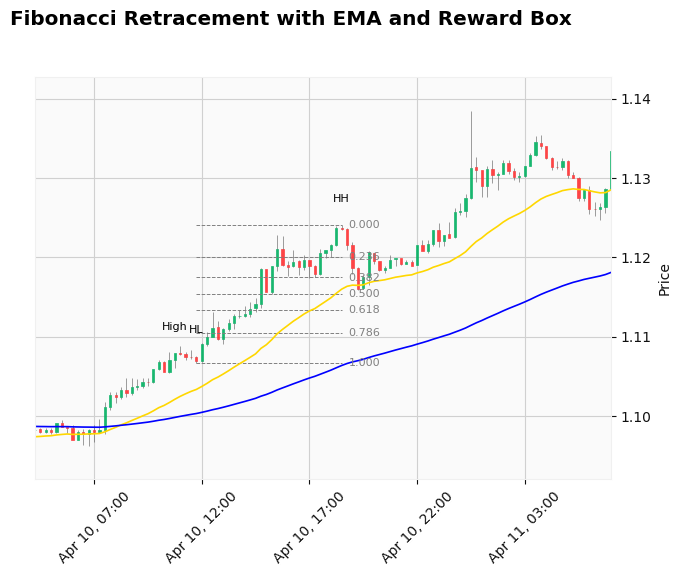

[2025-04-10 19:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-04-10 23:45:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


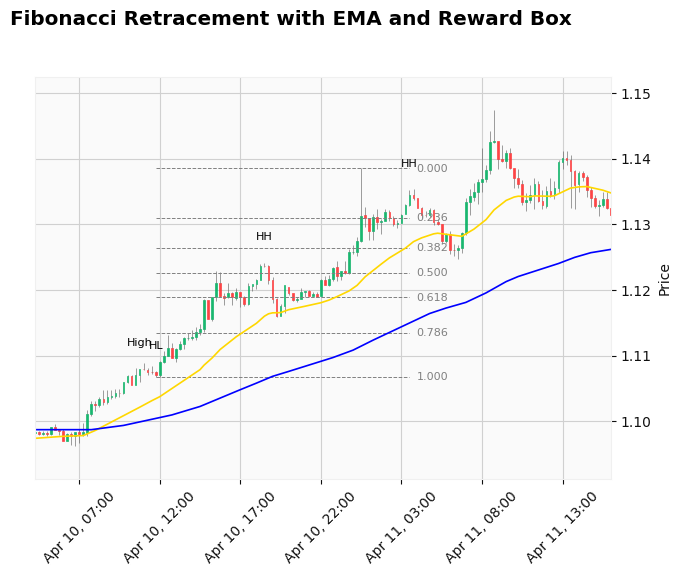

[2025-04-11 04:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-04-11 08:30:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


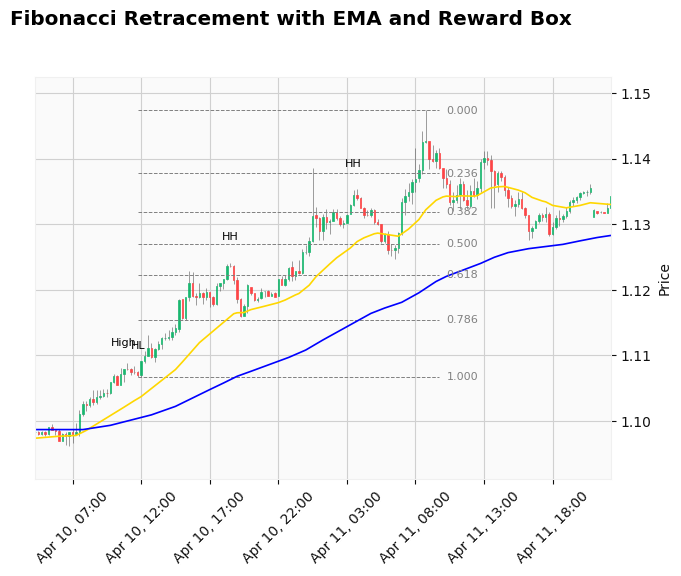

[2025-04-11 10:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
self.trend_changing_idx 7023
[2025-04-15 00:45:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-15 01:15:00] State changed: IDLE → PULLBACK_DETECTED
[2025-04-15 01:30:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE
[2025-04-15 02:00:00] State changed: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (Invalidated)
self.trend_changing_idx 7038
[2025-04-15 04:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-15 05:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 7065
[2025-04-15 11:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-15 14:45:00] State changed: IDLE → PULLBACK_DETECTED
[2025-04-15 15:45:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


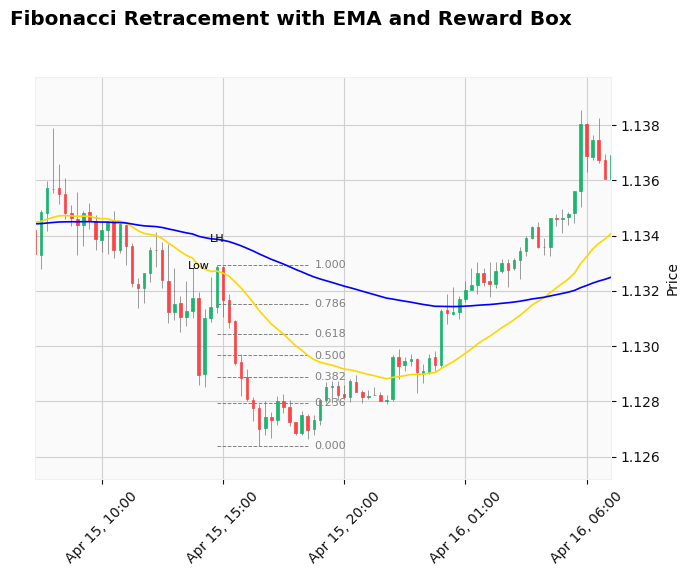

[2025-04-15 19:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


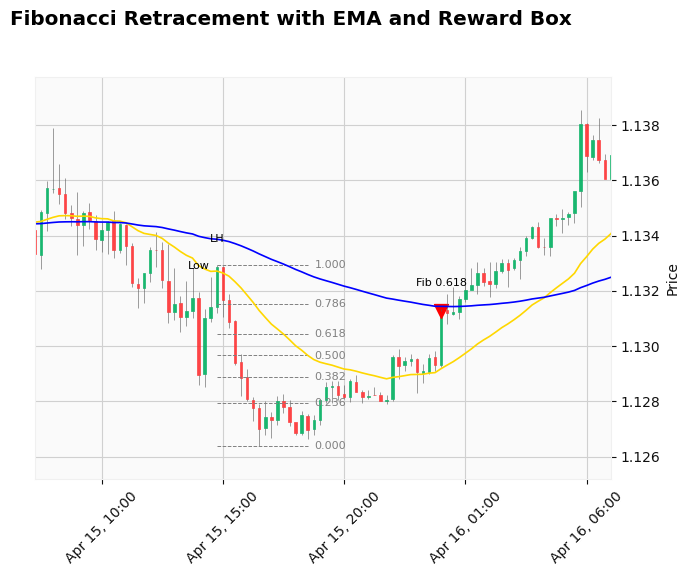

[2025-04-16 00:00:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-04-16 02:30:00] State changed: ENTRY_SIGNAL → PULLBACK_DETECTED (Invalidated)
self.trend_changing_idx 7134
[2025-04-16 04:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-16 08:30:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-04-16 19:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


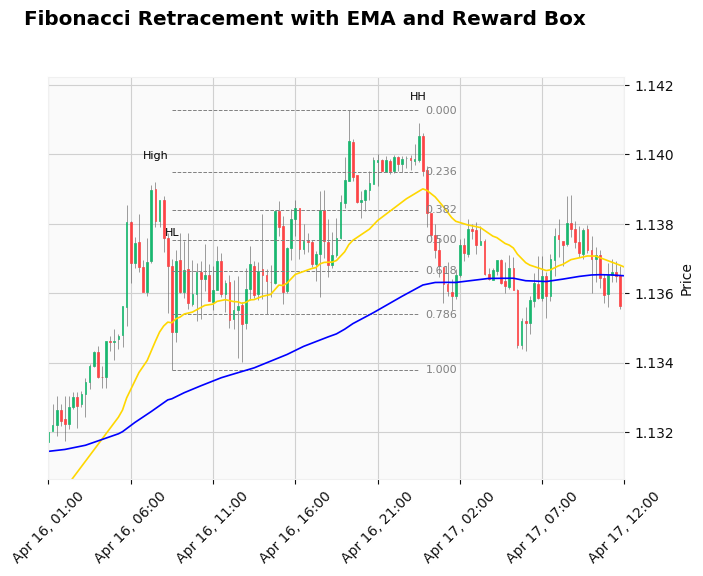

[2025-04-17 00:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


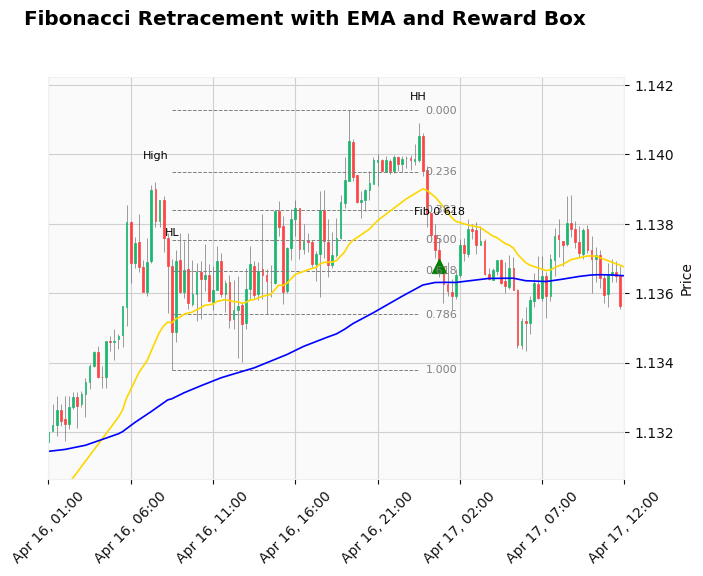

[2025-04-17 00:45:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


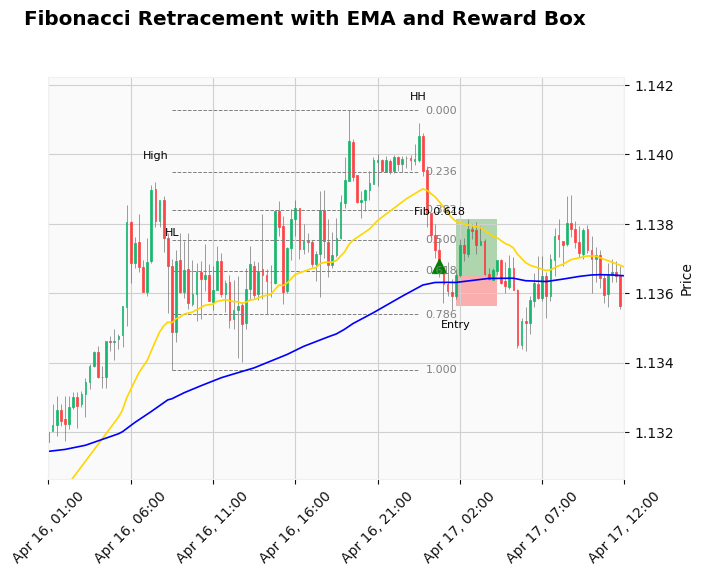

[2025-04-17 01:45:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


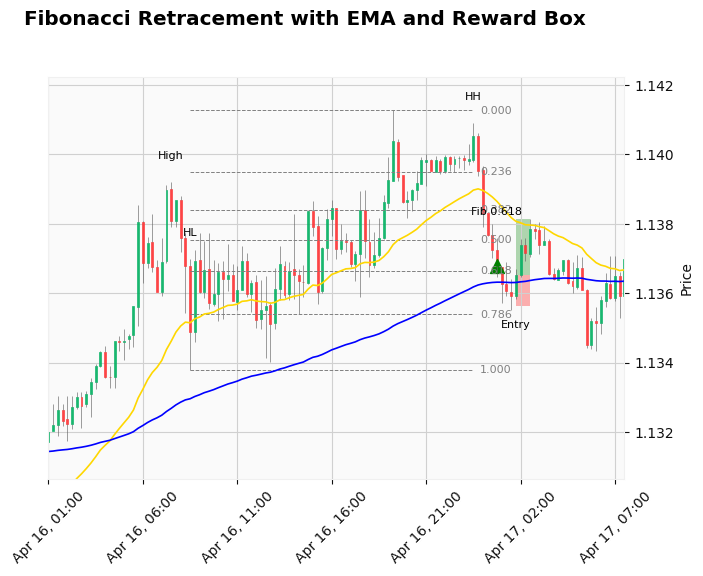

[2025-04-17 02:30:00] TAKE PROFIT triggered.
[2025-04-17 02:30:00] ENTER_MARKET completed – FSM reset (bull)
[2025-04-17 09:15:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 7264
[2025-04-17 13:00:00] Trend changed from bullish to bearish, FSM RESET
self.trend_changing_idx 7269
[2025-04-17 14:15:00] Trend changed from bearish to bullish, FSM RESET
self.trend_changing_idx 7271
[2025-04-17 14:45:00] Trend changed from bullish to bearish, FSM RESET
self.trend_changing_idx 7273
[2025-04-17 15:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-17 16:00:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 7277
[2025-04-17 16:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-17 17:45:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 7293
[2025-04-17 20:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-17 20:45:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-04-18 00:15:00] State: PULLBACK_DETECTED

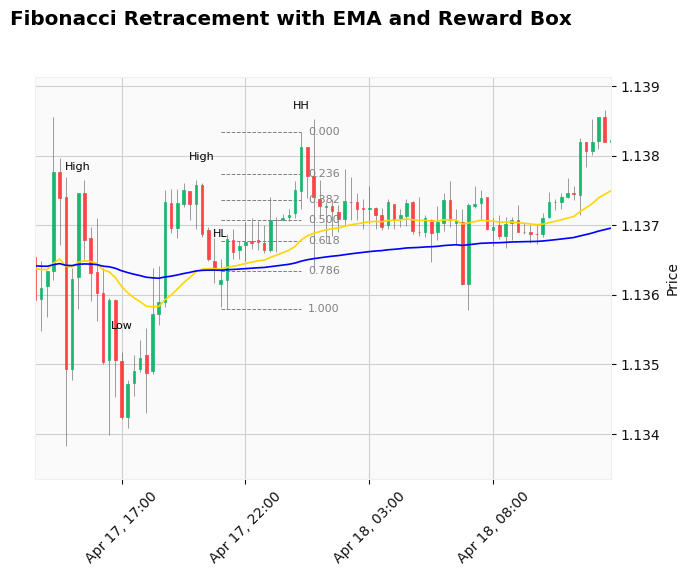

[2025-04-18 01:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


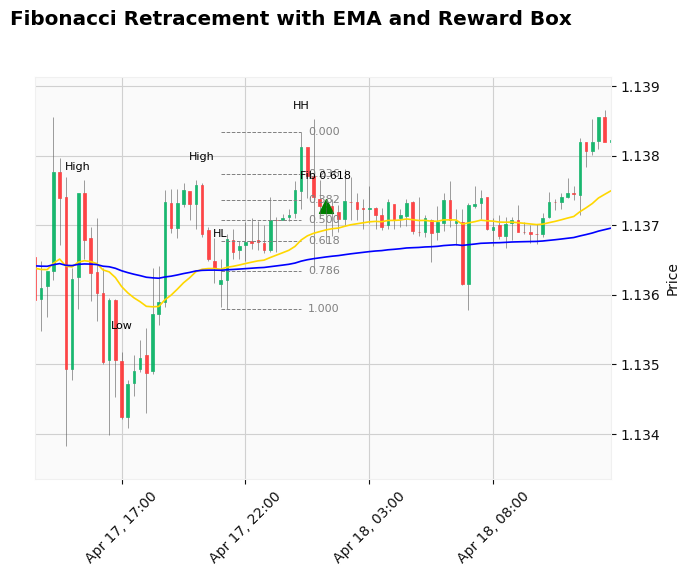

[2025-04-18 01:15:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


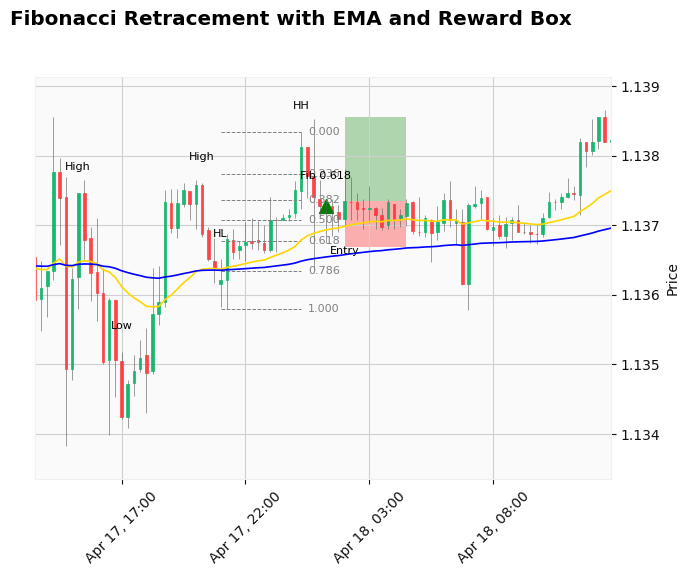

[2025-04-18 02:00:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


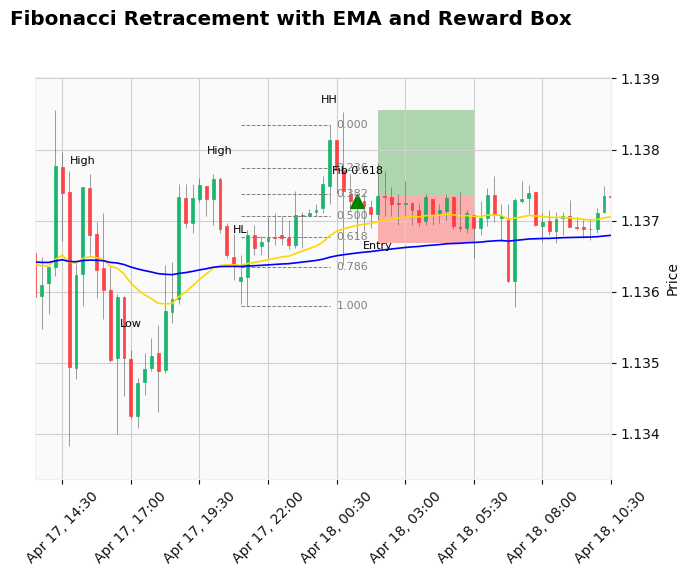

[2025-04-18 05:30:00] STOP LOSS triggered.
[2025-04-18 05:30:00] ENTER_MARKET completed – FSM reset (bull)
[2025-04-18 09:30:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-04-18 11:30:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


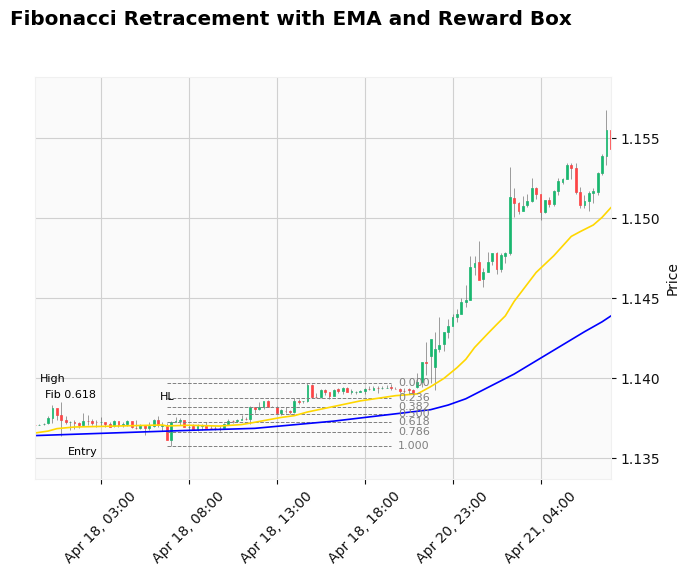

[2025-04-18 20:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-04-20 21:00:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


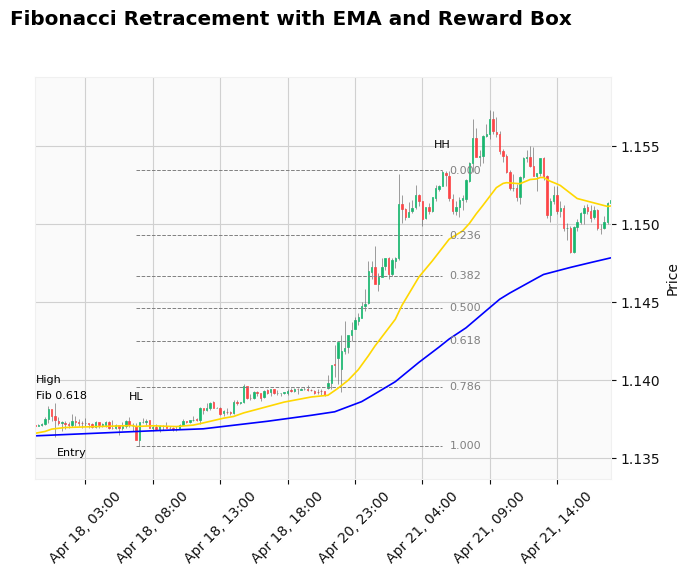

[2025-04-21 06:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-04-21 07:30:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


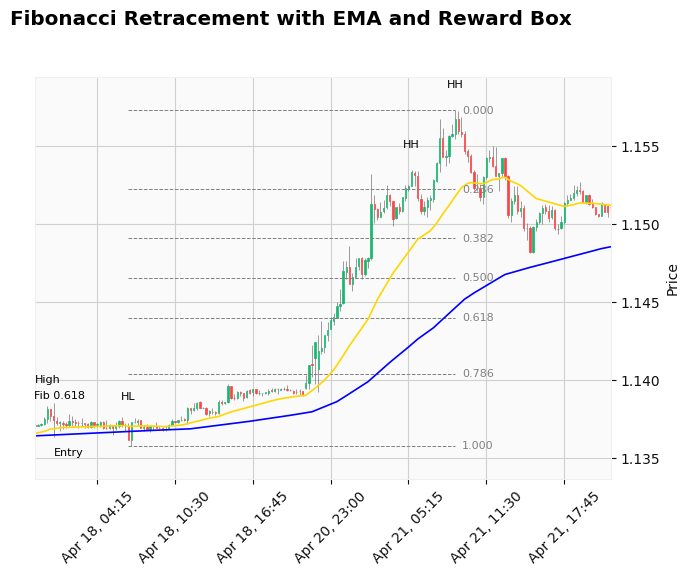

[2025-04-21 09:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
self.trend_changing_idx 7549
[2025-04-22 12:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-22 13:45:00] State changed: IDLE → PULLBACK_DETECTED
[2025-04-22 14:15:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE
[2025-04-22 14:30:00] State changed: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (Invalidated)
[2025-04-22 16:00:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


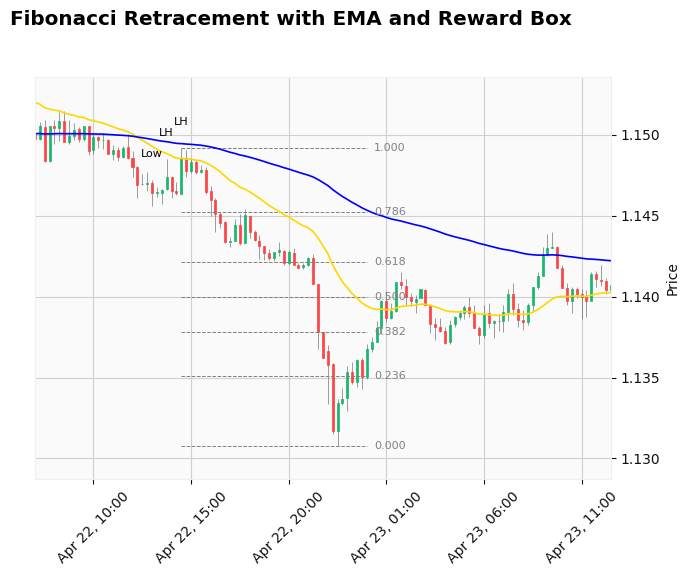

[2025-04-23 00:30:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


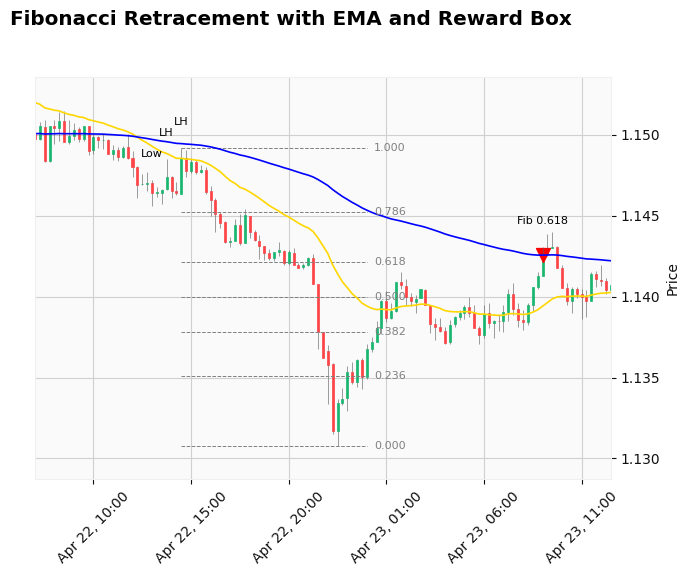

[2025-04-23 09:00:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL


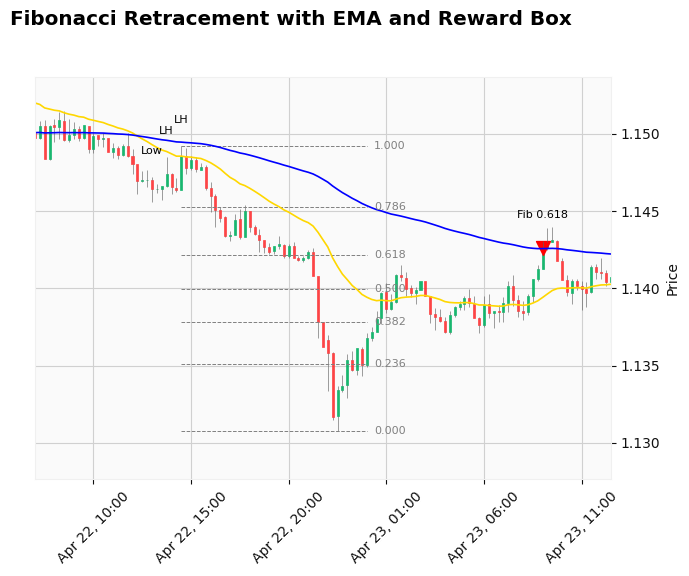

[2025-04-23 17:30:00] State changed: ENTRY_SIGNAL → ENTER_MARKET


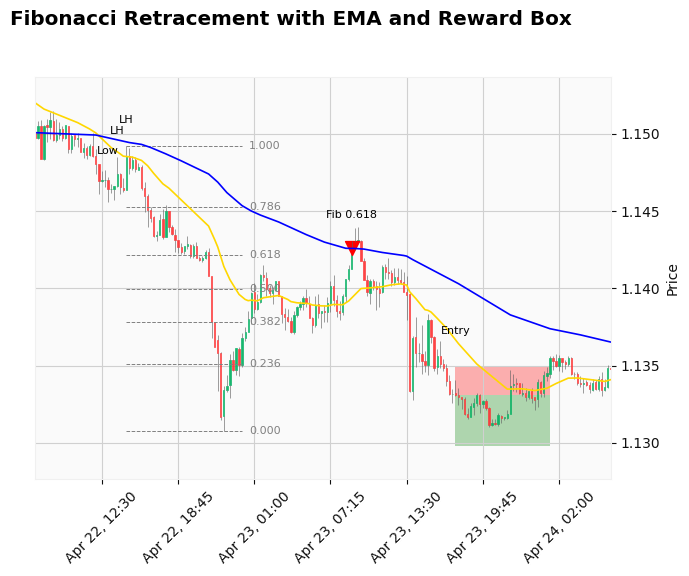

[2025-04-24 01:15:00] STOP LOSS triggered.
[2025-04-24 01:15:00] Exited ENTER_MARKET — resetting FSM to IDLE
[2025-04-24 07:00:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 7736
[2025-04-24 11:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-24 12:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-04-24 19:15:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


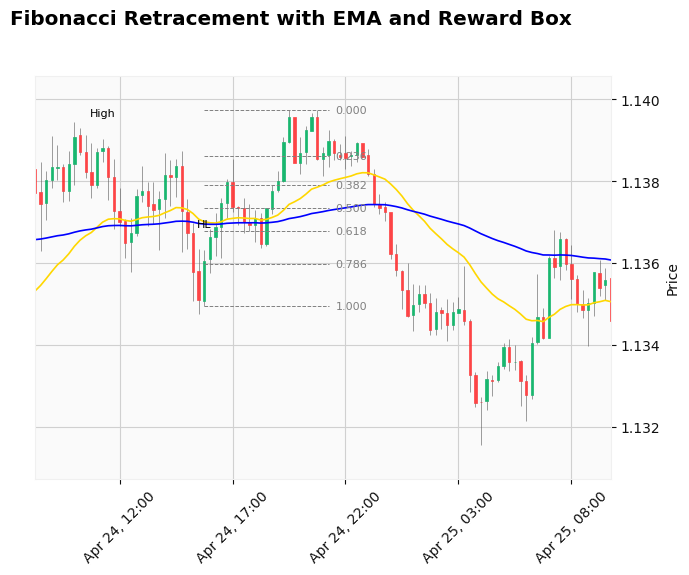

[2025-04-24 22:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


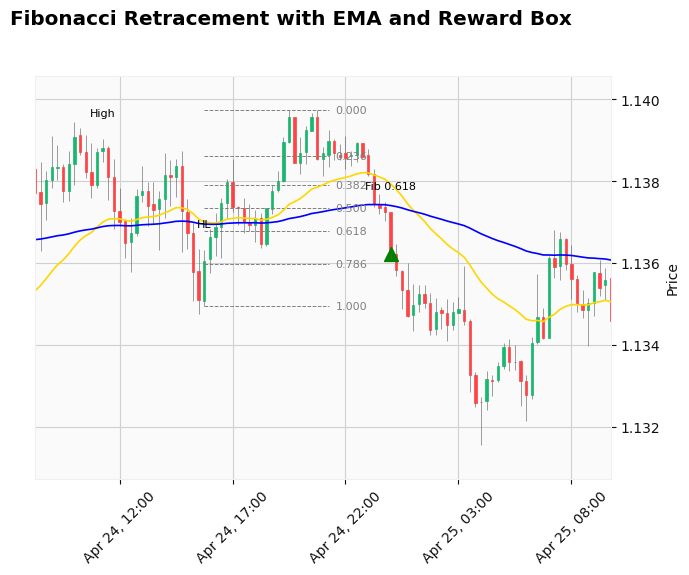

[2025-04-25 00:00:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)
[2025-04-25 00:45:00] State: ENTRY_SIGNAL → PULLBACK_DETECTED (bull, Invalidated)
self.trend_changing_idx 7793
[2025-04-25 01:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-25 14:15:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 7853
[2025-04-25 16:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-25 16:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 7879
[2025-04-27 22:45:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-28 00:30:00] State changed: IDLE → PULLBACK_DETECTED
[2025-04-28 02:00:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


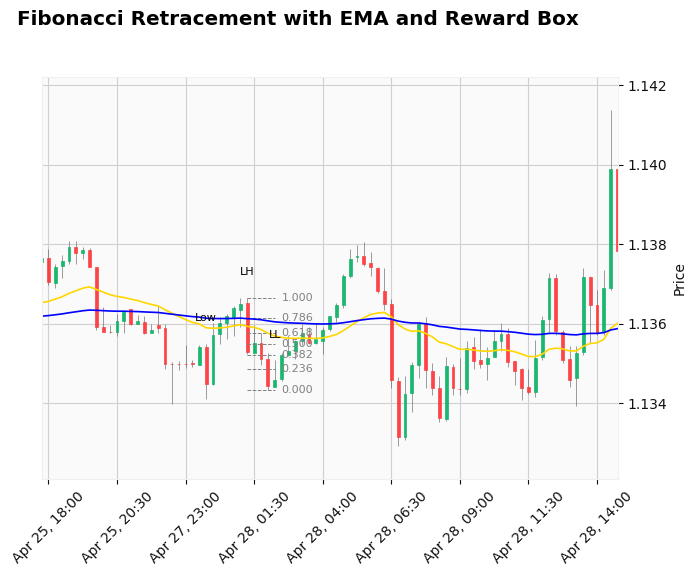

[2025-04-28 02:45:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


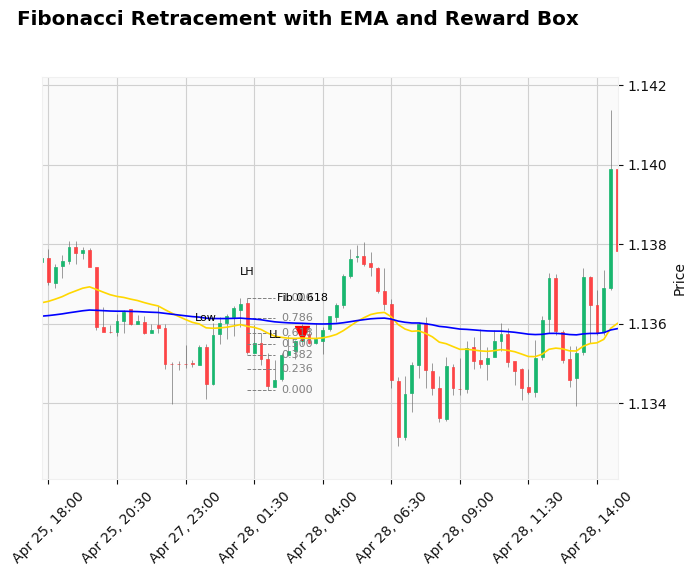

[2025-04-28 03:15:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-04-28 04:45:00] State changed: ENTRY_SIGNAL → PULLBACK_DETECTED (Invalidated)
self.trend_changing_idx 7906
[2025-04-28 05:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-28 06:00:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 7911
[2025-04-28 06:45:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-28 07:30:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 7942
[2025-04-28 14:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-04-28 23:15:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 8064
[2025-04-29 21:00:00] Trend changed from bullish to bearish, FSM RESET
[2025-04-29 22:15:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 8076
[2025-04-30 00:00:00] Trend changed from bearish to bullish, FSM RESET
self.trend_changing_idx 8078
[2025-04-30 00:30:00] Trend changed from bullish to bearish, FSM RESET
[202

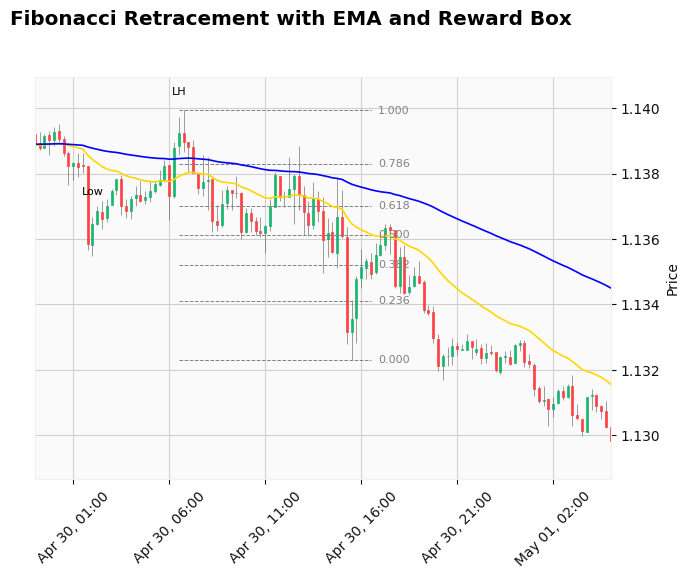

[2025-04-30 17:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-04-30 20:00:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


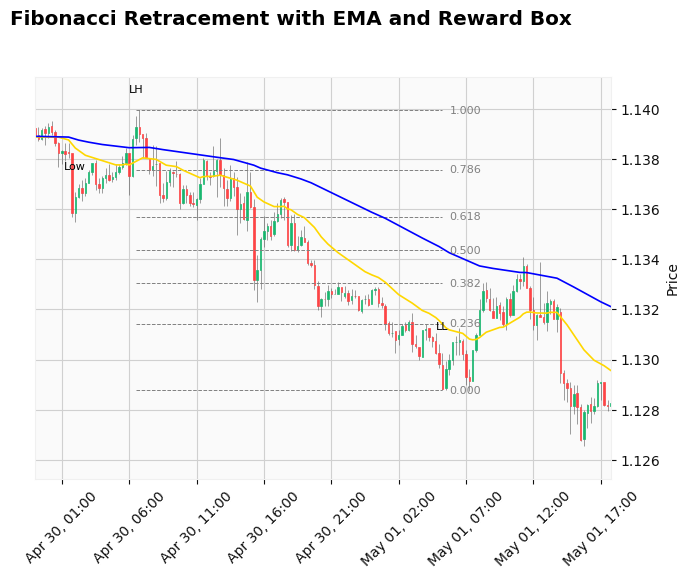

[2025-05-01 06:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-05-01 14:45:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


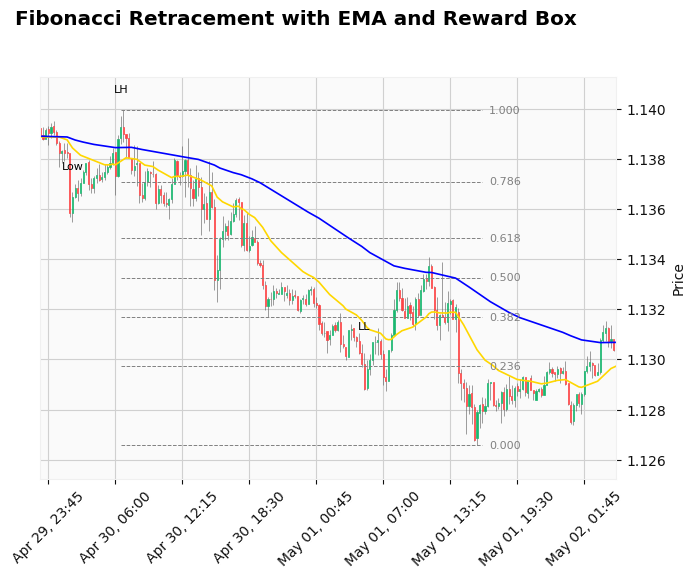

[2025-05-01 17:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
self.trend_changing_idx 8298
[2025-05-02 07:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-05-02 10:30:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-05-02 13:30:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


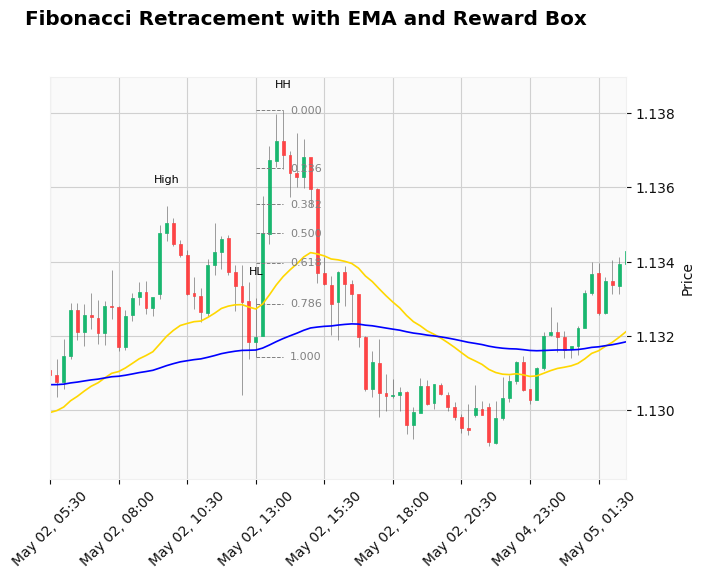

[2025-05-02 14:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


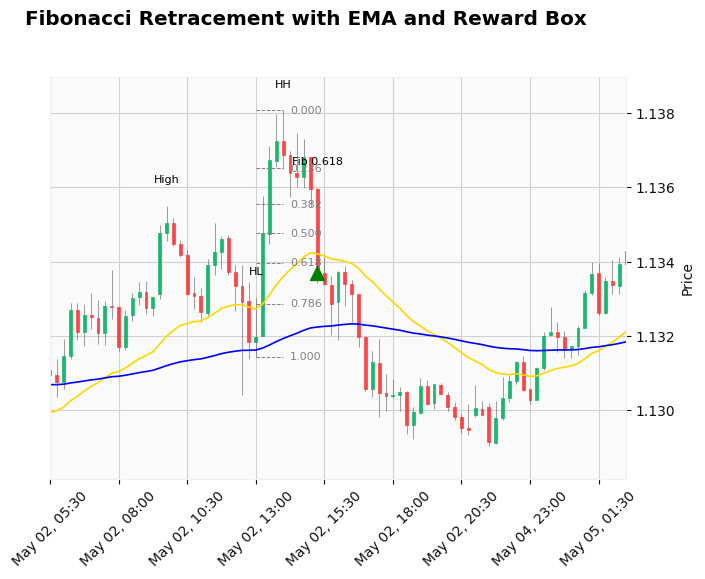

[2025-05-02 15:15:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)
[2025-05-02 17:00:00] State: ENTRY_SIGNAL → PULLBACK_DETECTED (bull, Invalidated)
self.trend_changing_idx 8347
[2025-05-02 19:45:00] Trend changed from bullish to bearish, FSM RESET
[2025-05-04 22:15:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 8372
[2025-05-05 02:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-05-05 05:45:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-05-05 11:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


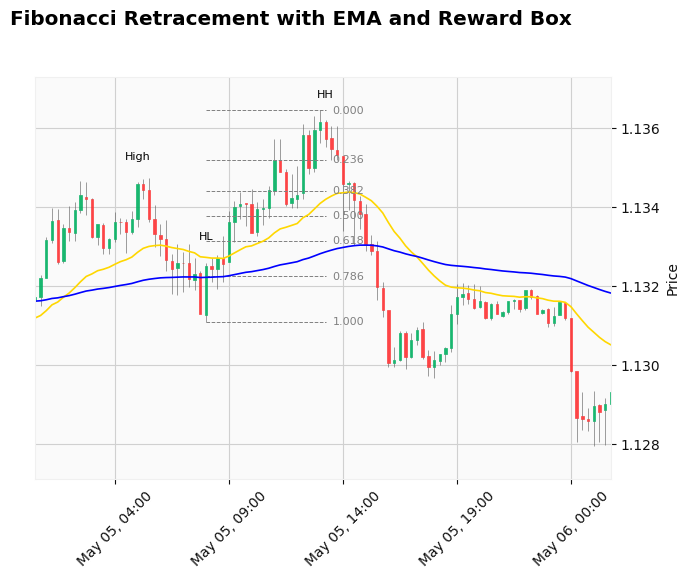

[2025-05-05 13:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


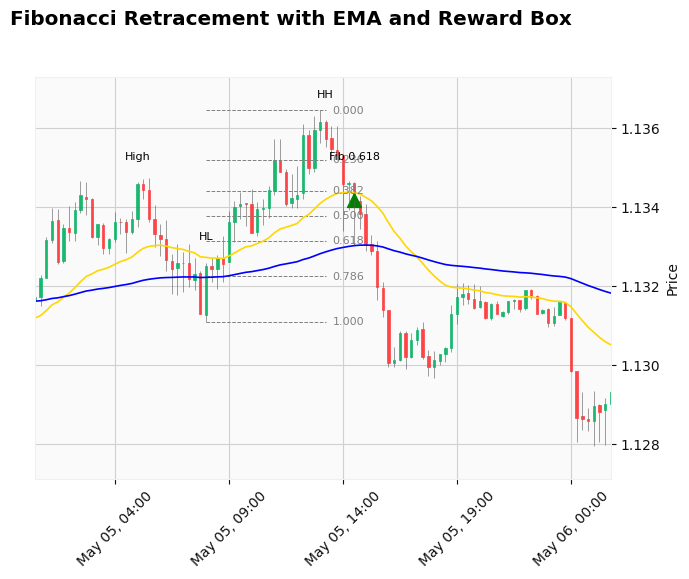

[2025-05-05 14:30:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)
[2025-05-05 16:00:00] State: ENTRY_SIGNAL → PULLBACK_DETECTED (bull, Invalidated)
self.trend_changing_idx 8433
[2025-05-05 17:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-05-05 18:30:00] State changed: IDLE → PULLBACK_DETECTED
[2025-05-06 00:00:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


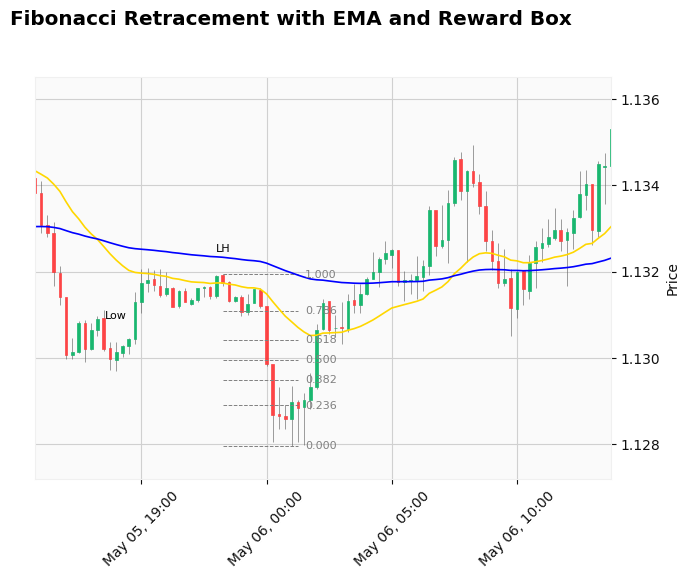

[2025-05-06 02:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


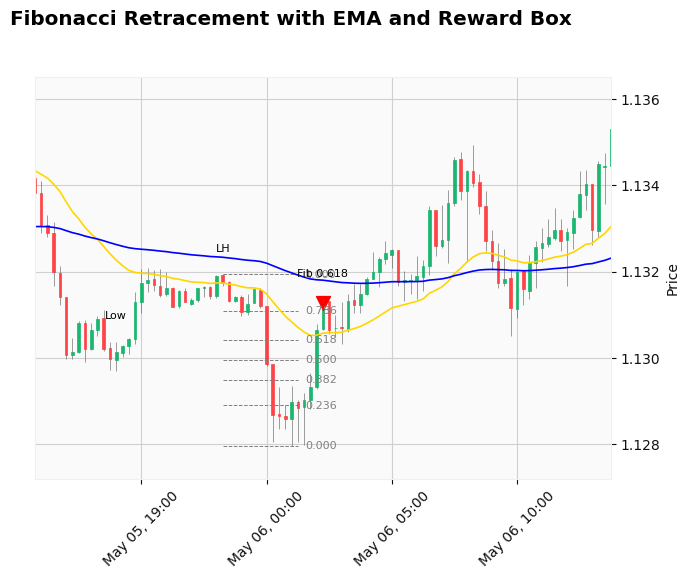

[2025-05-06 02:15:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL


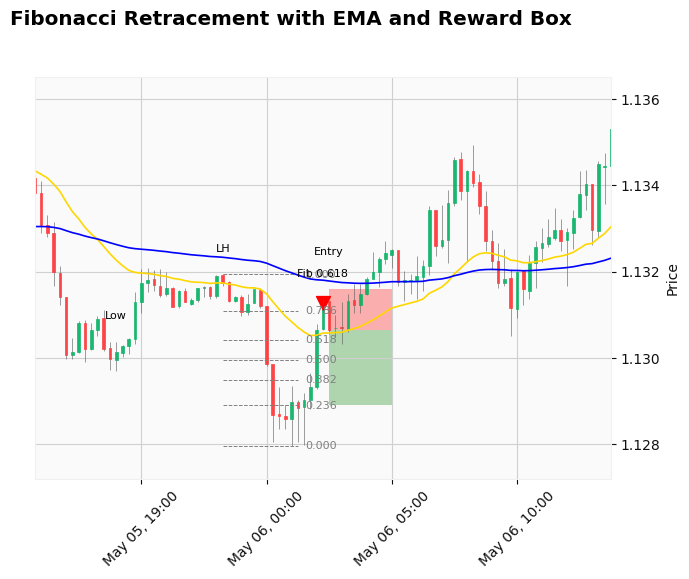

[2025-05-06 02:30:00] State changed: ENTRY_SIGNAL → ENTER_MARKET


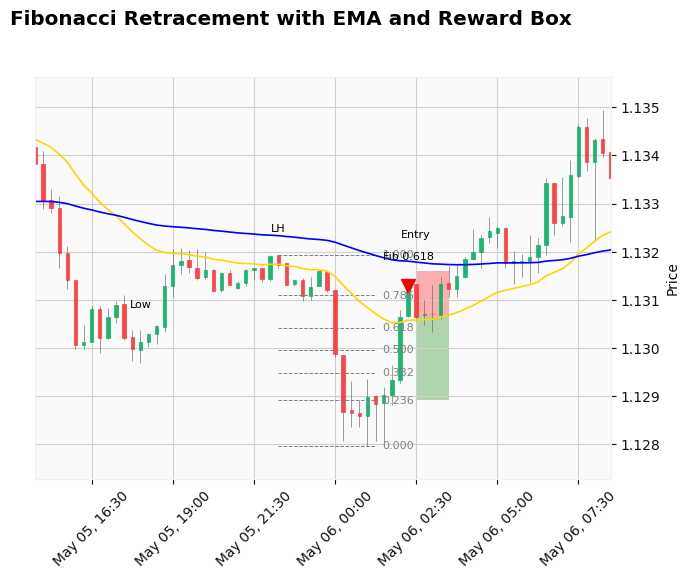

[2025-05-06 03:30:00] STOP LOSS triggered.
[2025-05-06 03:30:00] Exited ENTER_MARKET — resetting FSM to IDLE
[2025-05-06 04:15:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 8490
[2025-05-06 07:30:00] Trend changed from bearish to bullish, FSM RESET
[2025-05-06 08:45:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-05-06 13:45:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


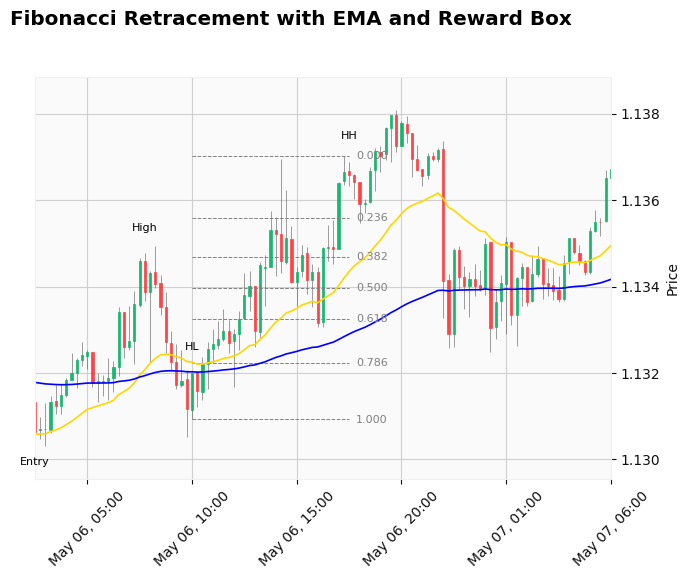

[2025-05-06 18:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-05-06 18:45:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


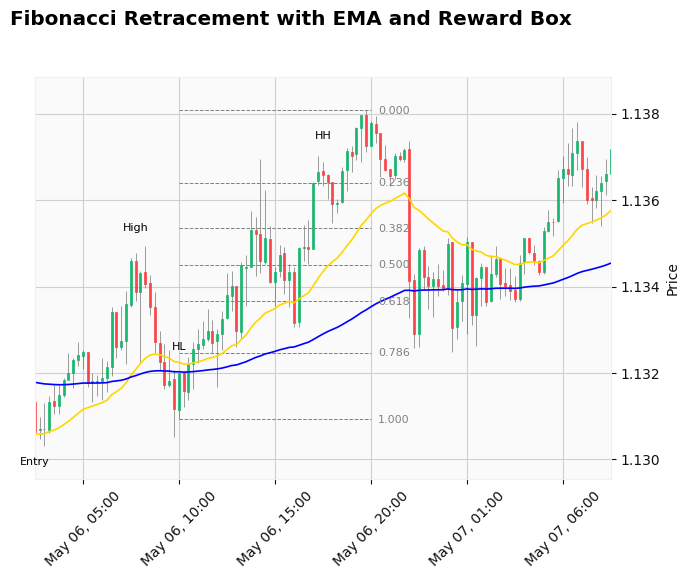

[2025-05-06 20:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


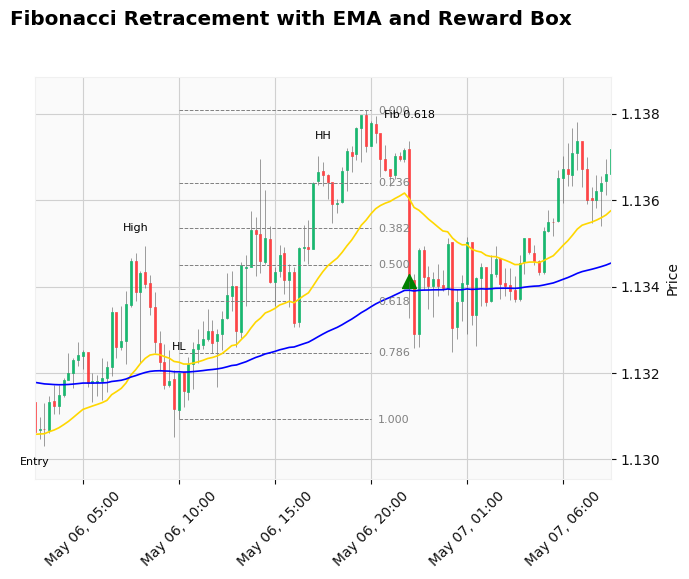

[2025-05-06 22:00:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


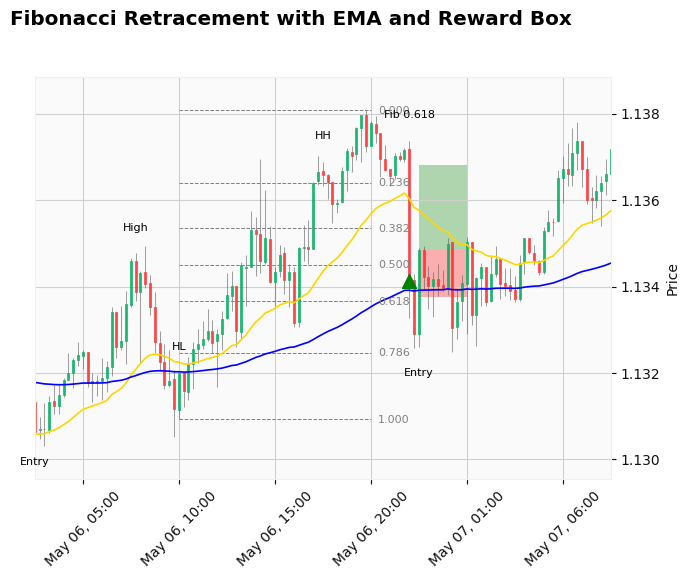

[2025-05-06 22:30:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


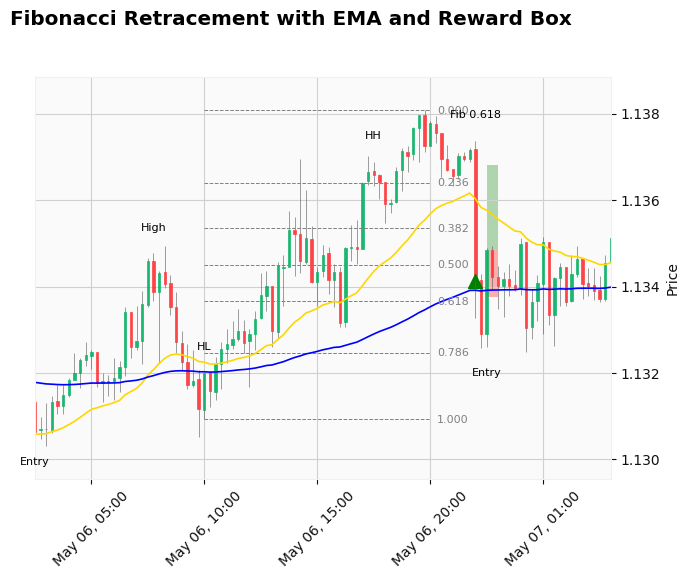

[2025-05-06 23:00:00] STOP LOSS triggered.
[2025-05-06 23:00:00] ENTER_MARKET completed – FSM reset (bull)
[2025-05-07 03:15:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 8632
[2025-05-07 19:00:00] Trend changed from bullish to bearish, FSM RESET
[2025-05-08 07:45:00] State changed: IDLE → PULLBACK_DETECTED
[2025-05-08 15:15:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


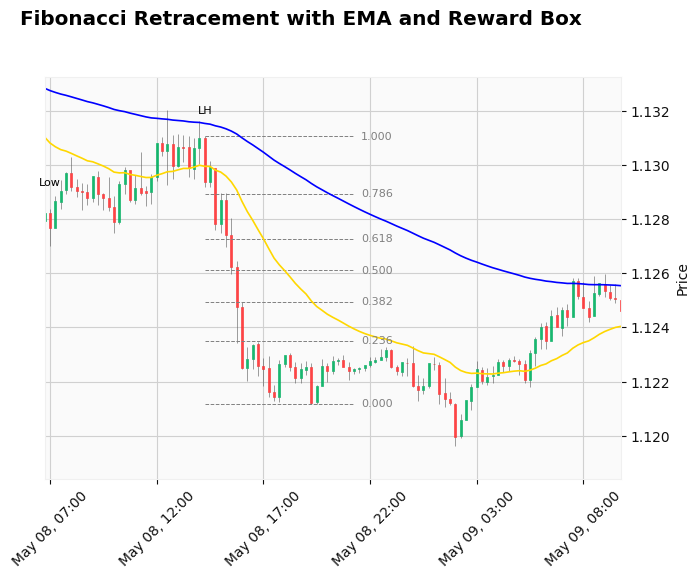

[2025-05-08 21:45:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-05-09 02:00:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


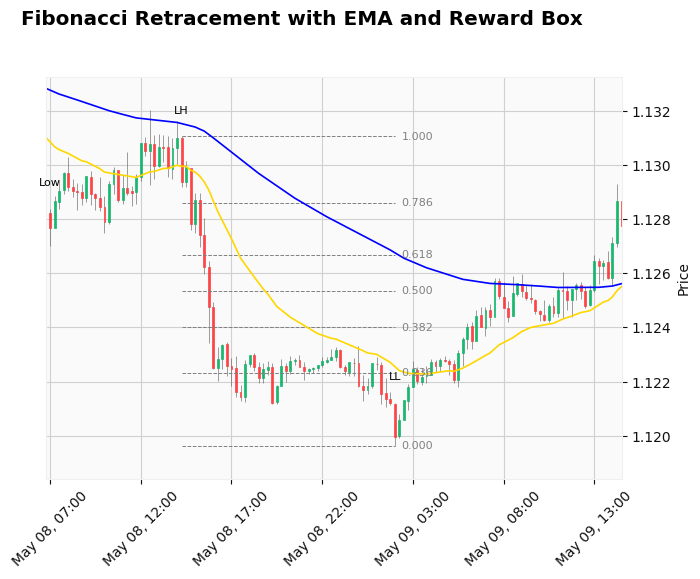

[2025-05-09 02:45:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


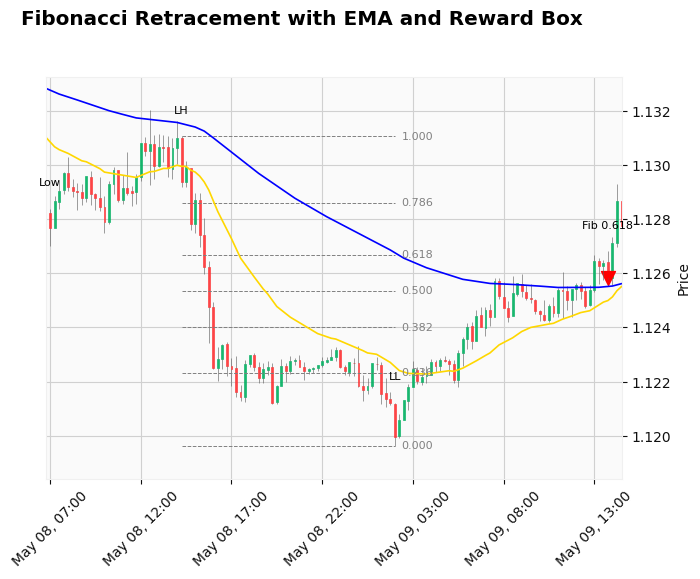

[2025-05-09 13:45:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
self.trend_changing_idx 8809
[2025-05-09 15:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-05-09 16:15:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 8830
[2025-05-09 20:30:00] Trend changed from bullish to bearish, FSM RESET
[2025-05-12 08:45:00] State changed: IDLE → PULLBACK_DETECTED
[2025-05-12 10:15:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


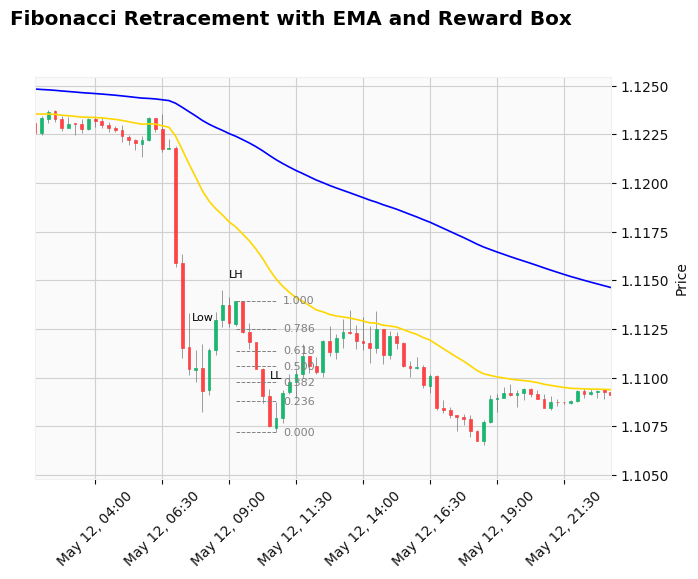

[2025-05-12 11:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


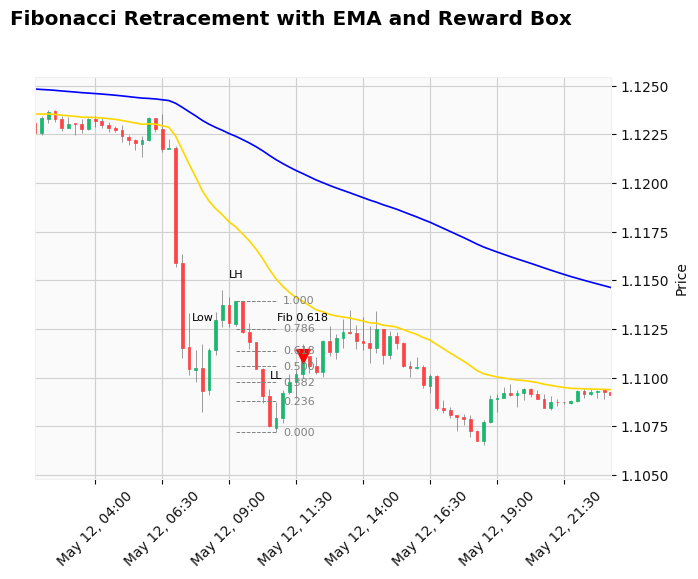

[2025-05-12 11:45:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL


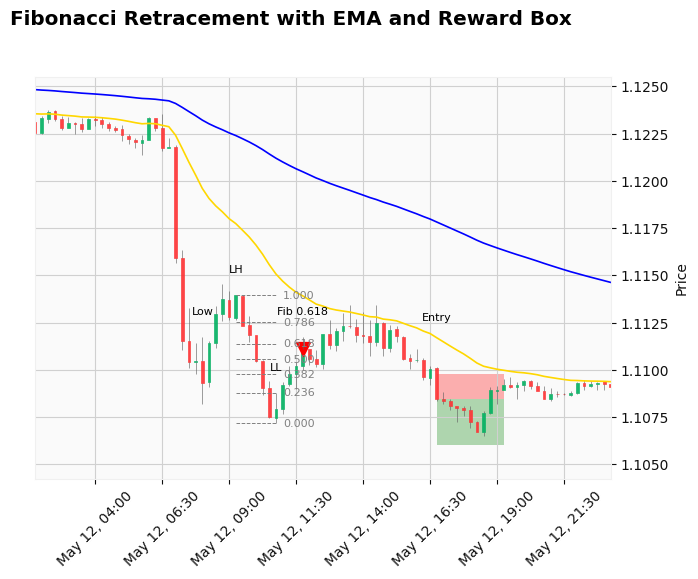

[2025-05-12 16:45:00] State changed: ENTRY_SIGNAL → ENTER_MARKET


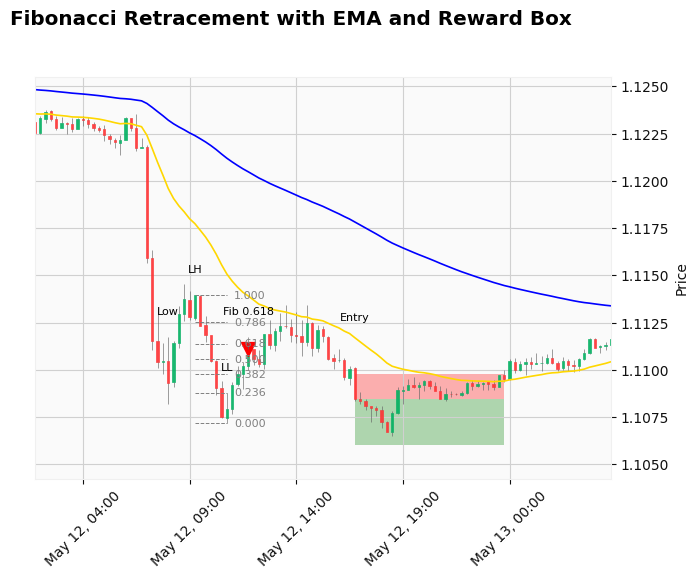

[2025-05-12 23:45:00] STOP LOSS triggered.
[2025-05-12 23:45:00] Exited ENTER_MARKET — resetting FSM to IDLE
[2025-05-13 01:45:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 9001
[2025-05-13 15:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-05-14 02:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-05-14 07:30:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


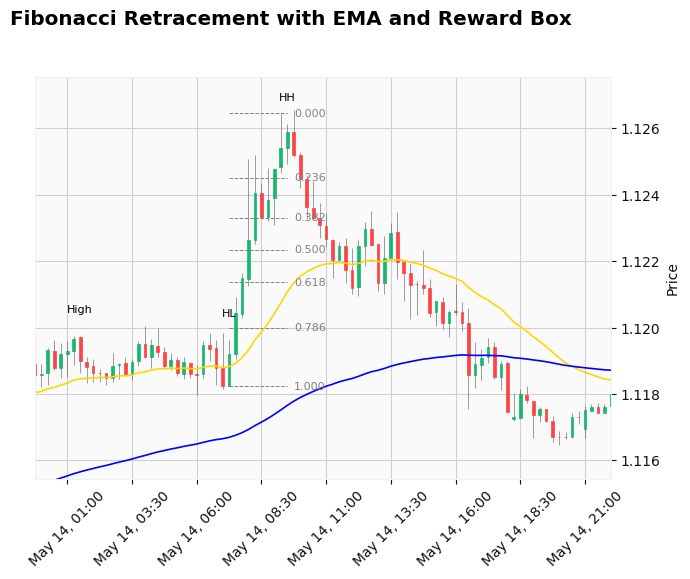

[2025-05-14 10:15:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


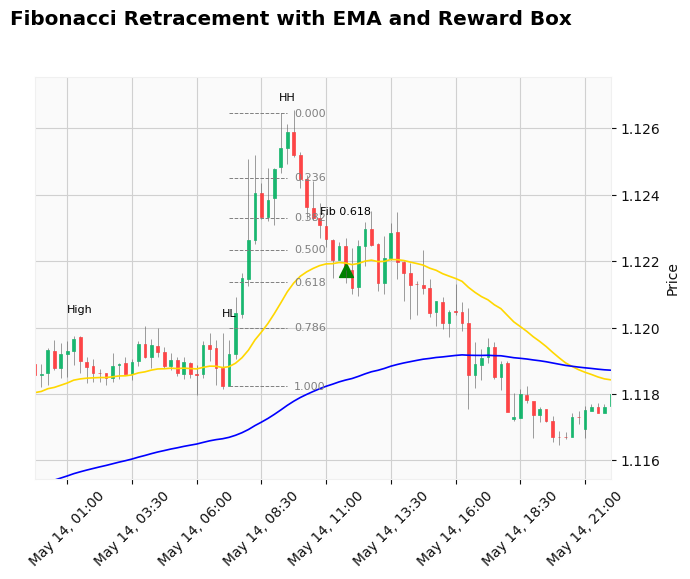

[2025-05-14 11:45:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)
[2025-05-14 18:00:00] State: ENTRY_SIGNAL → PULLBACK_DETECTED (bull, Invalidated)
self.trend_changing_idx 9118
[2025-05-14 20:30:00] Trend changed from bullish to bearish, FSM RESET
[2025-05-14 22:15:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 9140
[2025-05-15 02:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-05-15 04:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-05-15 06:15:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


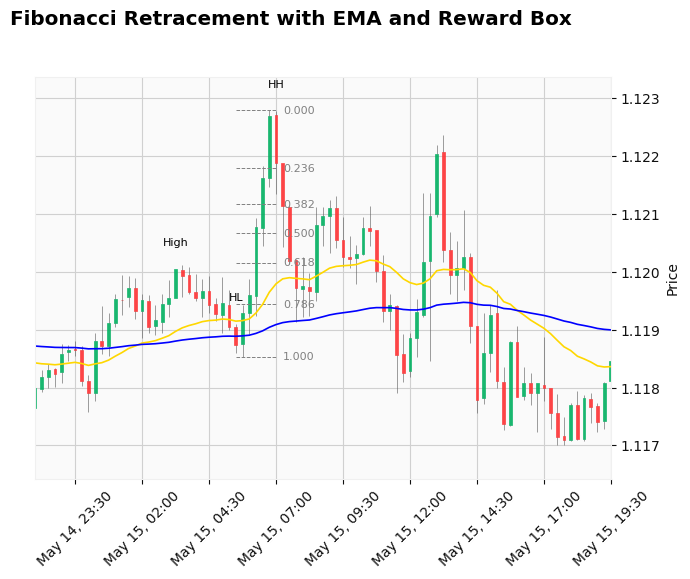

[2025-05-15 07:30:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


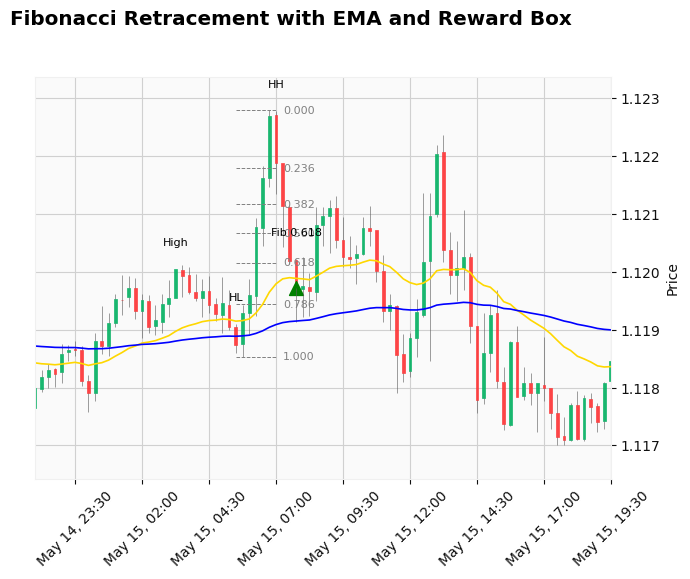

[2025-05-15 07:45:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


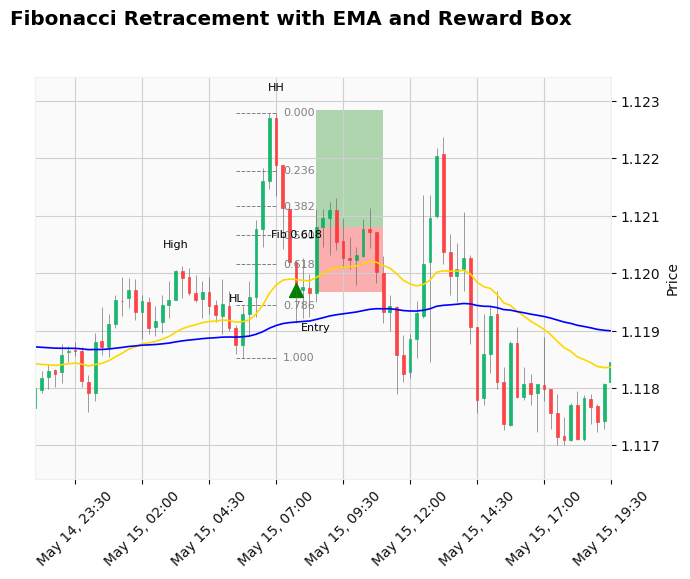

[2025-05-15 08:30:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


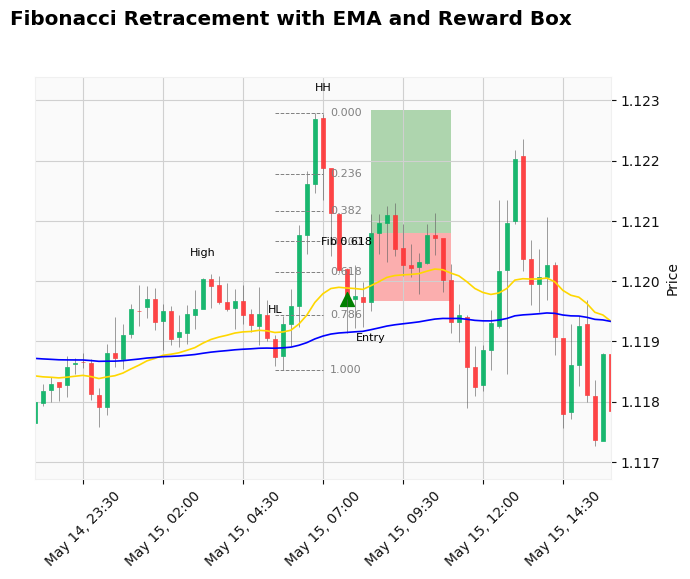

[2025-05-15 11:00:00] STOP LOSS triggered.
[2025-05-15 11:00:00] ENTER_MARKET completed – FSM reset (bull)
self.trend_changing_idx 9197
[2025-05-15 16:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-05-15 23:00:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 9232
[2025-05-16 01:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-05-16 02:45:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-05-16 05:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


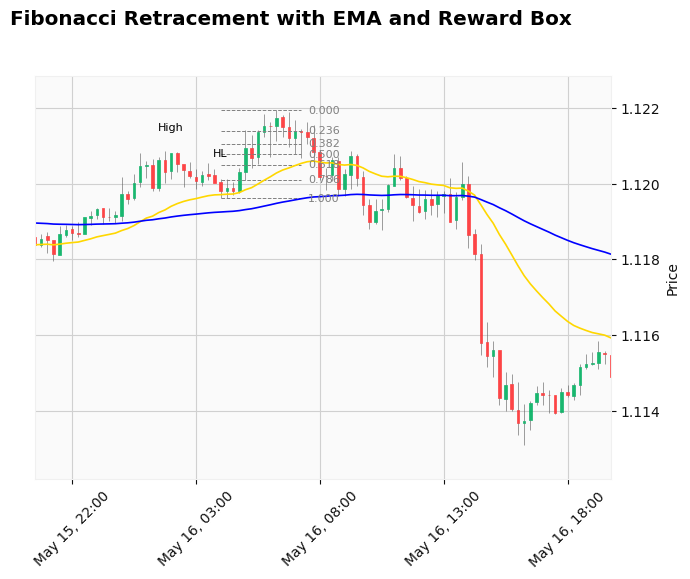

[2025-05-16 07:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


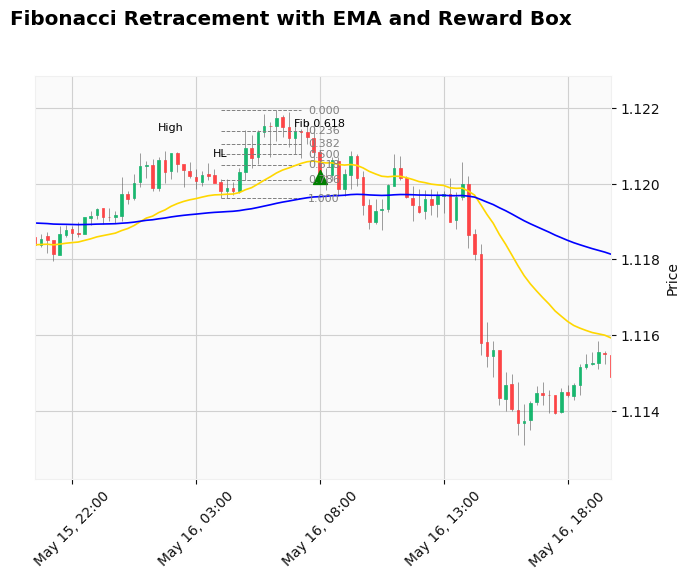

[2025-05-16 08:00:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)
[2025-05-16 09:45:00] State: ENTRY_SIGNAL → PULLBACK_DETECTED (bull, Invalidated)
self.trend_changing_idx 9286
[2025-05-16 14:30:00] Trend changed from bullish to bearish, FSM RESET
[2025-05-16 16:45:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 9348
[2025-05-19 06:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-05-19 11:30:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-05-20 19:30:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


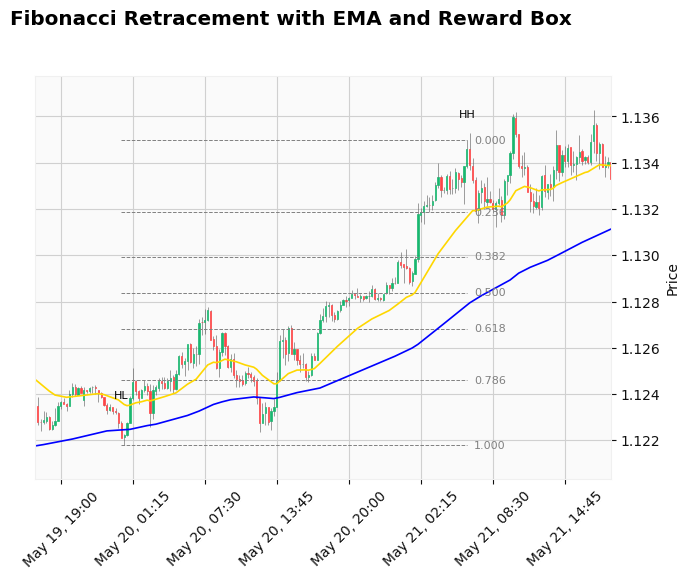

[2025-05-21 07:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
[2025-05-21 10:15:00] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)


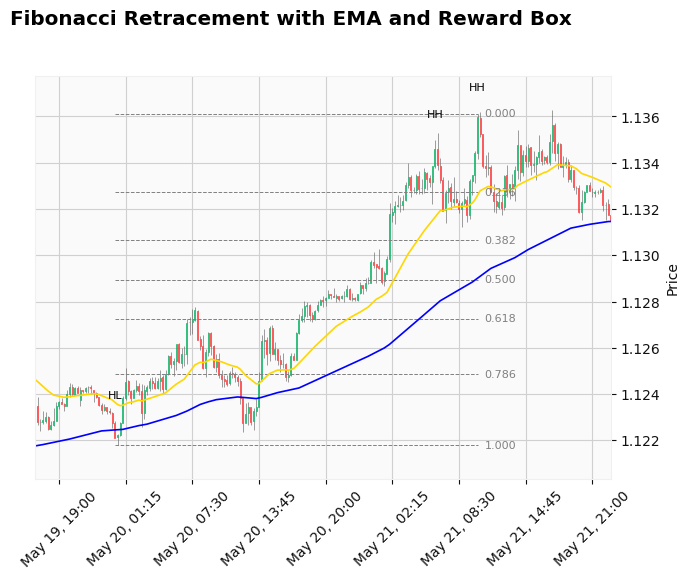

[2025-05-21 11:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)
self.trend_changing_idx 9651
[2025-05-22 09:45:00] Trend changed from bullish to bearish, FSM RESET
[2025-05-22 18:00:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 9724
[2025-05-23 04:00:00] Trend changed from bearish to bullish, FSM RESET
[2025-05-23 04:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-05-23 04:15:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)
[2025-05-23 05:30:00] State: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (bull, Invalidated)
[2025-05-23 05:45:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


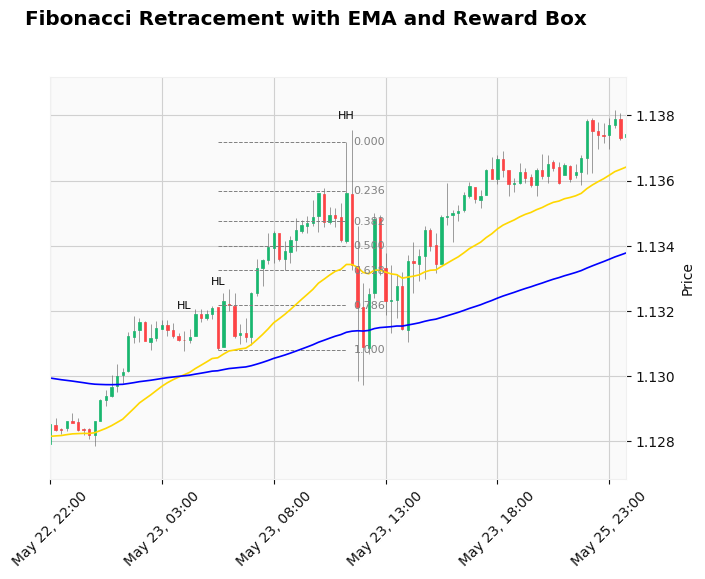

[2025-05-23 12:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


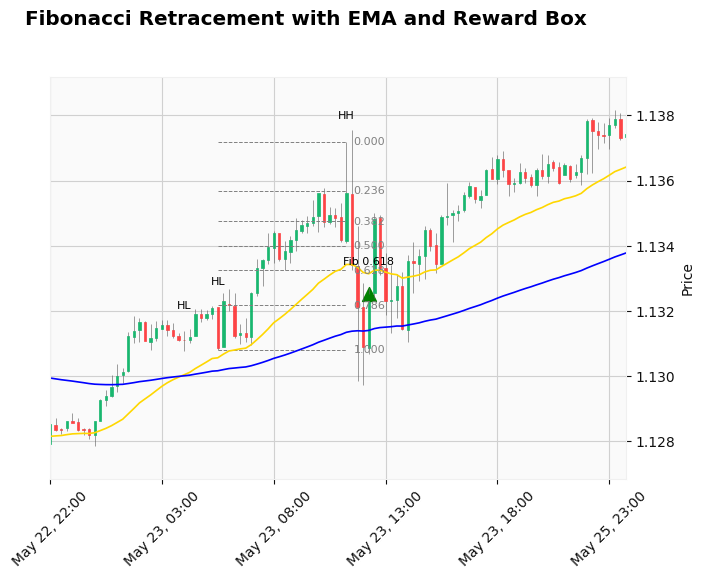

[2025-05-23 12:15:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


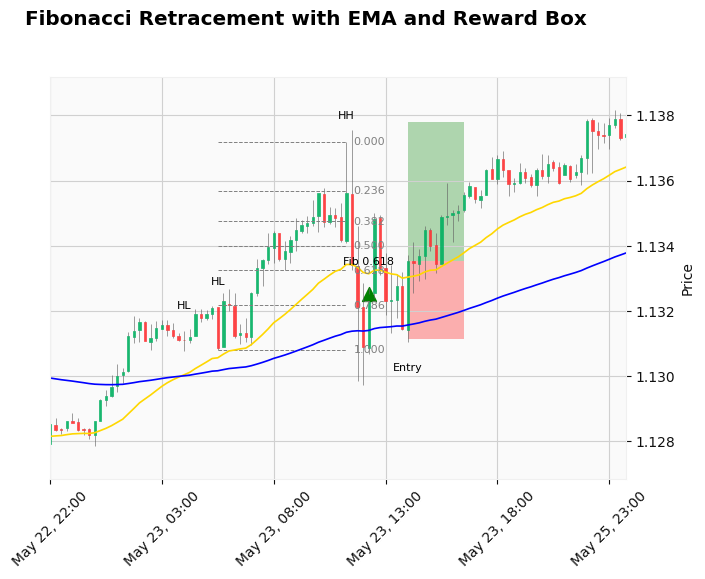

[2025-05-23 14:00:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


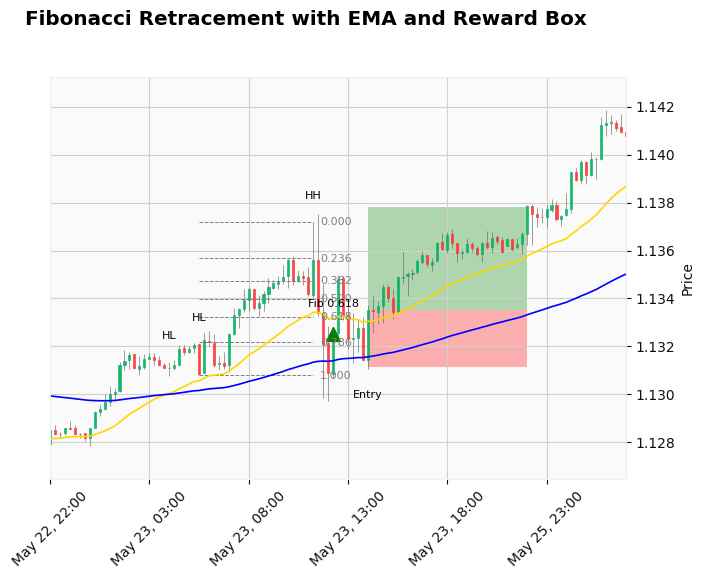

[2025-05-25 22:00:00] TAKE PROFIT triggered.
[2025-05-25 22:00:00] ENTER_MARKET completed – FSM reset (bull)
[2025-05-26 03:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-05-26 05:45:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)
[2025-05-26 07:00:00] State: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (bull, Invalidated)
self.trend_changing_idx 9930
[2025-05-27 07:30:00] Trend changed from bullish to bearish, FSM RESET
[2025-05-27 12:30:00] State changed: IDLE → PULLBACK_DETECTED
[2025-05-27 15:00:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


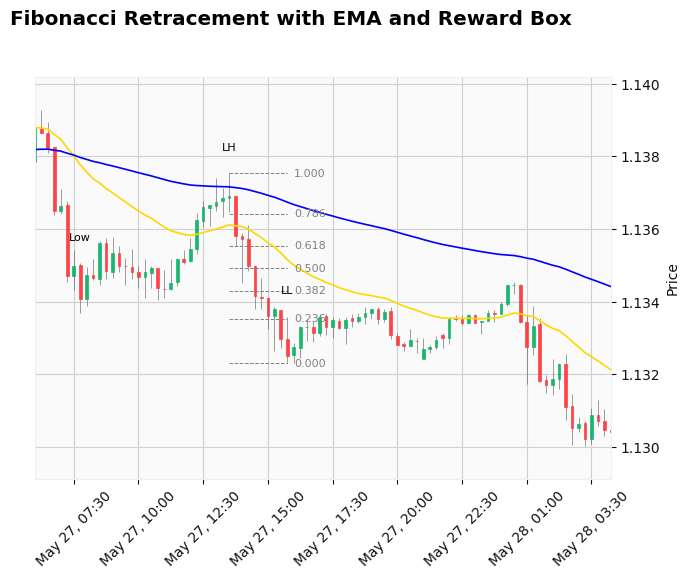

[2025-05-27 16:30:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-05-28 01:30:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


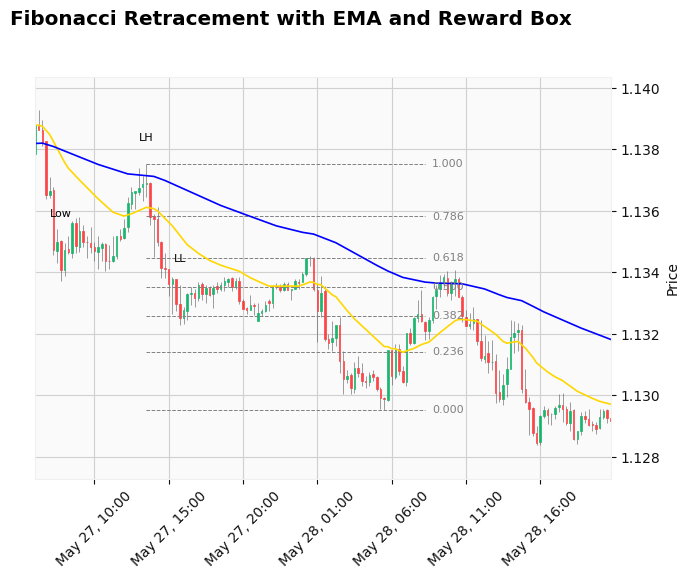

[2025-05-28 09:00:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-05-28 15:30:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


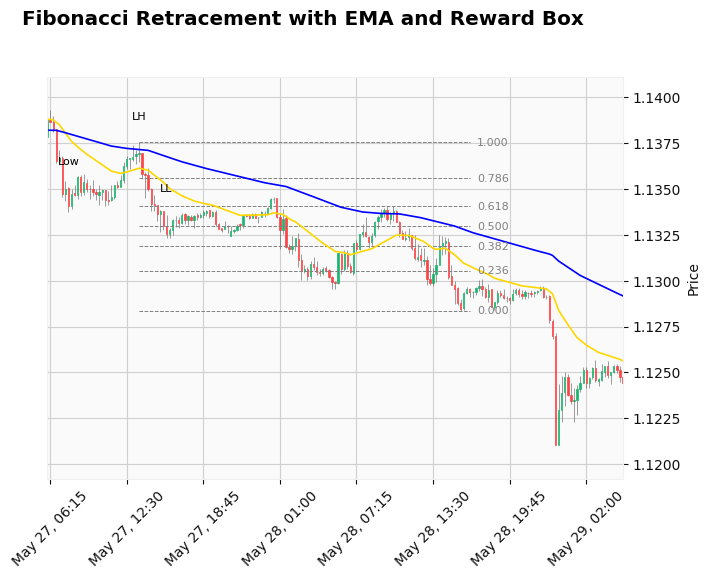

[2025-05-28 17:15:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY
[2025-05-28 23:00:00] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)


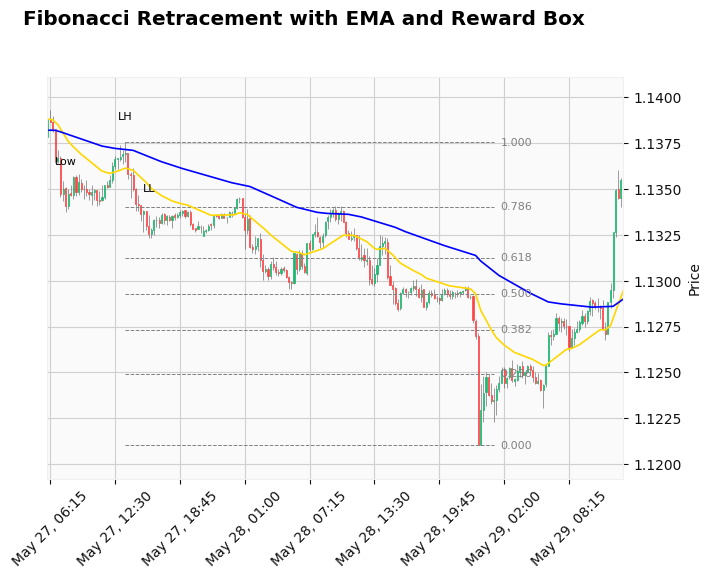

[2025-05-29 01:30:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


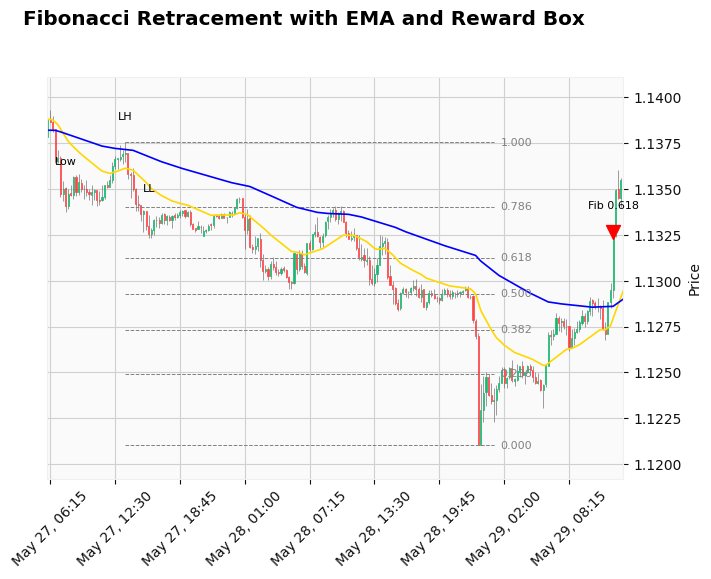

[2025-05-29 12:30:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
self.trend_changing_idx 10145
[2025-05-29 13:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-05-29 17:15:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-05-29 17:30:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)
[2025-05-30 01:45:00] State: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (bull, Invalidated)
self.trend_changing_idx 10245
[2025-05-30 14:15:00] Trend changed from bullish to bearish, FSM RESET
self.trend_changing_idx 10247
[2025-05-30 14:45:00] Trend changed from bearish to bullish, FSM RESET
[2025-05-30 20:30:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-06-02 00:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


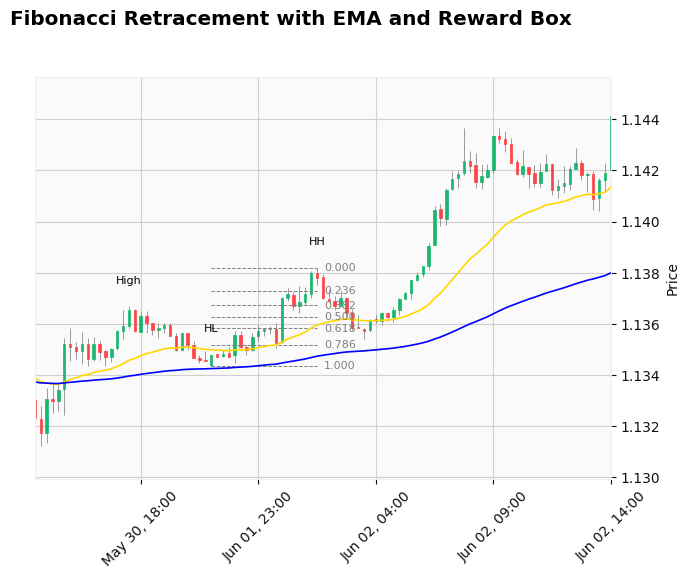

[2025-06-02 02:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


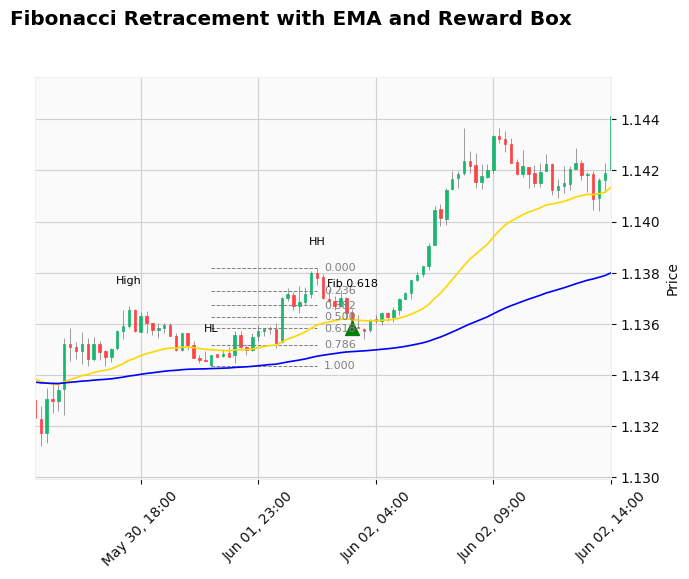

[2025-06-02 03:00:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


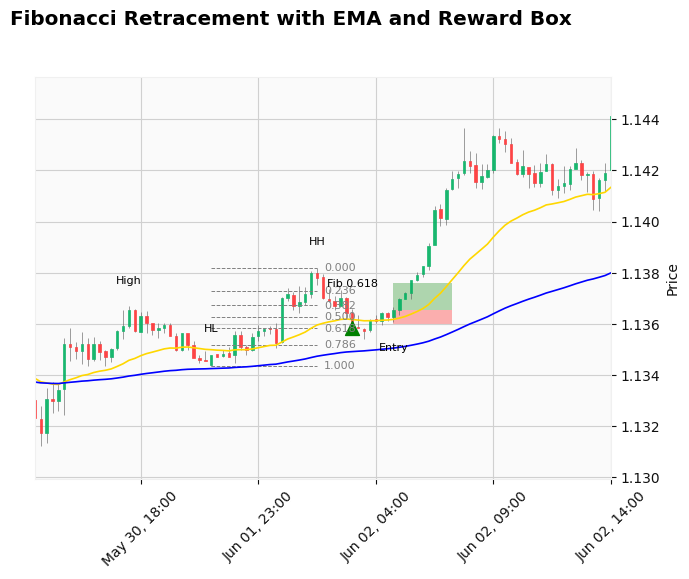

[2025-06-02 04:45:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


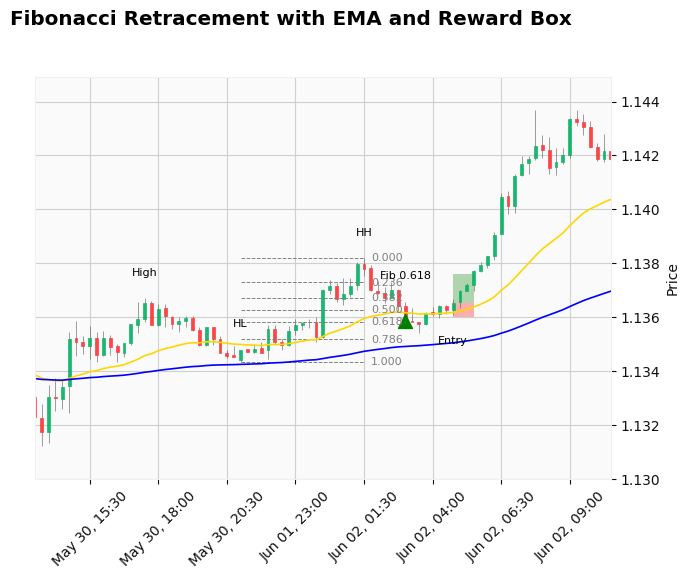

[2025-06-02 05:30:00] TAKE PROFIT triggered.
[2025-06-02 05:30:00] ENTER_MARKET completed – FSM reset (bull)
[2025-06-02 10:00:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-06-02 14:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


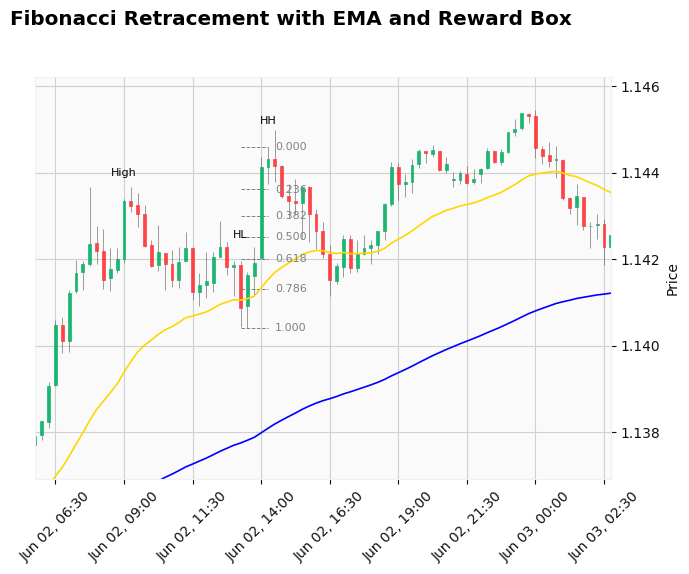

[2025-06-02 15:00:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


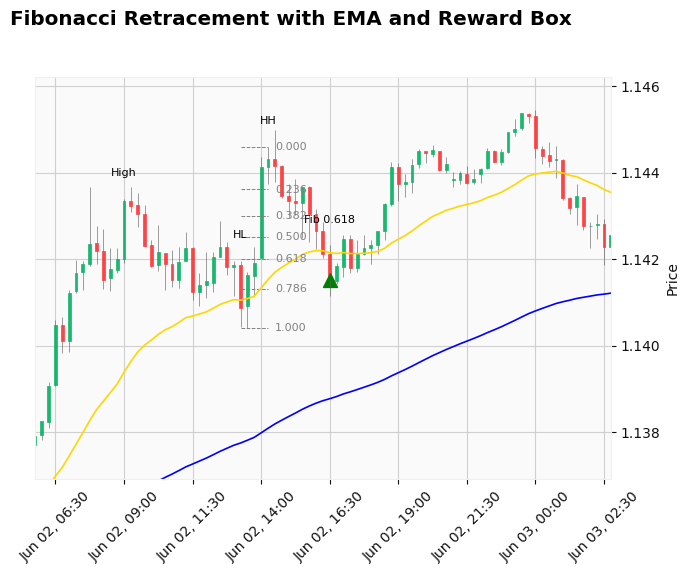

[2025-06-02 16:30:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


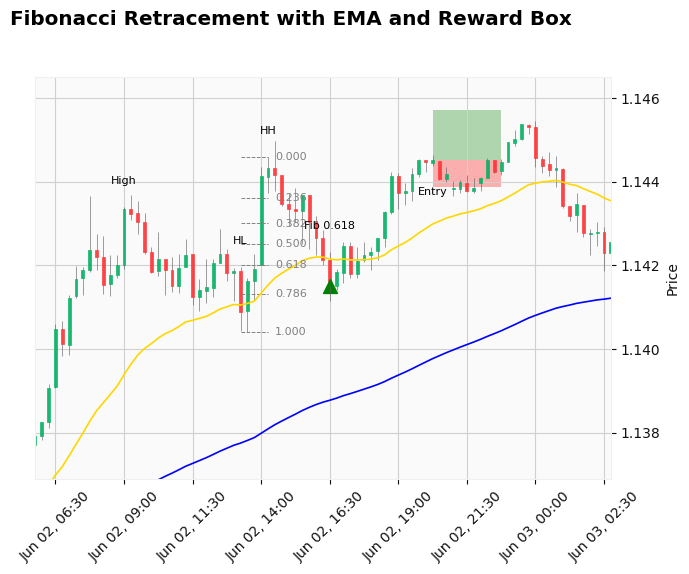

[2025-06-02 20:15:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


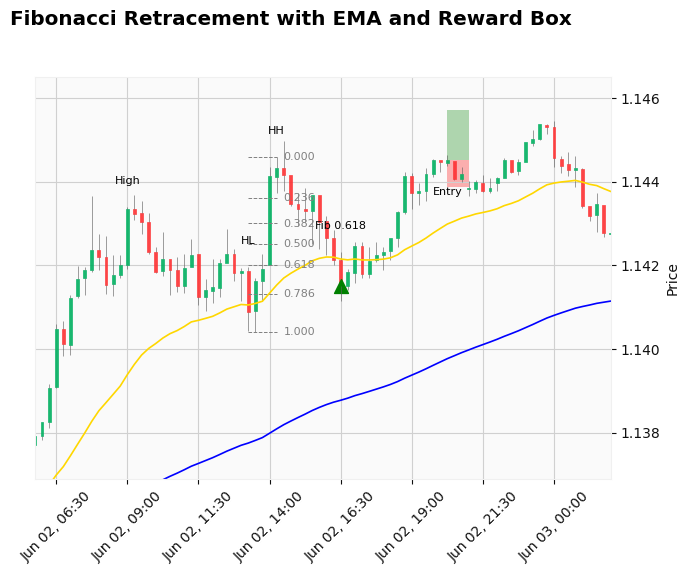

[2025-06-02 21:00:00] STOP LOSS triggered.
[2025-06-02 21:00:00] ENTER_MARKET completed – FSM reset (bull)
[2025-06-03 00:15:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 10425
[2025-06-03 11:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-06-03 14:45:00] State changed: IDLE → PULLBACK_DETECTED
[2025-06-03 15:30:00] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE


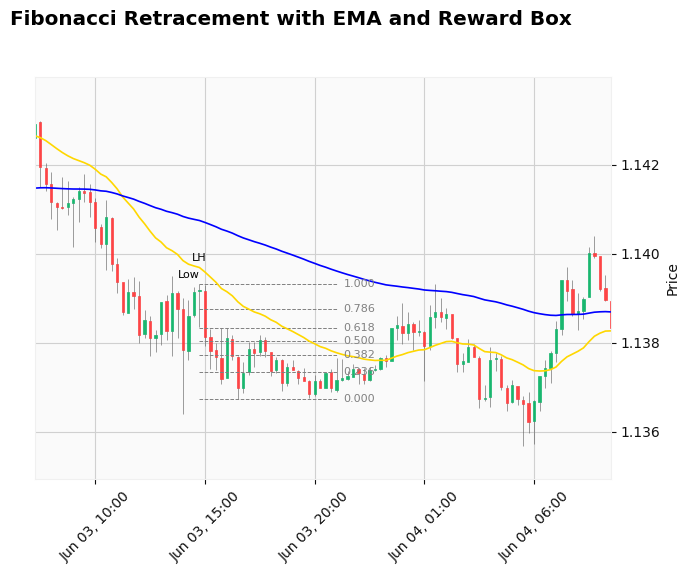

[2025-06-03 21:45:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


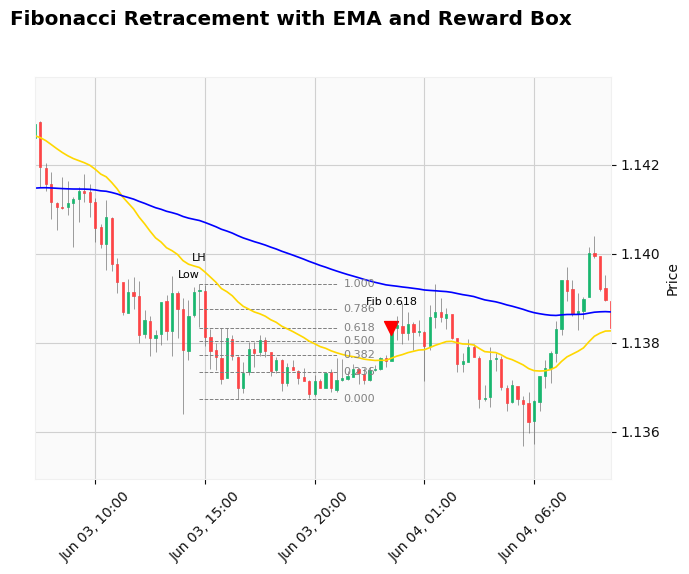

[2025-06-03 23:30:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-06-04 03:30:00] State changed: ENTRY_SIGNAL → BREAK_OF_STRUCTURE (Invalidated)


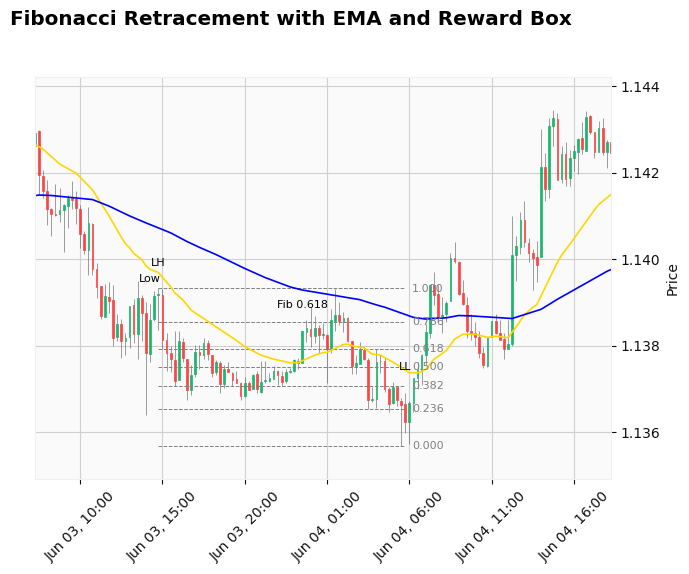

[2025-06-04 06:30:00] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY


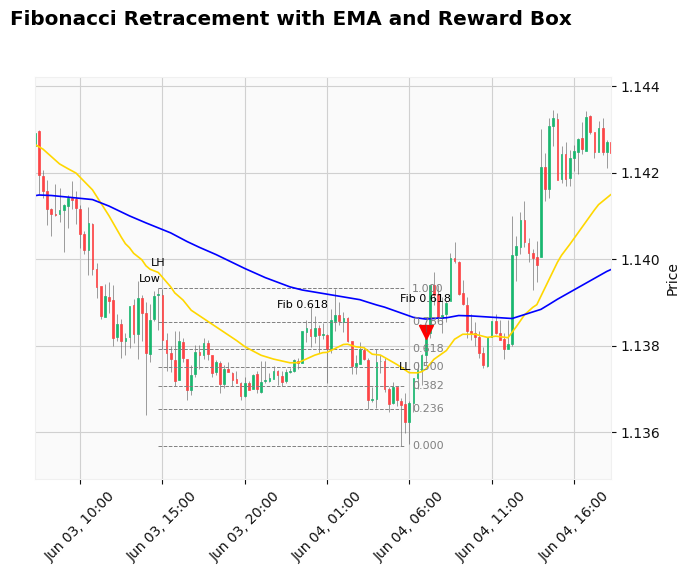

[2025-06-04 07:00:00] State changed: WAITING_ENTRY → ENTRY_SIGNAL
[2025-06-04 07:15:00] State changed: ENTRY_SIGNAL → PULLBACK_DETECTED (Invalidated)
self.trend_changing_idx 10529
[2025-06-04 13:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-06-04 13:30:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-06-04 14:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)


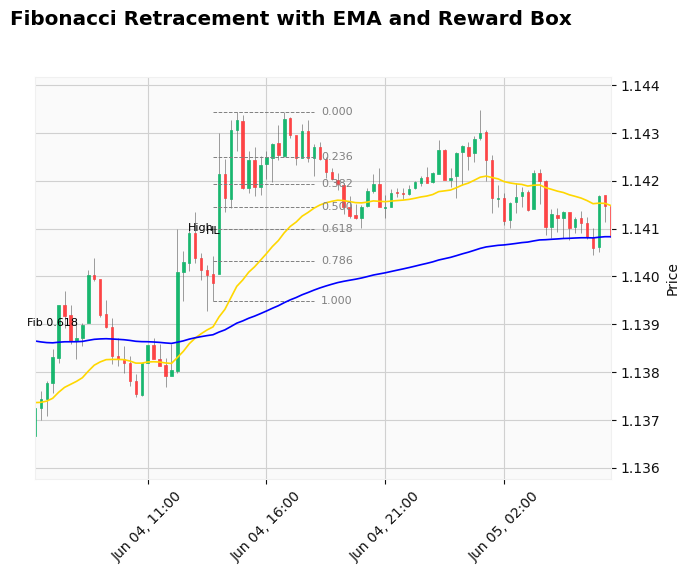

[2025-06-04 18:45:00] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)


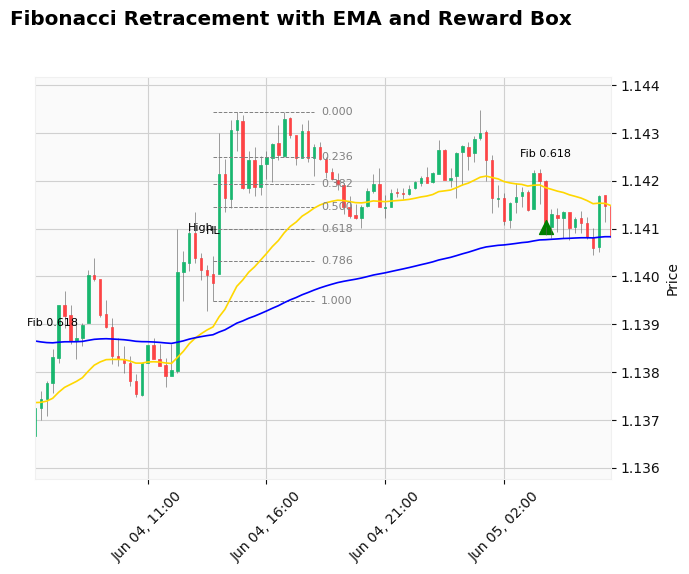

[2025-06-05 03:45:00] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)


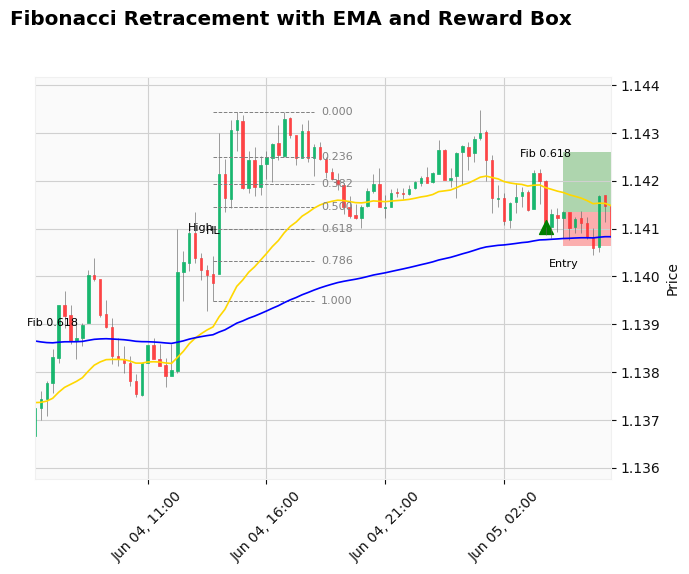

[2025-06-05 04:30:00] State: ENTRY_SIGNAL → ENTER_MARKET (bull)


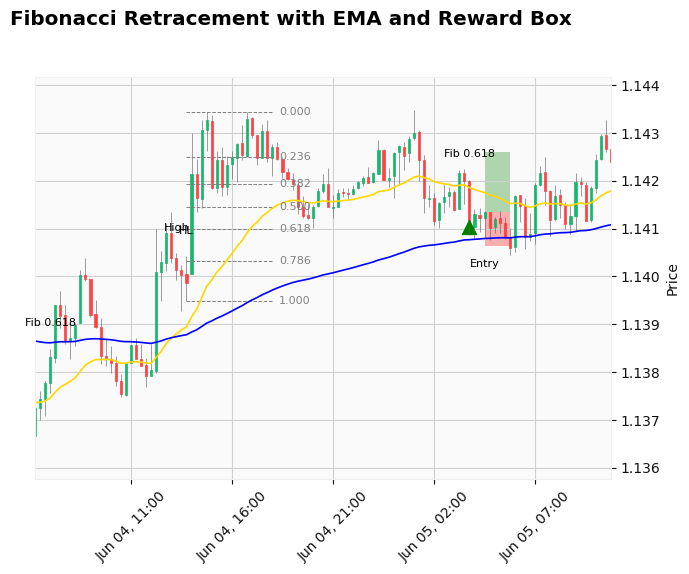

[2025-06-05 05:45:00] STOP LOSS triggered.
[2025-06-05 05:45:00] ENTER_MARKET completed – FSM reset (bull)
[2025-06-05 14:45:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 10703
[2025-06-06 08:45:00] Trend changed from bullish to bearish, FSM RESET
[2025-06-06 14:00:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 10789
[2025-06-09 06:15:00] Trend changed from bearish to bullish, FSM RESET
[2025-06-09 13:00:00] State: IDLE → PULLBACK_DETECTED (bull)
self.trend_changing_idx 10817
[2025-06-09 13:15:00] Trend changed from bullish to bearish, FSM RESET
[2025-06-09 13:45:00] State changed: IDLE → PULLBACK_DETECTED
self.trend_changing_idx 10831
[2025-06-09 16:45:00] Trend changed from bearish to bullish, FSM RESET
[2025-06-09 19:45:00] State: IDLE → PULLBACK_DETECTED (bull)
[2025-06-10 00:00:00] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)
[2025-06-10 01:15:00] State: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (bull, Invalidated)
self.trend_changing

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assume plot_fibonacci_candlestick is defined elsewhere and works as expected.
# from your_plotting_module import plot_fibonacci_candlestick

class TradingFSM:  # Finite State Machine
    """
    A Finite State Machine to identify and manage trading setups for both bearish and bullish trends.
    """
    def __init__(self, df):
        """
        Initializes the FSM with the market data and default state values.
        """
        self.df = df
        # --- State Management ---
        self.state = "IDLE"  # The current state of the FSM.
        self.enter_market_trade_side = None  # Tracks if the active trade is 'bullish' or 'bearish'.

        # --- Price Structure Points ---
        self.low_price = None         # The lowest price point of a key structure.
        self.low_price_idx = None     # The index of the lowest price point.
        self.high_price = None        # The highest price point of a key structure.
        self.high_price_idx = None    # The index of the highest price point.
        self.trend_changing_idx = 3   # Index where the last major trend change occurred.

        # --- Fibonacci and Trade Entry ---
        self.fib_labels = []          # Stores labels and prices for plotted Fibonacci levels.
        self.fib_dict = {}            # A dictionary mapping Fibonacci levels to prices.
        self.entry_signal_idx = None      # The index of the candle that triggered the entry signal.
        self.engulfing_candle_idx = None  # The index of the engulfing candle that confirms the trade.

        # --- Trade Management ---
        self.stop_loss_price = None
        self.take_profit_price = None

        # --- Configuration (do not reset) ---
        self.atr_period = 14
        self.atr_multiplier = 1.0
        self.risk_reward_ratio = 1.8

    def update(self, idx):
        """
        Updates the FSM state based on the data at the current index (candle).
        This is the core logic engine of the FSM.
        """
        # Ignore the first few candles to ensure enough historical data for calculations.
        if idx < 3:
            return

        # --- Pre-calculate Series for Performance ---
        # Cache DataFrame columns as NumPy arrays for faster access in the loop.
        trend = self.df['trend'].values
        greens = self.df["Green"]
        opens = self.df["Open"].values
        closes = self.df["Close"].values
        highs = self.df["High"].values
        lows = self.df["Low"].values

        # Determine the lowest and highest points of the candle bodies.
        lowest_body_price = np.select([greens == True, greens == False], [opens, closes], default=np.inf)
        highest_body_price = np.select([greens == True, greens == False], [closes, opens], default=-np.inf)

        current_trend = trend[idx]
        prev_trend = trend[idx - 1]

        # --- Trend Change Detection ---
        # If the overall market trend (e.g., from EMAs) changes, reset the FSM.
        if current_trend != prev_trend:
            self.trend_changing_idx = idx
            print(f"self.trend_changing_idx {idx}")
            # Only reset if not already in an active trade.
            if self.state != "ENTER_MARKET":
                self.reset()
                print(f"[{self.df.index[idx]}] Trend changed from {prev_trend} to {current_trend}, FSM RESET")
            elif self.state == "ENTER_MARKET":
                print(f"[{self.df.index[idx]}] Trend changed from {prev_trend} to {current_trend} during active trade.")

        # =================================================================
        # ========================  BEARISH LOGIC  ========================
        # =================================================================
        # NOTE: `is not` is used for identity check. For string comparison, `!=` is safer.
        if (current_trend == "bearish" and self.enter_market_trade_side is not "bullish"):

            # --- State: IDLE ---
            if self.state == "IDLE":
                # Look for a pullback (e.g., 3+ green candles) to start a potential setup.
                if self.check_pullback(greens, opens, closes, idx, "bearish"):
                    # Find the lowest point since the last trend change to mark the start of the pullback.
                    self.low_price = lowest_body_price[self.trend_changing_idx:idx+1].min()
                    self.low_price_idx = self.trend_changing_idx + np.argmin(lowest_body_price[self.trend_changing_idx:idx+1])
                    self.df.loc[self.df.index[self.low_price_idx], "label"] = 'Low'
                    # Transition to the next state.
                    self.state = "PULLBACK_DETECTED"
                    print(f"[{self.df.index[idx]}] State changed: IDLE → PULLBACK_DETECTED")

            # --- State: PULLBACK_DETECTED ---
            elif self.state == "PULLBACK_DETECTED":
                # If price breaks below the initial low, it confirms a break of structure.
                if lowest_body_price[idx] < self.low_price:
                    # The peak of the pullback becomes the 'Lower High' (LH).
                    self.high_price = highest_body_price[self.low_price_idx:idx].max()
                    self.high_price_idx = self.low_price_idx + np.argmax(highest_body_price[self.low_price_idx:idx])
                    self.df.loc[self.df.index[self.high_price_idx], "label"] = 'LH'
                    self.state = "BREAK_OF_STRUCTURE"
                    print(f"[{self.df.index[idx]}] State changed: PULLBACK_DETECTED → BREAK_OF_STRUCTURE")

            # --- State: BREAK_OF_STRUCTURE ---
            elif self.state == "BREAK_OF_STRUCTURE":
                # If price breaks above the last high (LH), the bearish structure is invalidated. Reset to find a new pullback.
                if highest_body_price[idx] > self.high_price:
                    self.low_price = lowest_body_price[self.high_price_idx:idx].min()
                    self.low_price_idx = self.high_price_idx + np.argmin(lowest_body_price[self.high_price_idx:idx])
                    self.state = "PULLBACK_DETECTED"
                    print(f"[{self.df.index[idx]}] State changed: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (Invalidated)")
                # If a new pullback occurs after the break of structure, we can draw a Fibonacci retracement.
                elif self.check_pullback(greens, opens, closes, idx, "bearish"):
                    if lowest_body_price[idx - 2] < self.low_price:
                        # Define the new 'Lower Low' (LL) which forms the anchor for the Fibonacci tool.
                        self.low_price = lowest_body_price[idx-3:idx+1].min()
                        self.low_price_idx = (idx-3) + np.argmin(lowest_body_price[idx-3:idx+1])
                        # Label the new Lower Low.
                        if self.low_price == lowest_body_price[self.high_price_idx:idx+1].min():
                            self.df.loc[self.df.index[self.low_price_idx], "label"] = 'LL'
                        # Plot the Fibonacci levels from the LH to the new LL.
                        _, _, self.fib_labels = plot_fibonacci_candlestick(self.df, self.high_price_idx, self.low_price_idx, trend="bearish")
                        self.fib_dict = dict(self.fib_labels)
                        self.state = "WAITING_ENTRY"
                        print(f"[{self.df.index[idx]}] State changed: BREAK_OF_STRUCTURE → WAITING_ENTRY")

            # --- State: WAITING_ENTRY ---
            elif self.state == "WAITING_ENTRY":
                fib_618_price = self.fib_dict.get(0.618)
                fib_000_price = self.fib_dict.get(0.000)
                # If price retraces up to the 61.8% Fibonacci level, it's an entry signal.
                if fib_618_price and highs[idx] >= fib_618_price:
                    self.entry_signal_idx = idx
                    self.df.loc[self.df.index[idx], "label"] = 'Fib 0.618'
                    plot_fibonacci_candlestick(self.df, self.high_price_idx, self.low_price_idx, trend="bearish", entry_signal=self.entry_signal_idx)
                    self.state = "ENTRY_SIGNAL"
                    print(f"[{self.df.index[idx]}] State changed: WAITING_ENTRY → ENTRY_SIGNAL")
                # If price breaks below the 0% level (LL) before hitting the entry zone, the setup is invalidated.
                elif fib_000_price and lowest_body_price[idx] <= fib_000_price:
                    self.state = "BREAK_OF_STRUCTURE"
                    print(f"[{self.df.index[idx]}] State changed: WAITING_ENTRY → BREAK_OF_STRUCTURE (Invalidated)")

            # --- State: ENTRY_SIGNAL ---
            elif self.state == "ENTRY_SIGNAL":
                fib_100_price = self.fib_dict.get(1.000)
                fib_000_price = self.fib_dict.get(0.000)
                # If price rallies past the 100% level (original LH), the trade is invalidated.
                if highest_body_price[idx] >= fib_100_price:
                    self.state = "PULLBACK_DETECTED"
                    print(f"[{self.df.index[idx]}] State changed: ENTRY_SIGNAL → PULLBACK_DETECTED (Invalidated)")
                # Look for a bearish engulfing candle as the final confirmation to enter the trade.
                elif (greens.iloc[idx - 1] is True) and (greens.iloc[idx] is not True) and (opens[idx] > closes[idx - 1]) and (closes[idx] < opens[idx - 1]):
                    self.engulfing_candle_idx = idx
                    self.df.loc[self.df.index[idx], "label"] = 'Entry'
                    # Calculate and plot the Stop Loss and Take Profit levels.
                    self.stop_loss_price, self.take_profit_price, _ = plot_fibonacci_candlestick(
                        self.df, self.high_price_idx, self.low_price_idx, trend="bearish",
                        entry_signal=self.entry_signal_idx, engulfing_candle=self.engulfing_candle_idx, R=self.risk_reward_ratio,
                        atr_period=self.atr_period, atr_multiplier=self.atr_multiplier
                    )
                    self.state = "ENTER_MARKET"
                    self.enter_market_trade_side = "bearish"
                    print(f"[{self.df.index[idx]}] State changed: ENTRY_SIGNAL → ENTER_MARKET")
                # If price breaks the low before an engulfing candle appears, invalidate.
                elif lowest_body_price[idx] <= fib_000_price:
                    self.state = "BREAK_OF_STRUCTURE"
                    print(f"[{self.df.index[idx]}] State changed: ENTRY_SIGNAL → BREAK_OF_STRUCTURE (Invalidated)")

            # --- State: ENTER_MARKET ---
            elif self.state == "ENTER_MARKET":
                # Monitor the active trade to see if Stop Loss or Take Profit is hit.
                hit = None
                if self.df['High'].iloc[idx] >= self.stop_loss_price:
                    hit = "STOP LOSS"
                elif self.df["Low"].iloc[idx] <= self.take_profit_price:
                    hit = "TAKE PROFIT"

                if hit is not None:
                    # Plot the final outcome of the trade.
                    plot_fibonacci_candlestick(
                        self.df, self.high_price_idx, self.low_price_idx, trend="bearish",
                        entry_signal=self.entry_signal_idx, engulfing_candle=self.engulfing_candle_idx,
                        R=self.risk_reward_ratio, atr_period=self.atr_period,
                        atr_multiplier=self.atr_multiplier, plot_until_idx=idx
                    )
                    print(f"[{self.df.index[idx]}] {hit} triggered.")
                    # Reset the FSM to look for the next opportunity.
                    self.reset()
                    print(f"[{self.df.index[idx]}] Exited ENTER_MARKET — resetting FSM to IDLE")

        # =================================================================
        # ========================  BULLISH LOGIC  ========================
        # =================================================================
        # This section mirrors the bearish logic for an uptrend.
        if (current_trend == "bullish" and self.enter_market_trade_side != "bearish"):

            # --- State: IDLE ---
            if self.state == "IDLE":
                if self.check_pullback(greens, opens, closes, idx, "bullish"):
                    self.high_price = highest_body_price[self.trend_changing_idx:idx+1].max()
                    self.high_price_idx = self.trend_changing_idx + np.argmax(highest_body_price[self.trend_changing_idx:idx+1])
                    self.df.loc[self.df.index[self.high_price_idx], "label"] = "High"
                    self.state = "PULLBACK_DETECTED"
                    print(f"[{self.df.index[idx]}] State: IDLE → PULLBACK_DETECTED (bull)")

            # --- State: PULLBACK_DETECTED ---
            elif self.state == "PULLBACK_DETECTED":
                if highest_body_price[idx] > self.high_price:
                    self.low_price = lowest_body_price[self.high_price_idx:idx].min()
                    self.low_price_idx = self.high_price_idx + np.argmin(lowest_body_price[self.high_price_idx:idx])
                    self.df.loc[self.df.index[self.low_price_idx], "label"] = "HL"
                    self.state = "BREAK_OF_STRUCTURE"
                    print(f"[{self.df.index[idx]}] State: PULLBACK_DETECTED → BREAK_OF_STRUCTURE (bull)")

            # --- State: BREAK_OF_STRUCTURE ---
            elif self.state == "BREAK_OF_STRUCTURE":
                if lowest_body_price[idx] < self.low_price:
                    self.high_price = highest_body_price[self.low_price_idx:idx].max()
                    self.high_price_idx = self.low_price_idx + np.argmax(highest_body_price[self.low_price_idx:idx])
                    self.state = "PULLBACK_DETECTED"
                    print(f"[{self.df.index[idx]}] State: BREAK_OF_STRUCTURE → PULLBACK_DETECTED (bull, Invalidated)")
                elif self.check_pullback(greens, opens, closes, idx, "bullish"):
                    if highest_body_price[idx - 2] > self.high_price:
                        self.high_price = highest_body_price[idx-3:idx+1].max()
                        self.high_price_idx = (idx-3) + np.argmax(highest_body_price[idx-3:idx+1])
                        if self.high_price == highest_body_price[self.low_price_idx:idx+1].max():
                            self.df.loc[self.df.index[self.high_price_idx], "label"] = "HH"
                        _, _, self.fib_labels = plot_fibonacci_candlestick(self.df, self.low_price_idx, self.high_price_idx, trend="bullish")
                        self.fib_dict = dict(self.fib_labels)
                        self.state = "WAITING_ENTRY"
                        print(f"[{self.df.index[idx]}] State: BREAK_OF_STRUCTURE → WAITING_ENTRY (bull)")

            # --- State: WAITING_ENTRY ---
            elif self.state == "WAITING_ENTRY":
                fib_618_bullish = self.fib_dict.get(0.618)
                fib_000_bullish = self.fib_dict.get(0.000)
                if fib_618_bullish and lows[idx] <= fib_618_bullish:
                    self.entry_signal_idx = idx
                    self.df.loc[self.df.index[idx], "label"] = "Fib 0.618"
                    plot_fibonacci_candlestick(self.df, self.low_price_idx, self.high_price_idx, trend="bullish", entry_signal=self.entry_signal_idx)
                    self.state = "ENTRY_SIGNAL"
                    print(f"[{self.df.index[idx]}] State: WAITING_ENTRY → ENTRY_SIGNAL (bull)")
                elif fib_000_bullish and highest_body_price[idx] > fib_000_bullish:
                    self.state = "BREAK_OF_STRUCTURE"
                    print(f"[{self.df.index[idx]}] State: WAITING_ENTRY → BREAK_OF_STRUCTURE (bull, Invalidated)")

            # --- State: ENTRY_SIGNAL ---
            elif self.state == "ENTRY_SIGNAL":
                fib_100_bullish = self.fib_dict.get(1.000)
                fib_000_bullish = self.fib_dict.get(0.000)
                if lowest_body_price[idx] <= fib_100_bullish:
                    self.state = "PULLBACK_DETECTED"
                    print(f"[{self.df.index[idx]}] State: ENTRY_SIGNAL → PULLBACK_DETECTED (bull, Invalidated)")
                elif (greens.iloc[idx-1] is not True) and (greens.iloc[idx] is True) and (opens[idx] <= closes[idx - 1]) and (closes[idx] >= opens[idx - 1]):
                    self.engulfing_candle_idx = idx
                    self.df.loc[self.df.index[idx], "label"] = "Entry"
                    self.stop_loss_price, self.take_profit_price, _ = plot_fibonacci_candlestick(
                        self.df, self.low_price_idx, self.high_price_idx, trend="bullish",
                        entry_signal=self.entry_signal_idx, engulfing_candle=self.engulfing_candle_idx, R=self.risk_reward_ratio,
                        atr_period=self.atr_period, atr_multiplier=self.atr_multiplier
                    )
                    self.state = "ENTER_MARKET"
                    self.enter_market_trade_side = "bullish"
                    print(f"[{self.df.index[idx]}] State: ENTRY_SIGNAL → ENTER_MARKET (bull)")
                elif highest_body_price[idx] >= fib_000_bullish:
                    self.state = "BREAK_OF_STRUCTURE"
                    print(f"[{self.df.index[idx]}] State: ENTRY_SIGNAL → BREAK_OF_STRUCTURE (bull, Invalidated)")

            # --- State: ENTER_MARKET ---
            elif self.state == "ENTER_MARKET":
                hit = None
                if self.df['High'].iloc[idx] >= self.take_profit_price:
                    hit = "TAKE PROFIT"
                elif self.df["Low"].iloc[idx] <= self.stop_loss_price:
                    hit = "STOP LOSS"

                if hit is not None:
                    plot_fibonacci_candlestick(
                        self.df, self.low_price_idx, self.high_price_idx, trend="bullish",
                        entry_signal=self.entry_signal_idx, engulfing_candle=self.engulfing_candle_idx,
                        R=self.risk_reward_ratio, atr_period=self.atr_period,
                        atr_multiplier=self.atr_multiplier, plot_until_idx=idx
                    )
                    print(f"[{self.df.index[idx]}] {hit} triggered.")
                    self.reset()
                    print(f"[{self.df.index[idx]}] ENTER_MARKET completed – FSM reset (bull)")

    def check_pullback(self, greens, opens, closes, idx, trend):
        """
        Identifies a pullback pattern.
        - Bearish pullback: 3-6 consecutive green candles after a red candle.
        - Bullish pullback: 3-6 consecutive red candles after a green candle.
        """
        if trend == "bearish":
            # Look for a sequence of 3 to 6 green candles.
            for window in [3, 4, 5, 6]:
                start_idx = idx - window + 1
                prev_idx = start_idx - 1
                if prev_idx < 0: continue
                # Condition 1: All candles in the window are green.
                if all(greens.iloc[idx - i] is True for i in range(window)):
                    # Condition 2: The candle before the window was red.
                    if greens.iloc[prev_idx] is False:
                        # Condition 3: The pullback is significant enough to cover the previous red candle's open.
                        if any(closes[i] >= opens[prev_idx] for i in range(start_idx, idx + 1)):
                            return True
            return False

        if trend == "bullish":
            # Look for a sequence of 3 to 6 red candles.
            for window in [3, 4, 5, 6]:
                start_idx = idx - window + 1
                prev_idx = start_idx - 1
                if prev_idx < 0: continue
                # Condition 1: All candles in the window are red.
                if all(greens.iloc[idx - i] is not True for i in range(window)):
                    # Condition 2: The candle before the window was green.
                    if greens.iloc[prev_idx] is True:
                        # Condition 3: The pullback is significant enough to cover the previous green candle's open.
                        if any(closes[i] <= opens[prev_idx] for i in range(start_idx, idx + 1)):
                            return True
            return False

    def reset(self):
        """
        Resets the FSM's state and all temporary parameters to their initial values,
        preparing it to find a new trading setup.
        """
        self.state = "IDLE"
        self.low_price = self.low_price_idx = None
        self.high_price = self.high_price_idx = None
        self.fib_labels = []
        self.fib_dict = {}
        self.entry_signal_idx = None
        self.engulfing_candle_idx = None
        self.stop_loss_price = None
        self.take_profit_price = None
        self.enter_market_trade_side = None

# --- Main Execution Block ---
# This is where the FSM is instantiated and run over the historical data.

fsm = TradingFSM(df_4h.copy())

# # Iterate through each candle in the DataFrame to update the FSM's state.
for idx in range(len(df_4h)):
    fsm.update(idx)
